# Capstone Assignment: Identifying the best candidates for habitable exoplanets among stellar hosts

**Overview**: When astronomers search for exoplanets, one of the biggest questions is whether any of them could be habitable. But instead of searching randomly, can we predict which stars are most likely to host planets in their habitable zone? This project aims to answer that question by building a model that takes in star’s and star system's characteristics (e.g. star's mass, temperature, and luminosity) and predicts whether it has at least one exoplanet in the region where liquid water could exist.

To do this, we’ll use data from the NASA Exoplanet Archive, specifically two datasets: one containing exoplanet properties and another detailing the stars that host them. By combining these datasets, we can analyze how different types of stars compare when it comes to forming planets in the habitable zone. Are stars like our Sun more likely to have them? Does a star’s metallicity play a role? We’ll explore these questions using exploratory data analysis (EDA) before moving on to building predictive models.

## 1. Getting Started

**Research question:** Can we predict whether a given star hosts at least one exoplanet in its habitable zone (HZ) based on stellar characteristics?

Note that we understand that our exoplanet detection capabilities are not perfect, so it may well be the case that many if not almost all of the stars have at least one planet in their HZ, but we just can't see them. Similar to how the number of Jupyter moons was only 17 back in 2000, but became 95 by 2025 with enhancement of our detection capabilities. However, not only we expect that certain characteristics of stars and stellar systems make it more likely to have planets in the HZ, but also we think some will make it easier for our current tech to detect exoplanets in general. Our research will be focused on figuring out such stellar and stellar systems' properties and relaying them onto Gaia star catalog to identify potential "low-hanging fruits" for further research.

**Data sources:** Our dataset comes from the NASA Exoplanet Archive at CalTech [link](https://exoplanetarchive.ipac.caltech.edu/). Specifically, we will source two tables using their Table Access Protocol (TAP): 
- **ps (Planetary Systems):** Contains information on exoplanets, including orbital parameters and discovery details.
- **stellarhosts:** Contains information on the host stars, including mass, temperature, luminosity, metallicity, and other stellar properties.

Planetary Systems table does not have an explicit flag to signal whether a planet is or is not in its stellar host's habitable zone, so we will calculate our outcome variable based on the widely accepted assumption of what habitable zone entails:
1. Stellar radiation received by the planet (stored as "insolation flux" value in **ps_insol** column) is within 0.25 to 2.00 of that of Earth receives.
2. In case **ps.ps_insol** is missing, we will approximate the insolation flux by manually calculating its approximate value from stellar luminosity **stellarhosts.st_lum** (stored in log  scale) and semi-major axis (average distance of the planet from the stellar host) **ps.pl_orbsmax**.

## 2. Reading in the Data

We'll read the **ps** and **stellarhosts** tables into **planets** and **stars** dataframes respectively using TAP from NASA Exoplanet Archive. As there's a limitation on how many lines can be queried with one call through TAP, we'll break down the queries to process the retrieval in chunks...

### 🔍 Columns Selected for Habitability Analysis

Both datasets - **ps** and **stellarhosts** - have long lists of columns for querying, but we don't need most of the columns. For example, **stellarhosts** has a column called **st_refname**, which is essentially a hyperlink an article about this star.

To assess whether an exoplanet may lie in the habitable zone (HZ), we need essential physical properties and a broader set of potentially relevant features. We also will include various identifiers of both planets and stars in case our research requires merging our data to other sources as well as coordinates of the planet/star location and some measurement attributes (such as how the planet/star was discovered or how uncertain the measurements are).

The columns we need come from two tables: **ps** (Planetary Systems) and **stellarhosts** (Stellar Host Properties). Here are the lists of of columns that we will retrieve for further analysis.

---

### Columns from **ps** - Planetary Systems

| Column Name        | Type         | Why It’s Relevant                                                                |
|--------------------|--------------|----------------------------------------------------------------------------------|
| `pl_name`          | Identifier   | Unique identifier for planet; required for labeling and tracking                 |
| `hostname`         | Identifier   | Host star name; used to join with stellar data                                   |
| `pl_letter`        | Identifier   | Designation for planets in the same system (e.g., b, c, d)                       |
| `disc_year`        | Identifier   | Year of discovery — updated column name                                          |
| `disc_refname`     | Identifier   | Formal discovery reference; for potential joining with other tables              |
| `disc_facility`    | Identifier   | Discovery facility; for potential joining with external data                     |
| `default_flag`     | Essential    | Ensures a consistent and canonical record per planet                             |
| `pl_orbsmax`       | Essential    | The longest radius of an elliptic orbit of a planet around the host star         |
| `pl_orbper`        | Essential    | Planet's orbital period - that help us estimate semi-major axis if missing       |
| `pl_insol`         | Essential    | Insolation flux — amount of radiation received from the host star                |
| `pl_eqt`           | Essential    | Planet’s equilibrium temperature — basic indicator of surface climate            |
| `pl_rade`          | Essential    | Radius in Earth units — distinguishes rocky from gaseous planets                 |
| `pl_masse`         | Exploratory  | Planet mass in Earth units — for fine-grained habitability modeling              |
| `pl_dens`          | Exploratory  | Planet density — helps distinguish between gas giants and rocky worlds           |
| `pl_orbeccen`      | Exploratory  | Orbital eccentricity — affects climate stability over time                       |
| `pl_orbincl`       | Exploratory  | Orbital inclination — measures tilt of orbit; relevant to transit likelihood     |
| `pl_trandep`       | Exploratory  | Transit depth — tied to atmospheric inference and detectability                  |
| `pl_trandur`       | Exploratory  | Transit duration — related to orbital geometry and period                        |
| `pl_ratror`        | Exploratory  | Ratio of planet radius to stellar radius — cross-check for planetary size        |
| `discoverymethod`  | Exploratory  | Discovery method — indicates observational bias and data quality                 |
| `pl_eqterr1`       | Uncertainty  | Equilibrium temp upper uncertainty — measurement reliability indicator           |
| `pl_eqterr2`       | Uncertainty  | Equilibrium temp lower uncertainty — complements upper bound                     |
| `pl_insolerr1`     | Uncertainty  | Insolation flux upper uncertainty — measurement reliability                      |
| `pl_insolerr2`     | Uncertainty  | Insolation flux lower uncertainty                                                |
| `pl_orbsmaxerr1`   | Uncertainty  | Semi-major axis upper uncertainty                                                |
| `pl_orbsmaxerr2`   | Uncertainty  | Semi-major axis lower uncertainty                                                |
| `pl_eqtlim`        | Flag         | Indicates if equilibrium temperature is a limit or measured value                |
| `pl_orbsmaxlim`    | Flag         | Flag for semi-major axis value type (limit vs measurement)                       |
| `pl_insollim`      | Flag         | Flag for insolation flux value type                                              |
| `tran_flag`        | Flag         | Whether detected via transits (bias control)                                     |
| `rv_flag`          | Flag         | Whether detected via radial velocity                                             |
| `ttv_flag`         | Flag         | Whether detected via transit timing variation                                    |
| `cb_flag`          | Flag         | Circumbinary flag — indicates presence of binary star; tri-star not captured     |
| `ra`               | Coordinates  | Right Ascension (sky coordinate) — useful for spatial analysis                   |
| `dec`              | Coordinates  | Declination (sky coordinate) — useful for spatial analysis                       |
| `glon`             | Coordinates  | Galactic longitude — useful for Galactic position studies                        |
| `glat`             | Coordinates  | Galactic latitude — used for chunking queries and spatial analysis               |

---

### Columns from **stellarhosts** - Stellar Hosts (and their star systems)

| Column Name      | Type         | Why It’s Relevant                                                                 |
|------------------|--------------|-----------------------------------------------------------------------------------|
| `hostname`       | Identifier   | Host star name — used to merge with planetary data                                |
| `gaia_id`        | Identifier   | Gaia ID — for potential joining with other tables                                 |
| `tic_id`         | Identifier   | TESS Input Catalog ID — for potential joining with other tables                   |
| `hd_name`        | Identifier   | HD catalog name — for potential joining with other tables                         | 
| `hip_name`       | Identifier   | HIP catalog name — for potential joining with other tables                        |
| `st_teff`        | Essential    | Stellar effective temperature — primary factor in determining HZ                  |
| `st_rad`         | Essential    | Stellar radius — affects how much energy reaches orbiting planets                 |
| `st_lum`         | Essential    | Luminosity — used to compute the size of the habitable zone (log of Solar)        |
| `st_mass`        | Essential    | Stellar mass — influences lifetime and evolution of the star                      |
| `st_met`         | Exploratory  | Metallicity — correlated with planet formation probability                        |
| `st_logg`        | Exploratory  | Surface gravity — relates to star type and evolutionary state                     |
| `st_age`         | Exploratory  | Stellar age — older systems may offer more time for life to emerge                |
| `st_spectype`    | Exploratory  | Spectral type — traditional classification that maps to HZ distances              |
| `st_rotp`        | Exploratory  | Stellar rotation period — associated with stellar activity and radiation levels   |
| `sy_pm`          | Exploratory  | Proper motion — affects stellar dynamics and possibly observational precision     |
| `sy_dist`        | Exploratory  | Distance — distant stars are harder to observe accurately                         |
| `sy_snum`        | Exploratory  | Number of stars — binary systems may disrupt habitable zone stability             |
| `sy_pnum`        | Exploratory  | Number of planets — multi-planet systems may resemble our Solar System            |
| `sy_gaiamag`     | Exploratory  | Gaia magnitude (brightness of stellar system as observed by Gaia observatory      |
| `st_tefferr1`    | Uncertainty  | Stellar temperature upper uncertainty                                             |
| `st_tefferr2`    | Uncertainty  | Stellar temperature lower uncertainty                                             |
| `st_raderr1`     | Uncertainty  | Stellar radius upper uncertainty                                                  |
| `st_raderr2`     | Uncertainty  | Stellar radius lower uncertainty                                                  |
| `st_lumerr1`     | Uncertainty  | Stellar luminosity upper uncertainty                                              |
| `st_lumerr2`     | Uncertainty  | Stellar luminosity lower uncertainty                                              |
| `cb_flag`        | Flag         | Circumbinary flag — indicates binary star; does not capture triple systems        |
| `st_tefflim`     | Flag         | Limit flag for stellar temperature                                                |
| `st_radlim`      | Flag         | Limit flag for stellar radius                                                     |
| `st_lumlim`      | Flag         | Limit flag for stellar luminosity                                                 |
| `ra`             | Coordinates  | Right Ascension — sky coordinate for spatial context                              |
| `dec`            | Coordinates  | Declination — sky coordinate for spatial context                                  |
| `glon`           | Coordinates  | Galactic longitude — for spatial analysis and merging with other surveys          |
| `glat`           | Coordinates  | Galactic latitude — useful for spatial chunking and galactic position analysis    |


In [5]:
# Importing the necessary libraries
import pandas as pd
from astroquery.utils.tap.core import TapPlus

In [6]:
# Eliminating warnings
import warnings
warnings.filterwarnings("ignore")

In [7]:
# Define the TAP service URL
tap_service = TapPlus(url = "https://exoplanetarchive.ipac.caltech.edu/TAP")

# Function to query data with a given ADQL query
def query_tap(query):
    job = tap_service.launch_job(query)
    results = job.get_results()
    return results.to_pandas()

In [8]:
# Setting the subset of columns to retrieve from planetary systems table discussed above
ps_columns = (
    "pl_name, hostname, pl_letter, disc_year, disc_refname, disc_facility, default_flag, "
    "pl_orbsmax, pl_orbper, pl_insol, pl_eqt, pl_rade, pl_masse, pl_dens, pl_orbeccen, pl_orbincl, "
    "pl_trandep, pl_trandur, pl_ratror, discoverymethod, "
    "pl_eqterr1, pl_eqterr2, pl_insolerr1, pl_insolerr2, "
    "pl_orbsmaxerr1, pl_orbsmaxerr2, "
    "pl_eqtlim, pl_orbsmaxlim, pl_insollim, "
    "tran_flag, rv_flag, ttv_flag, cb_flag, "
    "ra, dec, glon, glat"
)

In [9]:
# Importing time to track how long the queries of chunks take
import time

# Retrieve exoplanets data in chunks by discovery year, excluding 2016 as it's too large
year_chunks = list(range(1991, 2016, 5)) + list(range(2017, 2027, 5))
planets_chunks = []

# Querying normal year chunks
for year_start in year_chunks:
    start = time.time()    
    planets_query = f"""
    SELECT {ps_columns}
    FROM ps
    WHERE default_flag = 1
    AND disc_year >= {year_start} 
    AND disc_year < {year_start + 5}
    """
    df = query_tap(planets_query)
    planets_chunks.append(df)
    print(f"Retrieved {len(df)} exoplanets discovered between {year_start}-{year_start + 4} within {(time.time() - start):.2f} seconds.")

# Querying the overloaded year of 2016 separately
start = time.time()    
planets_query = f"""
SELECT {ps_columns}
FROM ps
WHERE default_flag = 1
AND disc_year = 2016 
"""
df = query_tap(planets_query)
planets_chunks.append(df)
print(f"Retrieved {len(df)} exoplanets discovered in 2016 within {(time.time() - start):.2f} seconds.")

planets = pd.concat(planets_chunks, ignore_index = True)
print(f"Query has been completed! The planets DataFrame now contains {len(planets)} rows vs. expected 5,867 rows.")

Retrieved 4 exoplanets discovered between 1991-1995 within 1.97 seconds.
Retrieved 42 exoplanets discovered between 1996-2000 within 1.81 seconds.
Retrieved 126 exoplanets discovered between 2001-2005 within 1.86 seconds.
Retrieved 340 exoplanets discovered between 2006-2010 within 2.07 seconds.
Retrieved 1426 exoplanets discovered between 2011-2015 within 2.77 seconds.
Retrieved 1451 exoplanets discovered between 2017-2021 within 2.69 seconds.
Retrieved 984 exoplanets discovered between 2022-2026 within 3.25 seconds.
Retrieved 1496 exoplanets discovered in 2016 within 2.49 seconds.
Query has been completed! The planets DataFrame now contains 5869 rows vs. expected 5,867 rows.


In [10]:
# Setting the subset of columns to retrieve from stellarhosts table
stellar_columns = (
    "hostname, gaia_id, tic_id, hd_name, hip_name, "
    "st_teff, st_tefferr1, st_tefferr2, st_tefflim, "
    "st_rad, st_raderr1, st_raderr2, st_radlim, "
    "st_lum, st_lumerr1, st_lumerr2, st_lumlim, "
    "st_mass, st_masserr1, st_masserr2, st_masslim, "
    "st_met, st_meterr1, st_meterr2, st_metlim, "
    "st_logg, st_loggerr1, st_loggerr2, st_logglim, "
    "st_age, st_ageerr1, st_ageerr2, st_agelim, "
    "st_spectype, st_rotp, "
    "sy_pm, sy_dist, sy_snum, sy_pnum, cb_flag, sy_gaiamag, "
    "ra, dec, glon, glat"
)

In [11]:
import numpy as np

# Defining base 20-degree chunks
ra_chunks = list(range(0, 280, 20)) + list(range(300, 360, 20))  # Skipping 280–300 for now
stars_chunks = []

# Querying normal chunks
for ra_start in ra_chunks:
    start = time.time()
    stars_query = f"""
    SELECT {stellar_columns}
    FROM stellarhosts
    WHERE ra >= {ra_start} AND ra < {ra_start + 20}
    """
    df = query_tap(stars_query)
    stars_chunks.append(df)
    print(f"Retrieved {len(df)} rows from RA {ra_start}-{ra_start + 20} within {(time.time() - start):.2f} seconds.")

# Querying the overloaded region in 0.5-degree chunks
dense_ra_chunks = np.arange(280, 300, 0.5)
for ra_start in dense_ra_chunks:
    start = time.time()
    stars_query = f"""
    SELECT {stellar_columns}
    FROM stellarhosts
    WHERE ra >= {ra_start} AND ra < {ra_start + 0.5}
    """
    df = query_tap(stars_query)
    stars_chunks.append(df)
    print(f"Retrieved {len(df)} rows from RA {ra_start}-{ra_start + 0.5} within {(time.time() - start):.2f} seconds.")

# Querying stars with missing RA to ensure the fullness of the initial dataset
stars_null_query = f"""
SELECT {stellar_columns}
FROM stellarhosts
WHERE ra IS NULL
"""
df_null = query_tap(stars_null_query)
stars_chunks.append(df_null)
print(f"Retrieved {len(df_null)} rows from RA = NULL")

# Combine
stars = pd.concat(stars_chunks, ignore_index = True)
print(f"Query has been completed! The stars DataFrame now contains {len(stars)} rows vs. expected 46,143 rows.")

Retrieved 870 rows from RA 0-20 within 2.66 seconds.
Retrieved 708 rows from RA 20-40 within 2.14 seconds.
Retrieved 716 rows from RA 40-60 within 2.19 seconds.
Retrieved 765 rows from RA 60-80 within 2.20 seconds.
Retrieved 712 rows from RA 80-100 within 4.41 seconds.
Retrieved 609 rows from RA 100-120 within 2.33 seconds.
Retrieved 1136 rows from RA 120-140 within 2.62 seconds.
Retrieved 618 rows from RA 140-160 within 2.03 seconds.
Retrieved 1193 rows from RA 160-180 within 2.80 seconds.
Retrieved 894 rows from RA 180-200 within 2.42 seconds.
Retrieved 822 rows from RA 200-220 within 2.20 seconds.
Retrieved 554 rows from RA 220-240 within 1.88 seconds.
Retrieved 752 rows from RA 240-260 within 2.72 seconds.
Retrieved 1300 rows from RA 260-280 within 2.64 seconds.
Retrieved 1024 rows from RA 300-320 within 2.45 seconds.
Retrieved 719 rows from RA 320-340 within 2.27 seconds.
Retrieved 862 rows from RA 340-360 within 2.10 seconds.
Retrieved 55 rows from RA 280.0-280.5 within 1.85 seco

In [12]:
stars.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 46150 entries, 0 to 46149
Data columns (total 45 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   hostname     46150 non-null  object 
 1   gaia_id      46150 non-null  object 
 2   tic_id       46150 non-null  object 
 3   hd_name      46150 non-null  object 
 4   hip_name     46150 non-null  object 
 5   st_teff      37970 non-null  float64
 6   st_tefferr1  31580 non-null  float64
 7   st_tefferr2  31388 non-null  float64
 8   st_tefflim   41089 non-null  Int32  
 9   st_rad       37358 non-null  float64
 10  st_raderr1   29435 non-null  float64
 11  st_raderr2   29341 non-null  float64
 12  st_radlim    40487 non-null  Int32  
 13  st_lum       8834 non-null   float64
 14  st_lumerr1   7125 non-null   float64
 15  st_lumerr2   7088 non-null   float64
 16  st_lumlim    8834 non-null   Int32  
 17  st_mass      28148 non-null  float64
 18  st_masserr1  24798 non-null  float64
 19  st_m

## 3. Merging the datasets and defining habitability
### 3.1. Cleaning and merging the datasets
Let's assess what the data shows and see if we have non-unique exoplanets in **planets** as well as non-unique stellar hosts in **stars**.

In [14]:
len(planets['pl_name'].unique())

5869

In [15]:
len(stars['hostname'].unique())

4827

Okay, we only have 4,825 unique stellar hosts in the **stars** DF. We will need to understand why they are repeated in the dataset (4,825 unique stellar hosts across 46,143 total rows) and then filter out the unnecessary lines before merging the planets and stars into a working dataframe for further data exploration and analysis.

In [17]:
stellarhosts_names = list(stars['hostname'].unique())
stellarhosts_names_in_planets = list(planets['hostname'].unique())

stars_ont_in_planets = len(stars['hostname'].loc[stars['hostname'].isin(stellarhosts_names_in_planets) == False].unique())

num_stars_in_stars = len(list(stars['hostname'].unique()))
num_stars_in_planets = len(list(planets['hostname'].unique()))
stars_in_planets_not_in_stars = len(stars['hostname'].unique()) - len(planets[planets['hostname'].isin(stellarhosts_names)])
num_planets_with_host_in_stars = len(planets[planets['hostname'].isin(stellarhosts_names)])

print(f"The number of planets in planets DF that have their host record in stars DF is {num_planets_with_host_in_stars}.")
print(f"The number of stellar hosts that aren't in stars DF, but present in planets DF is {len(planets) - num_planets_with_host_in_stars}.")

print(f"The number of unique stellar hosts present in stars DF is {num_stars_in_stars}")
print(f"The number of unique stellar hosts present in planets DF is {num_stars_in_planets}")

print(f"The number of unique stellar hosts not present in planets DF is {stars_ont_in_planets}")

The number of planets in planets DF that have their host record in stars DF is 5869.
The number of stellar hosts that aren't in stars DF, but present in planets DF is 0.
The number of unique stellar hosts present in stars DF is 4827
The number of unique stellar hosts present in planets DF is 4384
The number of unique stellar hosts not present in planets DF is 443


Okay, looks like we at least have all hosts in **planets** covered in **stars** and some extra. Our goal would be to clean up **stars** to have only 4825 rows. Let's assess where the duplications come from...

In [19]:
print(stars["hostname"].value_counts().loc[lambda x: x > 1])
stars[stars["hostname"] == "Kepler-11"][:5].T

hostname
Kepler-11     54
Kepler-102    50
Kepler-80     49
KOI-351       48
Kepler-20     47
              ..
GJ 3988        2
POTS-1         2
HD 144899      2
TOI-2977       2
LHS 3154       2
Name: count, Length: 4363, dtype: int64


,42432,42444,42467,42478,42479
hostname,Kepler-11,Kepler-11,Kepler-11,Kepler-11,Kepler-11
gaia_id,Gaia DR2 2076960598545789824,Gaia DR2 2076960598545789824,Gaia DR2 2076960598545789824,Gaia DR2 2076960598545789824,Gaia DR2 2076960598545789824
tic_id,TIC 169175503,TIC 169175503,TIC 169175503,TIC 169175503,TIC 169175503
hd_name,,,,,
hip_name,,,,,
st_teff,5685.0,5685.0,5657.0,5685.0,NaN
st_tefferr1,NaN,100.0,107.0,100.0,NaN
st_tefferr2,NaN,-100.0,-101.0,-100.0,NaN
st_tefflim,0,0,0,0,<NA>
st_rad,1.06,1.06,1.046,1.06,NaN


Okay, **stars** DF has duplicate rows for many of the unique stars, which seemeingly correspond to observations of the same stars by various teams at a different time with the respective measurements they got. For the purposes of this analysis, I'll filter out all the rows besides the one with the max number of critical features filled in **stars** DF. It is a reasonable assumption that the observation that got the most measurements is the most reliable.

In [21]:
# Defining the most important columns to run optimization on count filled against
stellar_cols = ["st_teff", "st_mass", "st_rad", "st_lum", "st_logg", "st_met", "st_age"]

# Filtering out rows that have fewer values filled than the maximum
stars["non_null_count"] = stars[stellar_cols].notna().sum(axis = 1) # Counting the number of columns with no NaNs

# Sorting and dropping all but first
stars_best = stars.sort_values("non_null_count", ascending = False).drop_duplicates("hostname", keep = "first")
stars_best = stars_best.drop(columns = "non_null_count")

#Checking the result
stars_best.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4827 entries, 8773 to 46149
Data columns (total 45 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   hostname     4827 non-null   object 
 1   gaia_id      4827 non-null   object 
 2   tic_id       4827 non-null   object 
 3   hd_name      4827 non-null   object 
 4   hip_name     4827 non-null   object 
 5   st_teff      4358 non-null   float64
 6   st_tefferr1  4227 non-null   float64
 7   st_tefferr2  4224 non-null   float64
 8   st_tefflim   4358 non-null   Int32  
 9   st_rad       4316 non-null   float64
 10  st_raderr1   3819 non-null   float64
 11  st_raderr2   3819 non-null   float64
 12  st_radlim    4316 non-null   Int32  
 13  st_lum       2447 non-null   float64
 14  st_lumerr1   2005 non-null   float64
 15  st_lumerr2   2005 non-null   float64
 16  st_lumlim    2447 non-null   Int32  
 17  st_mass      4610 non-null   float64
 18  st_masserr1  4098 non-null   float64
 19  st_mass

Now, we have a clean **stars_best** dataset with unique host stars that can be cleanly merged with **planets** dataset to create out working dataframe.

In [23]:
# Merging planets with stars into our working DF
df = planets.merge(stars_best, on = "hostname", how = "left")

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5869 entries, 0 to 5868
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   pl_name          5869 non-null   object 
 1   hostname         5869 non-null   object 
 2   pl_letter        5869 non-null   object 
 3   disc_year        5869 non-null   int32  
 4   disc_refname     5869 non-null   object 
 5   disc_facility    5869 non-null   object 
 6   default_flag     5869 non-null   int32  
 7   pl_orbsmax       3638 non-null   float64
 8   pl_orbper        5573 non-null   float64
 9   pl_insol         777 non-null    float64
 10  pl_eqt           1488 non-null   float64
 11  pl_rade          4401 non-null   float64
 12  pl_masse         1856 non-null   float64
 13  pl_dens          1028 non-null   float64
 14  pl_orbeccen      2433 non-null   float64
 15  pl_orbincl       1730 non-null   float64
 16  pl_trandep       694 non-null    float64
 17  pl_trandur    

One may notice here that our main variable to determine whether the planet is in the habitable zone - **pl_insol** - is null in too many rows to just drop them from the dataset. Thus we will have to estimate it from other variables, which we will do in the next section.

### 3.2. Defining the variable **is_in_hbtble_zone**

#### 3.2.1. How we define habitability
In our dataset, there is no predefined column that tells us whether a planet resides in the habitable zone. To support future modeling efforts, we are creating a new binary variable in our working dataframe that has unique planets as rows: **is_in_hbtble_zone**. Essentially, it will tell us whether the planet is or is not in the HZ of its stellar host. Our plan is to create this variable and then to explore the working dataframe through various charts. After exploration phase, we will convert the dataframe from planet-centered to star-centerd to be able to answer our main reserch question (are there any stellar properties that make a star more likely to have detectable planets in its HZ?).

**Definition of habitability:** In the relevant literature, planet is considered **potentially habitable** if the amount of stellar radiation it receives — called **insolation flux** and measured in Earth units — falls within a commonly used conservative range:
- Greater than or equal to **0.25**
- Less than or equal to **2.0**

This range captures planets that receive a similar amount of energy as Earth, making surface liquid water plausible under the right atmospheric conditions.

#### 3.2.2. How we derive the **insolation flux** value required for potential habitability

The dataset includes a column **pl_insol**, but it is missing for the vast majority of rows — only **776 out of 5,867** planets have this value available. Thus, we will use **pl_insol** values directly where available and where we consider them reliable. However, to compute our target variable across the full dataset, we need to estimate `pl_insol` for the remaining planets.

#### 3.2.3. How we estimate **pl_insol** using stellar and orbital properties

To estimate missing **pl_insol** values, we rely on the following physical relationship:

$$
\text{pl\_insol} = \frac{L_\ast}{a^2}
$$

Where:
- $L_\ast$ is the stellar luminosity, *in solar units*
- $a$ is the average orbital distance *in AU* (essentially, it's an orbital distance relative to Earth's distance from the Sun)

Both of these terms are often missing or stored in an indirect form, so we estimate them using the following physical laws:

**1. Estimating average orbital distance (semi-major axis) through maximum orbital distance and eccentricity**

Average orbital distance is not directly present in the dataset, however, we have maximum orbital distance in the elliptical orbit of the planet (**pl_orbsmax**) and planet's eccentricity (**pl_orbeccen**) or, in other words, how stretched the elliptical orbit is. To get to average orbital distance, we use the following formula:

$$
a = \frac{\text{pl\_orbsmax}}{1 + e}
$$

If eccentricity (**pl_orbeccen**) is *not available*, we assume a circular orbit and use **pl_orbsmax** as a proxy for average distance.

**2. Estimating Stellar Luminosity through Stefan–Boltzmann Law**

If stellar luminosity (**st_lum**) is missing, but the stellar radius (**st_rad**) and effective temperature (**st_teff**) are available, we estimate it using a simplified Stefan–Boltzmann relation (5,778K is the Sun's surface temperature):

$$
L_\ast \approx R_\ast^2 \cdot \left( \frac{T_\ast}{5778} \right)^4
$$

Since our dataset stores **st_lum** in **log₁₀(solar units)**, we compute:

$$
\text{st\_lum} = \log_{10} \left( R_\ast^2 \cdot \left( \frac{T_\ast}{5778} \right)^4 \right)
$$

**3. Estimating Semi-Major Axis (average distance from the planet to its host star) through Kepler’s Third Law**

If the max orbital distance (**pl_orbsmax**) is missing or unreliable, and we have the orbital period (**pl_orbper**) and stellar mass (**st_mass**), we estimate the semi-major axis using Kepler’s Third Law:

$$
a = \left( \left( \frac{P}{365.25} \right)^2 \cdot M_\ast \right)^{1/3}
$$

Where:
- $P$ is the orbital period in days
- $M_\ast$ is the stellar mass in solar units

This gives us the *true average orbital distance*, so *no correction for eccentricity is needed* in this case.

#### 3.2.3. How we track **pl_insol** source with all the estimates above

To track how each **pl_insol** value was obtained, we are creating **pl_insol_source** variable and use the following source labels:

1. **direct**: Value was provided directly in the dataset (+ reasonable checks were run to ensure reliability)
2. **lum_orb_ecc**:
   - **st_lum** is available;
   - **pl_orbsmax** is available;
   - **pl_orbeccen** is available and used to correct for elliptical orbit.
3. **est_lum_orb_ecc**:
   - **st_lum** is estimated from **st_rad** and **st_teff**;
   - **pl_orbsmax** is used and corrected for **pl_orbeccen**.
4. **est_lum_est_orb**:
   - **st_lum** is estimated;
   - Semi-major axis is estimated from **pl_orbper** and **st_mass** using Kepler’s Law;
   - Eccentricity is *not needed* in this case.
5. **lum_orb_no_ecc**:
   - **st_lum** is available;
   - **pl_orbsmax** is used without eccentricity correction (eccentricity is unknown).
6. **est_lum_orb_no_ecc**:
   - **st_lum** is estimated;
   - **pl_orbsmax** is used without eccentricity correction (eccentricity is unknown).

By using this multi-path estimation strategy and clearly labeling the provenance of each estimate, we make our variable construction both transparent and auditable.

First let's assess where missing values are:

<Axes: >

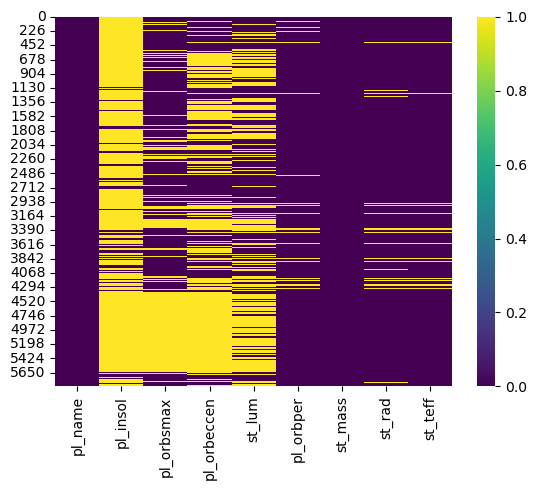

In [28]:
import seaborn as sns

# Assessing the null values in the columns discussed above
sns.heatmap(df[["pl_name", "pl_insol", "pl_orbsmax", "pl_orbeccen", "st_lum", "pl_orbper", "st_mass", "st_rad", "st_teff"]].isna(),
            cmap = 'viridis')

Missing values cross-reference:
- **pl_insol** is barealy available across the data;
- **pl_orbsmax** and **pl_orbeccen** have lots of missing values, but we can still estimate semi-major axis (average distance from the star that we need) for the most planets through **pl_orbper** and **st_mass**;
- **st_lum** is also missing for quite a bit of values, but can be estimated for most of the planets through **st_rad** and **st_teff**.

In [30]:
df[["pl_name", "pl_insol", "pl_orbsmax", "pl_orbeccen", "st_lum", "pl_orbper", "st_mass", "st_rad", "st_teff"]].describe().T

,count,mean,std,min,25%,50%,75%,max
pl_insol,777.0,429.478008,1801.744970,0.020000,8.100000,56.25000,325.000000,4.490000e+04
pl_orbsmax,3638.0,22.005851,423.409650,0.004400,0.054218,0.11505,0.797000,1.900000e+04
pl_orbeccen,2433.0,0.151622,0.183985,0.000000,0.008000,0.08700,0.220000,9.500000e-01
st_lum,3090.0,-0.157914,0.880548,-4.660000,-0.528927,-0.05476,0.346262,3.260760e+00
pl_orbper,5573.0,4608.414309,166647.593124,0.090706,4.385315,11.23479,39.818993,8.040000e+06
st_mass,5846.0,0.937853,0.348803,0.013100,0.790000,0.95000,1.090000,9.100000e+00
st_rad,5571.0,1.495948,3.781414,0.011500,0.780000,0.95730,1.260000,8.847500e+01
st_teff,5611.0,5392.475553,1705.696364,415.000000,4917.000000,5529.00000,5884.000000,5.700000e+04


Now, let's assess reliability of **pl_insol** and **pl_orbsmax** values, since (from the .describe() output) it looks like there are some outliers with incredible values:
- Most known planets receive < 100× Earth’s flux and are within 100 AU from their host stars
- Checking **pl_insollim** variable will also help as values equal to 2 or 3 are less reliable, as those indicate upper and lower limits
- Checking **pl_orbsmaxlim** variable will also help as values equal to 2 or 3 are less reliable, as those indicate upper and lower limits

Text(0.5, 1.0, 'Distribution of Maximum Orbital Distance')

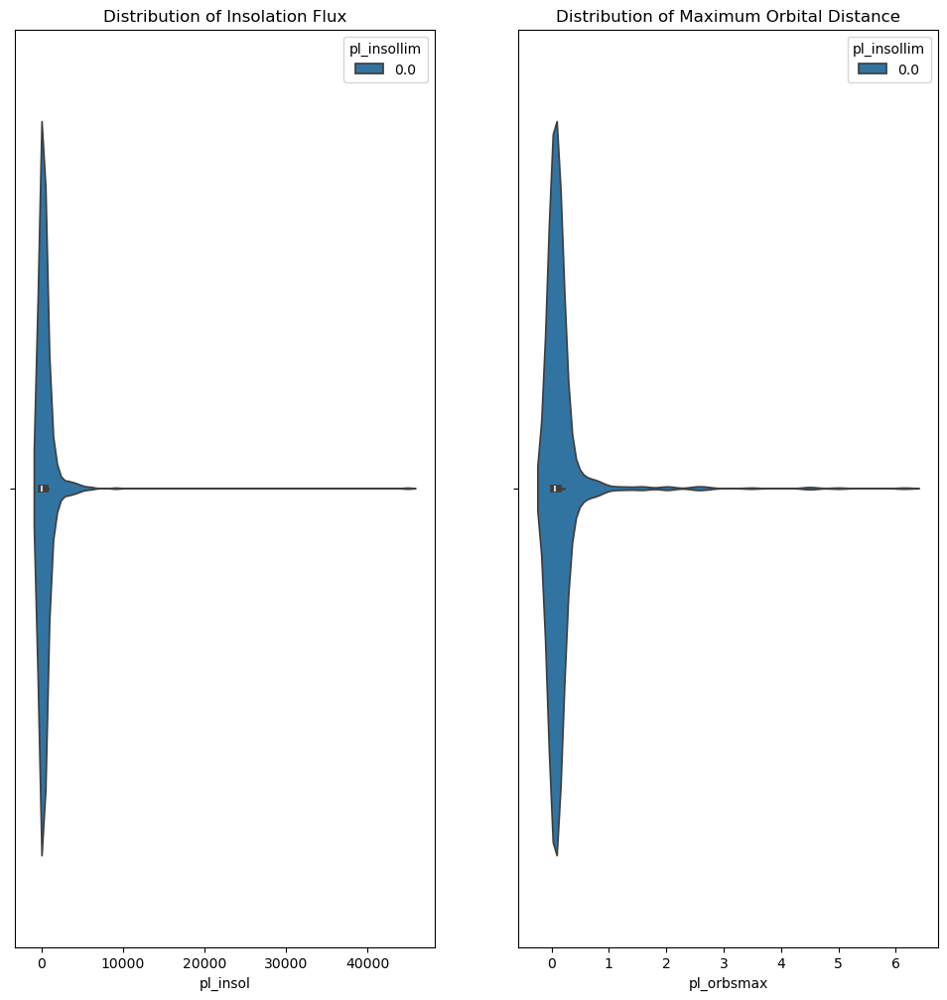

In [32]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (12, 12))
axes = axes.flatten()
sns.violinplot(data = df, x = "pl_insol", fill = True, ax = axes[0], hue = "pl_insollim")
axes[0].set_title("Distribution of Insolation Flux")

sns.violinplot(data = df, x = "pl_orbsmax", fill = True, ax = axes[1], hue = "pl_insollim")
axes[1].set_title("Distribution of Maximum Orbital Distance")

Okay, all flags are equal to 0, however, values beyond 5000 for both **pl_insol** and **pl_orbsmax** may indicate potential data entry errors. Let's check the rows one-by-one...

In [34]:
# Extremely high values (conservative thresholds)
mask_implausible_insol = df["pl_insol"] > 5000
mask_implausible_orbsmax = df["pl_orbsmax"] > 5000

# Combined mask
mask_needs_estimation = mask_implausible_insol | mask_implausible_orbsmax

df[mask_needs_estimation][["pl_name",
                           "pl_insol",
                           "pl_orbsmax",
                           "pl_orbeccen",
                           "st_lum",
                           "pl_orbper",
                           "st_mass",
                           "st_rad",
                           "st_teff"]].sort_values(by = "pl_orbsmax", ascending = False).head(len(mask_needs_estimation))

,pl_name,pl_insol,pl_orbsmax,pl_orbeccen,st_lum,pl_orbper,st_mass,st_rad,st_teff
3479,UCAC4 328-061594 b,NaN,19000.00000,NaN,NaN,NaN,1.190000,NaN,NaN
3480,GJ 900 b,NaN,12000.00000,NaN,-0.92100,NaN,0.580000,0.730000,3976.0
3657,2MASS J21252752-8138278 b,NaN,7493.00000,NaN,-1.16815,NaN,0.643977,0.672832,3592.0
3478,UCAC3 113-933 b,NaN,6100.00000,NaN,-1.19385,NaN,0.558098,0.564484,3864.0
2120,TOI-1431 b,5300.0,0.04600,0.0022,1.06819,2.650237,1.900000,1.920000,7690.0
2577,HATS-70 b,9110.0,0.03632,0.1800,1.07918,1.888238,1.780000,1.881000,7930.0
2001,KELT-9 b,44900.0,0.03462,0.0000,1.72428,1.481124,2.520000,2.362000,10170.0
227,WASP-18 b,5805.0,0.02024,0.0051,0.42813,0.941452,1.294000,1.319000,6432.0
3073,HD 80653 b,6130.0,0.01661,0.0000,0.24000,0.719573,1.180000,1.220000,NaN


There are only 10 planets with one of the attributes being more than 5,000 times that of Earth's, the highest of which we have manually cross-checked and they are legit:
- **"UCAC4 328-061594 b"** is a gas giant exoplanet with mass of 21 Jupyters; it is 19,000 AU from its star and completes one orbit in 2,402,178 years;
- **"KELT-9 b"** is a gas giant exoplanet with mass of 2.88 Jupyters; it is an ultrahot world (so hot that the heat tears molecules apart on the dayside), as it orbits its host A-type star (10,000 K) extremely close - only 0.03462 AU.

Given the findings, we'll proceed with an assumption that all other **pl_insol** and **pl_orbsmax** values provided directly in the dataset are correct and will move to estimating **pl_insol** values to then derive **is_in_hbtble_zone** flag values.

Let's get to estimation:

In [36]:
# Creating a working copy not to mess the main df
df_est = df.copy()

# Creating placeholder columns for estimated values and sources
df_est["pl_insol_estimated"] = np.nan
df_est["pl_insol_source"] = np.nan

# Defining a helper function for estimating st_lum if missing
def estimate_st_lum(row):
    if pd.notnull(row["st_rad"]) and pd.notnull(row["st_teff"]):                 # Where components of the formula are not null
        return np.log10((row["st_rad"] ** 2) * ((row["st_teff"] / 5778) ** 4))   # Calculating values through the formula
    else:
        return np.nan

# Defining a helper function for estimating semi-major axis using Kepler’s Law (AU)
def estimate_sma_from_kepler(row):
    if pd.notnull(row["pl_orbper"]) and pd.notnull(row["st_mass"]):              # Where components of the formula are not null
        return ((row["pl_orbper"] / 365.25) ** 2 * row["st_mass"]) ** (1 / 3)    # Calculating values through the formula
    else:
        return np.nan

# Estimating missing st_lum (log10 scale) in the df_est dataframe
df_est["st_lum_est"] = df_est.apply(lambda row: estimate_st_lum(row) if pd.isnull(row["st_lum"]) else row["st_lum"], axis = 1)

# Correcting pl_orbsmax for eccentricity if available to get semi-major axis
df_est["sma_corrected"] = np.where(
                                   pd.notnull(df_est["pl_orbsmax"]) & pd.notnull(df_est["pl_orbeccen"]),
                                   df_est["pl_orbsmax"] / (1 + df_est["pl_orbeccen"]),
                                   df_est["pl_orbsmax"] # Assumption that the orbit is circular if eccentricity is missing
                                  )

# Estimating semi-major axis via Kepler's Law
df_est["sma_kepler"] = df_est.apply(lambda row: estimate_sma_from_kepler(row), axis = 1)

# Estimating pl_insol where missing given everything defined above
for i, row in df_est[df_est["pl_insol"].isna()].iterrows():
    L = None
    a = None
    source = None

    if pd.notnull(row["st_lum"]):
        L = 10 ** row["st_lum"]
        L_source = "lum"
    elif pd.notnull(row["st_lum_est"]):
        L = 10 ** row["st_lum_est"]
        L_source = "est_lum"

    if pd.notnull(row["sma_corrected"]) and row["sma_corrected"] > 0: # Slicing pl_insol sources to account for missing eccentricities
        a = row["sma_corrected"]
        if L_source == "lum":
            source = "lum_orb_ecc" if pd.notnull(row["pl_orbeccen"]) else "lum_orb_no_ecc" 
        elif L_source == "est_lum":
            source = "est_lum_orb_ecc" if pd.notnull(row["pl_orbeccen"]) else "est_lum_orb_no_ecc"
    elif pd.notnull(row["sma_kepler"]) and L is not None:
        a = row["sma_kepler"]
        source = "est_lum_est_orb"

    if L is not None and a is not None and a > 0:
        df_est.at[i, "pl_insol_estimated"] = L / (a ** 2)
        df_est.at[i, "pl_insol_source"] = source

# Assigning direct values of pl_insol to pl_insol_estimated where available and setting source to "direct"
df_est.loc[df_est["pl_insol"].notna(), "pl_insol_estimated"] = df_est["pl_insol"]
df_est.loc[df_est["pl_insol"].notna(), "pl_insol_source"] = "direct"

# Checking the results of our estimation procedure
print("The number of pl_insol estimates by their source:")
print(df_est["pl_insol_source"].value_counts())
print("")
print(f"The number of missing values for pl_insol after estimations is {df_est["pl_insol_estimated"].isna().sum()}.")

The number of pl_insol estimates by their source:
pl_insol_source
est_lum_est_orb       2191
lum_orb_ecc           1296
direct                 777
est_lum_orb_no_ecc     625
lum_orb_no_ecc         393
est_lum_orb_ecc        301
Name: count, dtype: int64

The number of missing values for pl_insol after estimations is 286.


Now, we have only 280 rows left with missing **pl_insol**, which we can safely drop from the dataframe with ~5600 rows. I'll proceed with updating the original dataframe with estimated values and calculating **is_in_hbtble_zone** flag.

In [38]:
# Transfering estimates and sources of them into the original df
df["pl_insol"] = df_est["pl_insol_estimated"]
df["st_lum"] = df_est["st_lum_est"]
df["pl_insol_source"] = df_est["pl_insol_source"]

# Calculating our target variable
df["is_in_hbtble_zone"] = np.where(df["pl_insol"] <= 2.00, np.where(df["pl_insol"] >= 0.25, 1, 0), 0)

# Dropping rows with empty pl_insol
df = df.dropna(subset = ["pl_insol"])

# Checking the counts
df["is_in_hbtble_zone"].value_counts().rename(index = {0: "Not Habitable", 1: "In Habitable Zone"})

is_in_hbtble_zone
Not Habitable        5220
In Habitable Zone     363
Name: count, dtype: int64

This is an imbalanced dataset with only around 7% of planets falling into a habitable zone of their host stars, which we will have to account for during further sections of this analysis and especially during modeling.

<class 'pandas.core.frame.DataFrame'>
Index: 5583 entries, 0 to 5868
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   pl_name      5583 non-null   object 
 1   pl_insol     5583 non-null   float64
 2   pl_orbsmax   3366 non-null   float64
 3   pl_orbeccen  2404 non-null   float64
 4   st_lum       5583 non-null   float64
 5   pl_orbper    5530 non-null   float64
 6   st_mass      5575 non-null   float64
 7   st_rad       5561 non-null   float64
 8   st_teff      5579 non-null   float64
dtypes: float64(8), object(1)
memory usage: 436.2+ KB
None


<Axes: >

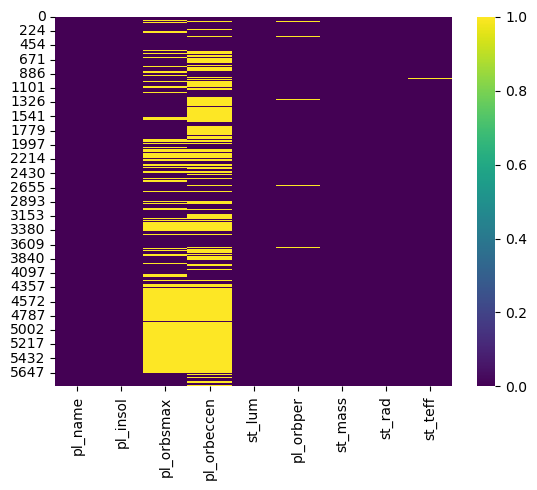

In [40]:
# Checking results through the heatmap again
print(df[["pl_name", "pl_insol", "pl_orbsmax", "pl_orbeccen", "st_lum", "pl_orbper", "st_mass", "st_rad", "st_teff"]].info())

sns.heatmap(df[["pl_name",
                "pl_insol",
                "pl_orbsmax",
                "pl_orbeccen",
                "st_lum",
                "pl_orbper",
                "st_mass",
                "st_rad",
                "st_teff"]].isna(), cmap = 'viridis')

Now we are in a much better shape!

In [42]:
# Changing the order, so that is_habitable variable comes first, as the df is wide
cols = ["is_in_hbtble_zone"] + [col for col in df.columns if col != "is_in_hbtble_zone"]
df = df[cols]

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5583 entries, 0 to 5868
Data columns (total 83 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   is_in_hbtble_zone  5583 non-null   int64  
 1   pl_name            5583 non-null   object 
 2   hostname           5583 non-null   object 
 3   pl_letter          5583 non-null   object 
 4   disc_year          5583 non-null   int32  
 5   disc_refname       5583 non-null   object 
 6   disc_facility      5583 non-null   object 
 7   default_flag       5583 non-null   int32  
 8   pl_orbsmax         3366 non-null   float64
 9   pl_orbper          5530 non-null   float64
 10  pl_insol           5583 non-null   float64
 11  pl_eqt             1476 non-null   float64
 12  pl_rade            4396 non-null   float64
 13  pl_masse           1589 non-null   float64
 14  pl_dens            1026 non-null   float64
 15  pl_orbeccen        2404 non-null   float64
 16  pl_orbincl         1716 non-n

Now we have our working df for Data Understanding stage.

## 4. Data Understanding

### 4.1. Boundaries of the values in the dataset

Let's explore the dataset and see how the features look like... I'll start with creating a df with variable descriptions and their attributes from the **.describe()** method. Variable descriptions are defined for easier analysis of the boundaries.

In [45]:
# Starting by defining descriptions for relevant variables
column_descriptions = {
    "is_in_hbtble_zone": "Flag if the planet is in the habitable zone",

    # Planetary identifiers and metadata
    "pl_name": "Unique identifier for the planet",
    "hostname": "Name of the host star",
    "pl_letter": "Planet designation within the host system",
    "disc_year": "Year of discovery",
    "disc_refname": "Publication reference",
    "disc_facility": "Facility/telescope used",
    "default_flag": "Flag: canonical planet data",

    # Planetary orbital and habitability features
    "pl_orbsmax": "Avg distance from the star [AU]",
    "pl_orbper": "Orbital period [days]",
    "pl_insol": "Stellar radiation received [Earth units]",
    "pl_eqt": "Equilibrium temperature [K]",
    "pl_rade": "Planet radius [Earth radii]",
    "pl_masse": "Planet mass [Earth masses]",
    "pl_dens": "Planet density [g/cm³]",
    "pl_orbeccen": "Orbital eccentricity",
    "pl_orbincl": "Orbital inclination",

    # Transit and detection parameters
    "pl_trandep": "Proportion of starlight blocked by transits",
    "pl_trandur": "Transit duration [hours]",
    "pl_ratror": "Ratio of planet radius to star radius",
    "discoverymethod": "Discovery method used",

    # Planetary properties uncertainty variables
    "pl_eqterr1": "UB of equilibrium temp",
    "pl_eqterr2": "LB of equilibrium temp",
    "pl_insolerr1": "UB of insolation flux",
    "pl_insolerr2": "LB of insolation flux",
    "pl_orbsmaxerr1": "UB of semi-major axis",
    "pl_orbsmaxerr2": "LB of semi-major axis",

    # Limit/flag indicators
    "pl_eqtlim": "Equilibrium temperature value type flag",
    "pl_orbsmaxlim": "Semi-major axis value type flag",
    "pl_insollim": "Insolation flux value type flag",
    "tran_flag": "Transit detection flag",
    "rv_flag": "Radial velocity detection flag",
    "ttv_flag": "Transit timing variation flag",
    "cb_flag_x": "Circumbinary planet flag",

    # Planetary system coordinates
    "ra_x": "Right Ascension of the planet",
    "dec_x": "Declination of the planet",
    "glon_x": "Galactic longitude (planet)",
    "glat_x": "Galactic latitude (planet)",

    # Stellar identifiers
    "gaia_id": "Star identifier in Gaia",
    "tic_id": "Star identifier in TESS Input",
    "hd_name": "Star identifier in Henry Draper",
    "hip_name": "Star identifier in Hipparcos",

    # Stellar properties
    "st_teff": "Stellar effective temperature [K]",
    "st_tefflim": "Flag for stellar temperature value type",
    "st_rad": "Stellar radius [Solar radii]",

    "st_radlim": "Flag for stellar radius value type",
    "st_lum": "Stellar luminosity [log 10 of Solar luminosities]",
    "st_lumlim": "Flag for stellar luminosity value type",
    "st_mass": "Stellar mass [Solar masses]",
    "st_masslim": "Flag for stellar mass value type",
    "st_met": "Stellar metallicity [dex]",
    "st_metlim": "Flag for stellar metallicity value type",
    "st_logg": "Stellar surface gravity [log10(cm/s²)]",
    "st_logglim": "Flag for stellar gravity value type",
    "st_age": "Stellar age [Gyr]",
    "st_agelim": "Flag for stellar age value type",
    "st_spectype": "Spectral classification (e.g., G2V)",
    "st_rotp": "Stellar rotation period [days]",

    # Stellar properties uncertainty variables
    "st_tefferr1": "UB of stellar temp",
    "st_tefferr2": "LB of stellar temp",
    "st_raderr1": "UB of stellar radius",
    "st_raderr2": "LB of stellar radius",
    "st_lumerr1": "UB of stellar luminosity",
    "st_lumerr2": "LB of stellar luminosity",
    "st_masserr1": "UB of stellar mass",
    "st_masserr2": "LB of stellar mass",
    "st_meterr1": "UB of stellar metallicity",
    "st_meterr2": "LB of stellar metallicity",
    "st_loggerr1": "UB of stellar gravity",
    "st_loggerr2": "LB of stellar gravity",
    "st_ageerr1": "UB of stellar age",
    "st_ageerr2": "LB of stellar age",

    
    # Stellar system-wide properties
    "sy_pm": "Proper motion [mas/yr]",
    "sy_dist": "Distance to system [pc]",
    "sy_snum": "Number of stars in the system",
    "sy_pnum": "Number of planets in the system",
    "cb_flag_y": "Circumbinary star flag (from stars table)",
    "sy_gaiamag": "Gaia magnitude (brightness)",
    "ra_y": "Right Ascension (host star)",
    "dec_y": "Declination (host star)",
    "glon_y": "Galactic longitude (host star)",
    "glat_y": "Galactic latitude (host star)",

    # Engineered flags during data smithing
    "st_lum_estimated_flag": "If stellar luminosity was estimated",
    "pl_orbsmax_estimated_flag": "If semi-major axis was estimated",
    "pl_insol_source": "How insolation flux was estimated"
}

In [46]:
# Creating the description-augmented summary table for numeric variables
summary_df = df.describe(include = [np.number]).T
summary_df["description"] = summary_df.index.map(lambda col: column_descriptions.get(col, "—"))

# Reordering columns to make 'description' first
summary_df = summary_df[["description"] + [col for col in summary_df.columns if col != "description"]]

# Displaying the full summary DF
pd.set_option("display.max_rows", 100)
summary_df

,description,count,mean,std,min,25%,50%,75%,max
is_in_hbtble_zone,Flag if the planet is in the habitable zone,5583.0,0.065019,0.246581,0.0,0.0,0.0,0.0,1.0
disc_year,Year of discovery,5583.0,2016.493641,4.680887,1995.0,2014.0,2016.0,2021.0,2025.0
default_flag,Flag: canonical planet data,5583.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0
pl_orbsmax,Avg distance from the star [AU],3366.0,15.600679,285.326739,0.006,0.0519,0.102035,0.380725,12000.0
pl_orbper,Orbital period [days],5530.0,4285.185694,165556.304257,0.112007,4.375786,11.130476,38.453433,8040000.0
pl_insol,Stellar radiation received [Earth units],5583.0,827.803127,17095.865207,0.0,11.030158,67.914423,290.009373,878290.769062
pl_eqt,Equilibrium temperature [K],1476.0,1007.620495,538.8447,96.4,585.8,903.5,1379.25,4050.0
pl_rade,Planet radius [Earth radii],4396.0,4.322057,4.729261,0.3098,1.61,2.405721,3.805,77.3421
pl_masse,Planet mass [Earth masses],1589.0,775.982822,1561.00217,0.07,11.1,159.55066,638.835098,9534.9
pl_dens,Planet density [g/cm³],1026.0,5.187237,62.730255,0.03,0.58175,1.513636,3.70075,2000.0


Several observations:
1. Column **default_flag** is "1" everywhere, which is expected per our query. **Action item:** Delete the column.
2. Column **pl_ratror** has a large max value, indicating that the planet's radius is 7.28 times that of its host star. Probably a neuron star, but need to check.  **Action item:** Check the exoplanets with extreme values.
3. Columns **st_tefflim**, **st_radlim**,**st_lumlim**  have zeros everywhere - safe to delete. **Action item:** Delete the columns.
4. Column **st_age** has some extreme values (max is 15.9 billion years), which are outside of the universe's age (~13.7 billion years) . This needs checking. **Action item:** Check the max values and see if we may want to delete some rows.

Other than that, other columns of the working dataframe seem clean!

In [48]:
# Deleting columns with no value add
df = df.drop(columns = ['default_flag', 'st_tefflim', 'st_radlim', 'st_lumlim'])
len(df.columns) # Expected 79

79

In [49]:
# Extremely high values (conservative thresholds)
mask_suspicious_rel_pl_rad = df["pl_ratror"] > 5
mask_suspicious_star_age = df["st_age"] >= 13.6

# Combined mask
mask_needs_checking = mask_suspicious_rel_pl_rad | mask_suspicious_star_age

df[mask_needs_checking][["pl_name",
                         "pl_ratror",
                         "pl_insol",
                         "pl_orbper",                         
                         "pl_orbsmax",
                         "pl_orbeccen",
                         "st_age",
                         "st_lum",
                         "st_mass",
                         "st_rad",
                         "st_teff"]].sort_values(by = "pl_orbsmax", ascending = False).head(len(mask_needs_checking))

,pl_name,pl_ratror,pl_insol,pl_orbper,pl_orbsmax,pl_orbeccen,st_age,st_lum,st_mass,st_rad,st_teff
3405,TOI-260 b,0.02580,8.209120,13.475853,0.094300,0.000,15.90,-1.136680,0.5485,0.5468,4050.0
251,XO-5 b,0.10390,328.386687,4.187756,0.051500,0.000,14.80,-0.060000,0.8800,1.0800,5470.0
2216,HATS-75 b,0.15550,59.260000,2.788656,0.032742,0.064,14.90,-1.196610,0.6017,0.5848,3790.4
2706,WD 1856+534 b,7.28000,0.181000,1.407941,0.020400,0.000,7.93,-4.120484,0.5180,0.0131,4710.0
2032,Kepler-1850 b,NaN,266.648823,1.385800,NaN,NaN,13.80,-0.944552,0.6110,0.5810,4401.0
2333,Kepler-1853 b,NaN,4.873374,48.888199,NaN,NaN,14.00,-0.571797,0.7200,0.7100,4934.0
3230,Kepler-1650 b,0.02625,89.002601,1.538180,NaN,0.010,13.90,-1.426355,0.4870,0.4790,3673.0
3290,Kepler-1683 b,NaN,54.721020,15.033700,NaN,NaN,13.60,-0.164558,0.8260,0.9300,5450.0
3317,Kepler-1874 b,NaN,2.447943,56.573200,NaN,NaN,13.80,-0.817235,0.6470,0.6190,4588.0
3328,Kepler-1687 b,NaN,32.551417,5.779540,NaN,NaN,13.80,-1.044084,0.5840,0.5540,4256.0


**Planet bigger than its star**: Looks like the relative radius data is correct for the extreme value. The planet **WD 1856+534 b** is 10 times more massive than Jupyter and rotates around its white dwarf star with radius equal to 0.012 Solar radii, making the host star only 40% larger than Earth. At the same time, Jupyter's radius is ~0.103 Solar radii.

**Stars older than the universe**: Apparently, this is a known discrepancy for some stars that likely stems from uncertainties in both the age estimation of the universe (based on the Hubble constant) and the age of individual stars. Cross-checks for the stars in the list have shown that these are the correct accepted values.

### 4.2. Data visualizations

#### 4.2.1. Visualizing and diving into **pl_insol**
I'll start with plotting values of **pl_insol** against the way this property was derived from **pl_insol_source**:

In [52]:
df['pl_insol_source'].value_counts()

pl_insol_source
est_lum_est_orb       2191
lum_orb_ecc           1296
direct                 777
est_lum_orb_no_ecc     625
lum_orb_no_ecc         393
est_lum_orb_ecc        301
Name: count, dtype: int64

In [53]:
df.groupby(by = 'pl_insol_source')['pl_insol'].max()

pl_insol_source
direct                 44900.000000
est_lum_est_orb       878290.769062
est_lum_orb_ecc        14029.987208
est_lum_orb_no_ecc      7902.394524
lum_orb_ecc            19517.471098
lum_orb_no_ecc        636352.125769
Name: pl_insol, dtype: float64

Looks like some of the values surpassed even the biggest outlier we had before - **pl_insol** 44,900 times higher than that of Earth. Let's violin plot the data to have a better visual:

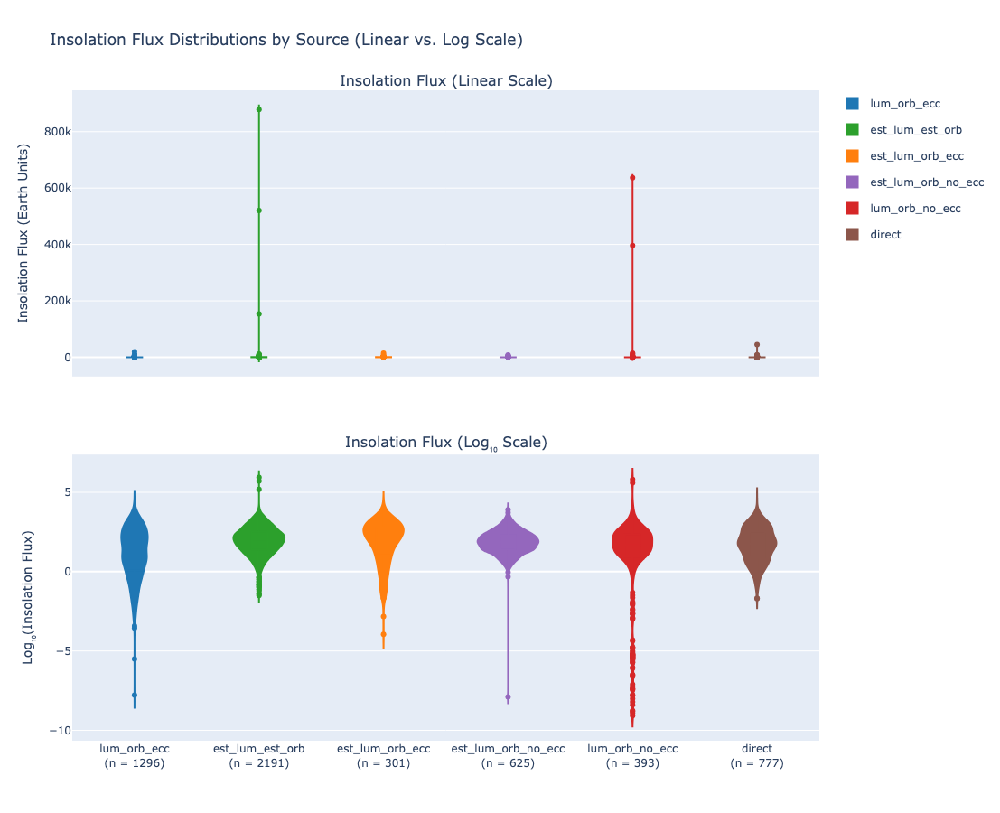

In [55]:
# Plotting a violing plot in Plotly to see how pl_insol_source affects the pl_insol values
# Plotting both log10 scale and normal plot for readability, as magnitudes are different per source

import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Ensure the log10 column is ready
df["pl_insol_log10"] = np.log10(df["pl_insol"].replace(0, np.nan))

# Create x-axis labels with counts and line breaks
source_counts = df["pl_insol_source"].value_counts()
source_labels = {
    src: f"{src}<br>(n = {source_counts[src]})"
    for src in source_counts.index
}
df["pl_insol_source_labeled"] = df["pl_insol_source"].map(source_labels)

# Create a color map for consistency
color_map = {
    "lum_orb_ecc": "#1f77b4",
    "est_lum_orb_ecc": "#ff7f0e",
    "est_lum_est_orb": "#2ca02c",
    "lum_orb_no_ecc": "#d62728",
    "est_lum_orb_no_ecc": "#9467bd",
    "direct": "#8c564b"
}

# Create subplot layout
fig = make_subplots(
    rows = 2, cols = 1,
    shared_xaxes = True,
    vertical_spacing = 0.12,
    subplot_titles = ("Insolation Flux (Linear Scale)", "Insolation Flux (Log₁₀ Scale)")
)

# Add violins for linear scale
for src in df["pl_insol_source"].unique():
    fig.add_trace(
        go.Violin(
            x = df.loc[df["pl_insol_source"] == src, "pl_insol_source_labeled"],
            y = df.loc[df["pl_insol_source"] == src, "pl_insol"],
            name = src,
            box_visible = True,
            points = "outliers",
            scalegroup = "all",
            legendgroup = src,
            line_color = color_map[src],
            fillcolor = color_map[src]
        ),
        row = 1, col = 1
    )

# Add violins for log10 scale
for src in df["pl_insol_source"].unique():
    fig.add_trace(
        go.Violin(
            x = df.loc[df["pl_insol_source"] == src, "pl_insol_source_labeled"],
            y = df.loc[df["pl_insol_source"] == src, "pl_insol_log10"],
            name = src,
            box_visible = True,
            points = "outliers",
            scalegroup = "all",
            legendgroup = src,
            showlegend = False,  # Avoid legend duplication
            line_color = color_map[src],
            fillcolor = color_map[src]
        ),
        row = 2, col = 1
    )

# Layout tweaks
fig.update_layout(
    height = 900,
    title_text = "Insolation Flux Distributions by Source (Linear vs. Log Scale)",
    violingap = 0.3
)
fig.update_yaxes(title_text = "Insolation Flux (Earth Units)", row = 1, col = 1)
fig.update_yaxes(title_text = "Log₁₀(Insolation Flux)", row = 2, col = 1)

fig.show()

Interestingly, data sliced by source is more or less the same in its main high-density region of the violin plot, however, outliers for different estimation approaches do show orders of magnitude differences from what there is. Plus, several outliers way larger than before have appeared through this estimates. **Action item**: check the new outliers by **pl_insol**.

Let's cross-check the data again:

In [57]:
# Extremely high values (of pl_insol)
mask_suspicious_pl_insol = df["pl_insol"] > 45000

df[mask_suspicious_pl_insol][["pl_name",
                         "pl_ratror",
                         "pl_insol",
                         "pl_insol_source",
                         "pl_orbper",                         
                         "pl_orbsmax",
                         "pl_orbeccen",
                         "st_age",
                         "st_lum",
                         "st_mass",
                         "st_rad",
                         "st_teff"]].sort_values(by = "pl_insol", ascending = False).head(len(mask_needs_checking))

,pl_name,pl_ratror,pl_insol,pl_insol_source,pl_orbper,pl_orbsmax,pl_orbeccen,st_age,st_lum,st_mass,st_rad,st_teff
1909,KIC 10001893 b,NaN,878290.769062,est_lum_est_orb,0.219700,NaN,NaN,NaN,1.43069,0.470,0.180,31000.0
1920,KOI-55 b,NaN,636352.125769,lum_orb_no_ecc,0.240104,0.0060,NaN,NaN,1.36000,0.496,0.203,27730.0
1298,KIC 10001893 c,NaN,520477.443140,est_lum_est_orb,0.325280,NaN,NaN,NaN,1.43069,0.470,0.180,31000.0
1921,KOI-55 c,NaN,396618.360936,lum_orb_no_ecc,0.342887,0.0076,NaN,NaN,1.36000,0.496,0.203,27730.0
1908,KIC 10001893 d,NaN,153797.239933,est_lum_est_orb,0.811610,NaN,NaN,NaN,1.43069,0.470,0.180,31000.0


The data on KIC 10001893 b/c/d look legit per the [article](https://www.aanda.org/articles/aa/full_html/2014/10/aa24509-14/aa24509-14.html):

*"KIC 10001893 is one out of 19 subdwarf-B (sdB) pulsators observed by the Kepler spacecraft in its primary mission. In addition to tens of pulsation frequencies in the g-mode domain, its Fourier spectrum shows three weak peaks at very low frequencies, which is too low to be explained in terms of g modes. The most convincing explanation is that we are seeing the orbital modulation of three Earth-size planets (or planetary remnants) in very tight orbits, which are illuminated by the strong stellar radiation."*

Planets KOI-55 b/c, if they exist which research is uncertain on, are also orbiting a very hot star (6 times hotter than the Sun) very closely. Thus, the data seem legit as well. [Wiki article](https://en.wikipedia.org/wiki/Kepler-70) states:

*"If Kepler-70b exists, then it would have a temperature of about 7288 K, the same as that of an F0 star. The hottest confirmed exoplanet and the hottest with a measured temperature is KELT-9b, with a temperature of about 4,600 K."* 

Note that, from the standpoint of our research question, it doesn't matter much. Planets like the above are far from being in habitable zone, however, we're checking the data to identify potential problems that may affect the research further.

#### 4.2.2. Exploring how features depend on each other through pairplots and correlation matrix
Let's explore other features and how they relate to being in the habitable zone. Our main focus will be on stars, since the research question we're trying to answer is which stars are more likely to have exoplanets in their habitable zone. However, we will explore what planetary features emerge as most frequent for planets in habitable zones. We will also consider features related to the whole star systems...

In [60]:
# Defining the most essential features to explore further
most_imp_planet_features = [   
    "pl_insol",         # Insolation flux — amount of radiation received from the host star
    "pl_eqt",           # Planet’s equilibrium temperature — basic indicator of surface climate
#    "pl_orbsmax",       # The longest radius of an elliptic orbit of a planet around the host star
#    "pl_orbper",        # Planet's orbital period - too close wil mean burning hear vs. too far will mean methane-freezing cold
    "pl_rade",          # Radius in Earth units — distinguishes rocky from gaseous planets
    "pl_masse",         # Planet mass in Earth units — for fine-grained habitability modeling
    "pl_orbeccen",      # Orbital eccentricity — affects climate stability over time
    "pl_orbincl",       # Orbital inclination — measures tilt of orbit; relevant to transit likelihood
    "pl_trandep",       # Proportion of starlight blocked by transits — tied to atmospheric inference and detectability
    "is_in_hbtble_zone" # Our flag of being in a habitable zone
]

most_imp_star_features = [
    "st_teff",          # Stellar effective temperature [K]
    "st_lum",           # Stellar luminosity [log 10 of Solar luminosities]
    "st_mass",          # Stellar mass [Solar masses]
    "st_rad",           # Stellar radius [Solar radii]
    "st_met",           # Metallicity — correlated with planet formation probability 
    "st_logg",          # Stellar surface gravity [log10(cm/s²)] — relates to star type and evolutionary state
    "st_age",           # Stellar age — older systems may offer more time for life to emerge, but more planets can be kicked out by transits
#    "st_spectype",      # Spectral type — traditional classification that maps to HZ distances
#    "st_rotp",          # Stellar rotation period — associated with stellar activity and radiation levels
    "is_in_hbtble_zone" # Our flag of being in a habitable zone
]

most_important_star_system_features = [
    "sy_pm",            # Proper motion — affects stellar dynamics and possibly observational precision
#    "sy_dist",          # Distance to the system from us, which affects our detection capabilities
    "sy_snum",          # Number of stars — binary systems may disrupt habitable zone stability
    "sy_pnum",          # Number of planets — multi-planet systems may resemble our Solar System
    "is_in_hbtble_zone" # Our flag of being in a habitable zone
]

# Creating logs of features as well, since some of the variables will be very

Now let's go ahead and plot pairplots to understand the dependencies...

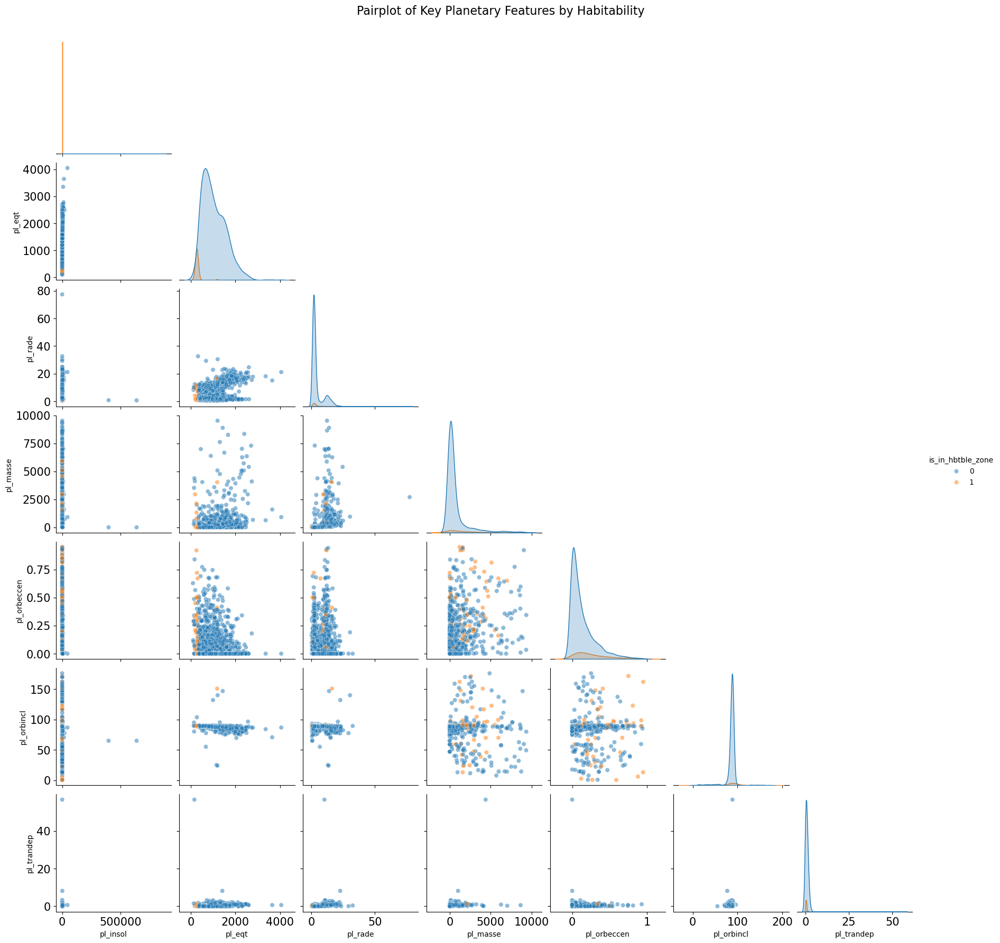

In [62]:
import matplotlib.pyplot as plt

# Starting with the pairplot of planetary features
pairplot_features = most_imp_planet_features

g = sns.pairplot(
    df[pairplot_features],
    hue = "is_in_hbtble_zone",
    diag_kind = "kde",
    corner = True,
    plot_kws = {"alpha": 0.5}
)

# Increase font size of variable labels
for ax in g.axes.flatten():
    if ax:
        ax.tick_params(labelsize = 15)

g.fig.suptitle("Pairplot of Key Planetary Features by Habitability", y = 1.02, fontsize = 16)
plt.show()

We can see that planets in habitable zone expectedly have only very low **pl_insol** values (but log scale would be more informative in the pairplot). Equillibrium surface temperature **pl_eqt** is expectedly low on such planets as well. At the same time, planet masses **pl_masse** and eccentricities **pl_orbecccen** are all over the place. All of this is pretty expected and we won't spend too much time on planetary attributes. Let's move on to stellar properties and see if there are any habitable planet-friendly ones.

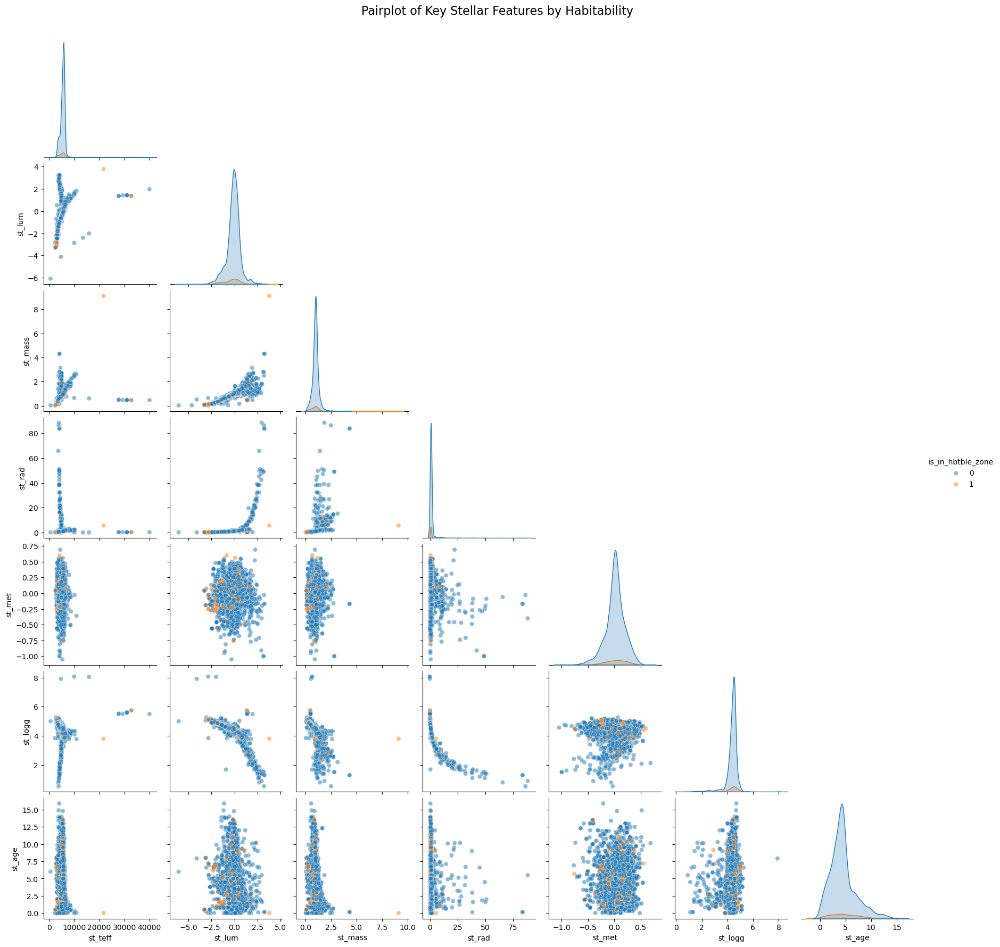

In [64]:
# Continuing with the pairplot of stellar features
pairplot_features = most_imp_star_features

g = sns.pairplot(
    df[pairplot_features],
    hue = "is_in_hbtble_zone",
    diag_kind = "kde",
    corner = True,
    plot_kws = {"alpha": 0.5}
)

# # Increase font size of variable labels
# for ax in g.axes.flatten():
#     if ax:
#         ax.tick_params(labelsize = 15)

g.fig.suptitle("Pairplot of Key Stellar Features by Habitability", y = 1.02, fontsize = 16)
plt.show()

Couple of observations on having planets in habitable zone:
1. Very luminous stars (orders of magnitude from Sun) tend to not have planets in habitable zone (this may well be because planets are far -> it's hard to detect with today's technology). See the first (**st_lum**) row.
2. There's an interesting outlier with a very massive and hot star that has a planet in its habitable zone. Would be interesting to explore. See **st_mass** and **st_teff** intersection.
3. Age of a star (**st_age**) doesn't seem to affect having planets in the habitable zone, as orange dots are essentially on the whole spectrum of stellar ages.
4. Log of stellar surface gravity (**st_logg**) and stellar mass (**st_mass**) look directly dependent through an equation. Stars with surface gravity mainly similar to that of the Sun seem to be more likely to have planets in the habitable zone with some outliers.
5. Stellar metalicity doesn't seem to affect the target variable much with planets in habitable zones for all sorts of stars.

In [66]:
# Checking the outlier on mass / surface temperature with a habitable planet
df[['is_in_hbtble_zone', 'pl_name', 'pl_masse', 'hostname', 'st_rad', 'st_mass', 'st_teff', 'st_lum']].loc[df['st_mass'] >= 6].T

,4162
is_in_hbtble_zone,1
pl_name,mu2 Sco b
pl_masse,4576.729061
hostname,mu2 Sco
st_rad,5.6
st_mass,9.1
st_teff,21700.0
st_lum,3.795105


The star is *mu2 Sco* that indeed has two potential planets accroding to Wikipedia, but the research seemed still uncertain on whether those are planets or brown dwarfs at the time of the article:

*"Two sub-stellar objects slightly above deuterium burning limit (brown dwarfs) were found in 2022 by direct imaging near Mu2 Scorpii. The outer one, designated μ2 Scorpii b, is definitely an orbiting planet or brown dwarf, and the inner one is a planetary candidate."*

Let's dive into stellar system properties...

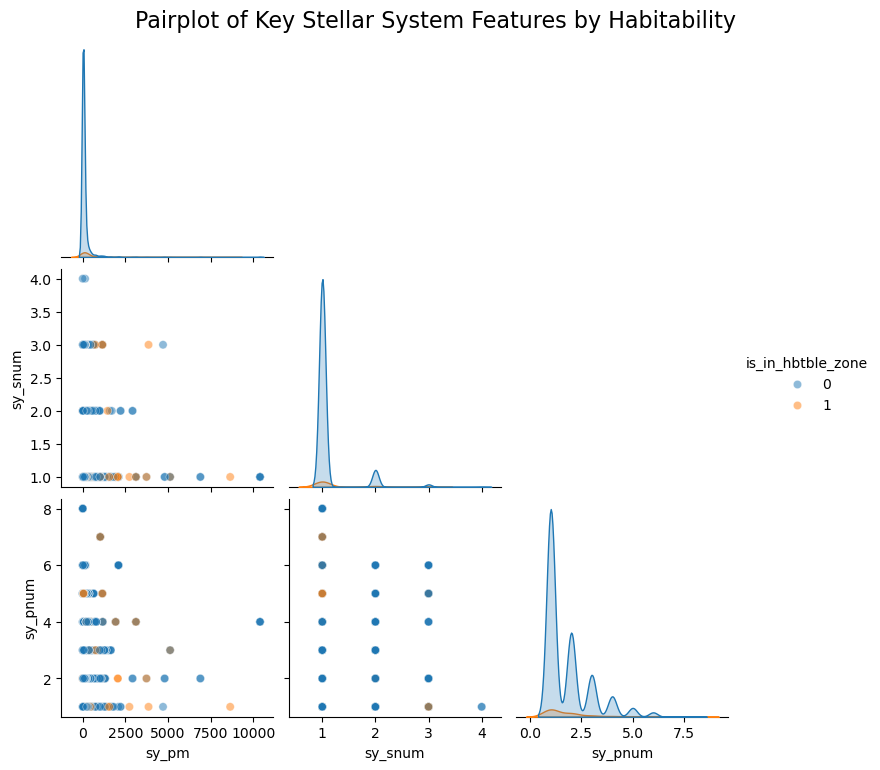

In [68]:
# Continuing with the pairplot of the whole system features
pairplot_features = most_important_star_system_features

g = sns.pairplot(
    df[pairplot_features],
    hue = "is_in_hbtble_zone",
    diag_kind = "kde",
    corner = True,
    plot_kws = {"alpha": 0.5}
)

# # Increase font size of variable labels
# for ax in g.axes.flatten():
#     if ax:
#         ax.tick_params(labelsize = 15)

g.fig.suptitle("Pairplot of Key Stellar System Features by Habitability", y = 1.02, fontsize = 16)
plt.show()

Interestingly, we see some exoplanets in the habitable zone even in the three-star systems, where a three-body problem should kick-in. This would increase a probability that the planet will get kicked out of the system by gravitational forces of unpredictable nature. Let's check what planets are like that:

In [70]:
df[['is_in_hbtble_zone',
    'pl_name',
    'sy_snum',
    'hostname',
    'pl_orbper',
    'pl_insol',
    'pl_orbeccen',
    "pl_eqt",
    "pl_rade",
    "pl_masse",
    "st_teff",          
    "st_lum",           
    "st_mass",   
    "st_rad",         
    "st_met", 
    "st_logg",   
    "st_age"
   ]].loc[(df['is_in_hbtble_zone'] == 1) & (df['sy_snum'] >= 3)].T

,33,67,110,320,512,514,519,525,974,1232,2069,3647,5801
is_in_hbtble_zone,1,1,1,1,1,1,1,1,1,1,1,1,1
pl_name,16 Cyg B b,HD 196050 b,HD 65216 b,HD 126614 b,GJ 667 C f,GJ 667 C c,HD 132563 b,HD 207832 c,GJ 667 C e,HD 142245 b,GJ 229 A c,TOI-4336 A b,Proxima Cen b
sy_snum,3,3,3,3,3,3,3,3,3,3,3,3,3
hostname,16 Cyg B,HD 196050,HD 65216,HD 126614,GJ 667 C,GJ 667 C,HD 132563,HD 207832,GJ 667 C,HD 142245,GJ 229,TOI-4336 A,Proxima Cen
pl_orbper,798.5,1392.0,577.6,1257.25303,39.026,28.14,1544.0,1155.7,62.24,1299.0,121.93268,16.336334,11.1868
pl_insol,1.423647,0.380076,0.635408,0.573262,0.59762,0.91281,0.315548,0.280685,0.31437,1.746789,0.758995,1.5,0.683869
pl_orbeccen,0.68,0.2,0.27,0.548,0.03,0.02,0.22,0.27,0.02,0.0,0.366,NaN,0.02
pl_eqt,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,308.0,NaN
pl_rade,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.12,NaN
pl_masse,NaN,1493.793513,NaN,107.74383,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


One of the planets is a well-lnown Proxima Centauri b, depicted in the book "Three-Body Problem". Looks like most of these systems are a three-star systems that consist of one separate star and another binary star system that probably makes it more stable than it would be in case of three "equal" bodies.

Another very important variable that may affect whether we detected planets in or outside of the habitable zone is distance to us, as our detection technology is very limited by how far the object is. We have a **sy_dist** column, but it may not be that informative as its logarithmic transformation. Let's add the log10 of distance and rerun pairplot for the whole systems.

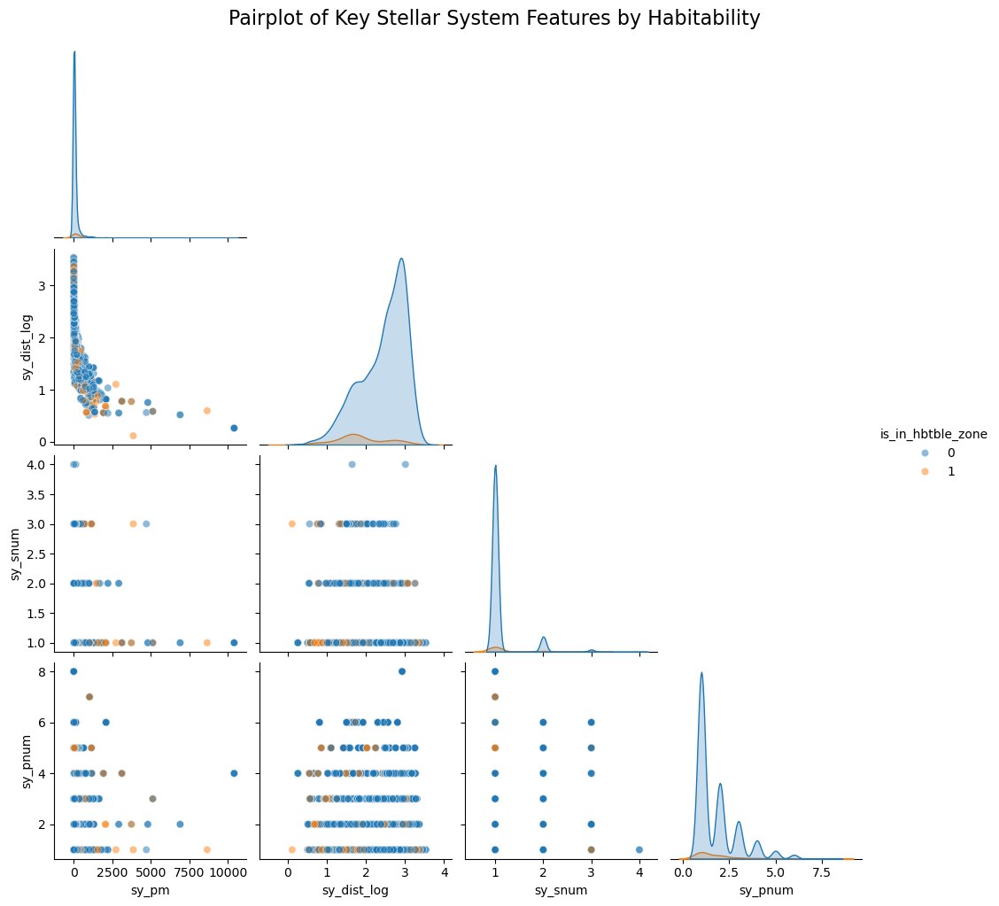

In [72]:
df['sy_dist_log'] = np.log10(df['sy_dist'])

most_important_star_system_features = [
    "sy_pm",            # Proper motion — affects stellar dynamics and possibly observational precision
    "sy_dist_log",      # Log distance to the system from us, which affects our detection capabilities
    "sy_snum",          # Number of stars — binary systems may disrupt habitable zone stability
    "sy_pnum",          # Number of planets — multi-planet systems may resemble our Solar System
    "is_in_hbtble_zone" # Our flag of being in a habitable zone
]

# Continuing with the pairplot of the whole system features
pairplot_features = most_important_star_system_features

g = sns.pairplot(
    df[pairplot_features],
    hue = "is_in_hbtble_zone",
    diag_kind = "kde",
    corner = True,
    plot_kws = {"alpha": 0.5}
)

# # Increase font size of variable labels
# for ax in g.axes.flatten():
#     if ax:
#         ax.tick_params(labelsize = 15)

g.fig.suptitle("Pairplot of Key Stellar System Features by Habitability", y = 1.02, fontsize = 16)
plt.show()

Looks like our detection capabilities are pretty advanced and we're detecting potentially habitable exoplanets on distances of more than 7,000 light years away! Moreover, density chart shows that we have more planets discovered quite far from us than closer, which may well be due to their mere quantity further away.

In [74]:
df[['is_in_hbtble_zone',
    'pl_name',
    'sy_snum',
    'sy_dist', # Distance from Earth measured in parsecs (1 parsec = ~3,26 light years)
    'sy_dist_log',
    'hostname',
    'pl_orbper',
    'pl_insol',
    'pl_orbeccen',
    "pl_eqt",
    "pl_rade",
    "pl_masse",
    "st_teff",          
    "st_lum",           
    "st_mass",   
    "st_rad",         
    "st_met", 
    "st_logg",   
    "st_age"
   ]].loc[(df['is_in_hbtble_zone'] == 1) & (df['sy_dist'] > 1500)]

,is_in_hbtble_zone,pl_name,sy_snum,sy_dist,sy_dist_log,hostname,pl_orbper,pl_insol,pl_orbeccen,pl_eqt,pl_rade,pl_masse,st_teff,st_lum,st_mass,st_rad,st_met,st_logg,st_age
1732,1,Kepler-34 b,2,1800.82,3.255470,Kepler-34,288.822000,1.752672,0.182,NaN,8.564,69.920000,5913.00,0.173000,1.0479,1.16180,-0.070,4.32840,NaN
2824,1,Kepler-1708 b,1,1666.69,3.221855,Kepler-1708,737.113100,0.561000,0.400,NaN,9.960,1462.010672,6157.00,0.182000,1.0880,1.11700,0.000,4.37000,3.16
5610,1,Kepler-1625 b,1,2310.11,3.363633,Kepler-1625,287.378949,1.164897,NaN,NaN,6.060,NaN,5677.00,-0.084379,0.9600,0.94000,0.010,4.48000,4.37
5620,1,Kepler-1636 b,1,1947.54,3.289486,Kepler-1636,425.477850,1.416666,NaN,NaN,3.230,NaN,5619.51,0.236740,0.9900,1.38556,0.146,4.15045,NaN
5622,1,Kepler-1638 b,1,1525.52,3.183418,Kepler-1638,259.336830,1.389377,NaN,NaN,1.870,NaN,5906.00,-0.114000,0.8170,0.83500,-0.760,4.52500,5.70


Now, let's proceed with the correlation matrix of all the numeric features for a high-level visual of correlations...

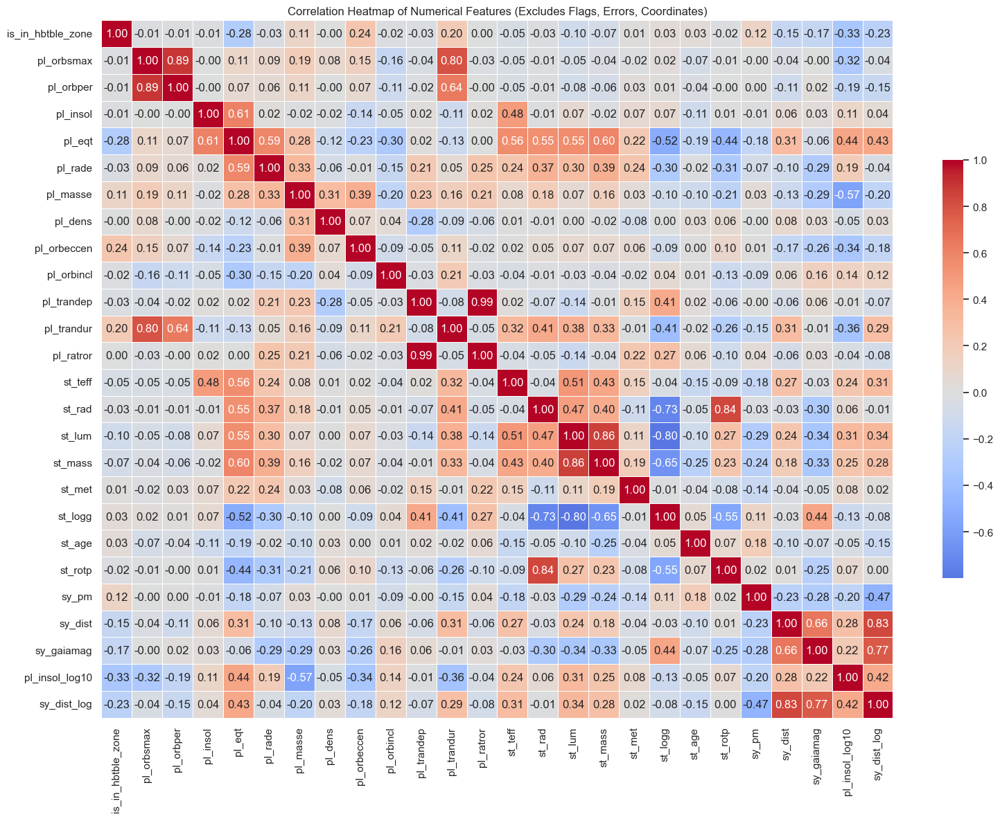

In [76]:
# Setting the visual style
sns.set(style = "whitegrid")

# Filtering out unwanted columns
exclude_keywords = ["err1", "err2", "flag", "lim", "estimated_flag", "ra_", "dec_", "glon_", "glat_", "id", "name"]
filtered_cols = [
    col for col in df.columns
    if not any(key in col.lower() for key in exclude_keywords)
]

# Keeping only numeric columns that passed the filter
filtered_numeric_cols = [
    col for col in filtered_cols
    if df[col].dtype in ["float64", "int64"] and col != "disc_year"
]

# Computing the correlation matrix
corr_matrix_filtered = df[filtered_numeric_cols].corr()

# Plotting the heatmap
plt.figure(figsize = (16, 12))
sns.heatmap(
    corr_matrix_filtered,
    cmap = "coolwarm",
    center = 0,
    annot = True,
    fmt = ".2f",
    linewidths = 0.5,
    cbar_kws = {"shrink": 0.6}
)
plt.title("Correlation Heatmap of Numerical Features (Excludes Flags, Errors, Coordinates)")
plt.tight_layout()
plt.show()

Several insights from the correlation matrix that we can group into several buckets:

---

**High Redundancy / Multicollinearity:** These features are very strongly correlated and likely redundant for modeling. Consider using only one from each pair:
- **pl_orbsmax** and **pl_orbper** are expectedly highly correlated (0.89), as longer orbits mean farther planets (Kepler's Law).
- **st_lum** and **st_mass** are tightly linked (0.89), as more massive stars are typically more luminous. Luminosity is proportional to the square of the star's radius (the Stefan–Boltzmann law).
- **st_mass** and **st_teff** show high correlation (0.39) — hotter stars tend to be more massive. Luminosity, that is highly correlated with mass, is also proportional to Temperature^4 (the Stefan–Boltzmann law).
- **st_rad** and **st_mass** are strongly related (0.40) — larger stars are generally more massive. Mass is proportional to Radius^3.
- **st_logg** and **st_rad**/**st_mass**/**st_lum** are strongly inversely correlated (from -0.65 to -0.81), consistent with the physical definition of surface gravity. The smaller the star, the more dense it is, the more surface gravity it has, while Luminousity and Mass are directly proportional to Radius ^4 and ^3 respectively.

---

**Moderate, Informative Correlations:** These variables show meaningful but not excessive correlation — they may be useful for interpretation or modeling:
- **st_age** and **st_mass** are moderately negatively correlated (-0.24) — older stars are often less massive, reflecting stellar evolution.
- **pl_eqt** and **pl_insol** are moderately correlated (0.61), which makes sense given the insolation-to-temperature relationship.
- **pl_masse** and **pl_rade** show a moderate positive correlation — larger planets tend to be more massive. Though there’s considerable variation in density, mass is proportional to radius cubed.

---

**Weak or Independent Features:** These have low correlation with most other variables and may act independently or reflect external biases:
- **st_met** (stellar metallicity) is largely uncorrelated with other features — it might affect planet formation, but not habitability directly. Interestingly, it's highest correlation of 0.25 is with planets' radii, which may mean that more metallic stars tend to have bigger planets, but the correlation is too weak to make this inference.
- **sy_dist** (distance to the system) is effectively uncorrelated to anything besides coordinates and its log transformation, which is logical - distribution of types of stars is more or less uniform in the explored proximity when searching for exoplanets.
- **sy_snum** (number of stars in the system) has very weak correlation with the target and everything else — suggesting multi-star systems don’t strongly inhibit habitability.

---

**Target Variable: is_in_hbtble_zone:**
Most features have low to moderate correlation with the binary target, which makes sense due to the band-pass nature of the habitable zone:

- **pl_insol_log10** has the strongest correlation (-0.33), since logarithmic scaling compresses extreme values and better reflects planetary heating.
- **pl_eqt** is also negatively correlated (-0.28), reinforcing that cooler planets tend to be in the habitable zone, but discrepancies in both ways from the acceptable range affect habitability -> correlation is low.
- **pl_insol** shows almost no linear correlation (~ -0.01) due to the non-monotonic definition of the target.
- **st_mass** and **st_teff** have weak negative correlations — hotter, more massive stars are slightly less likely to host planets in the habitable zone, possibly due to detection or physical constraints.

#### 4.2.3. Exploring potential habitability through other plots
Now, let's explore how various variables slice by potential habitability (**is_in_hbtble_zone**)...

##### Stellar spectral type may affect habitability:

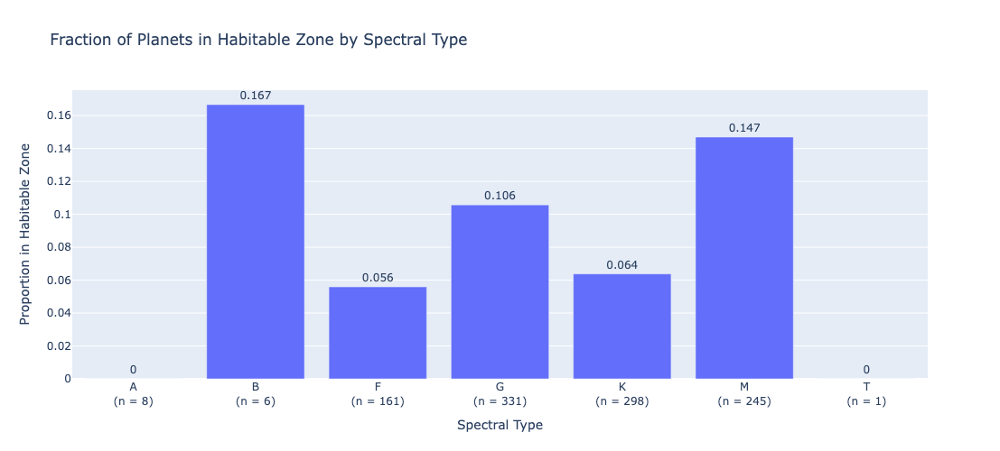

In [79]:
# Creating spectral type group column from first character (e.g., G2V → G)
df["st_spectype_group"] = df["st_spectype"].str.extract(r"([OBAFGKMLT])")

# Grouping by spectral type and calculating proportion + count
spectype_summary = (
    df.groupby("st_spectype_group")
    .agg(
        hab_count = ("is_in_hbtble_zone", "sum"),
        total_count = ("is_in_hbtble_zone", "count")
    )
    .assign(hab_rate = lambda d: d["hab_count"] / d["total_count"])
    .reset_index()
)

# Creating new label with counts included
spectype_summary["label"] = spectype_summary.apply(
    lambda row: f"{row['st_spectype_group']}<br>(n = {int(row['total_count'])})", axis = 1
)

# Creating plotly bar chart
fig = px.bar(
    spectype_summary,
    x = "label",
    y = "hab_rate",
    text = spectype_summary["hab_rate"].round(3),
    labels = {
        "label": "Spectral Type (with count)",
        "hab_rate": "Fraction in Habitable Zone"
    },
    title = "Fraction of Planets in Habitable Zone by Spectral Type"
)

# Updating layout for clarity
fig.update_traces(textposition = "outside")
fig.update_layout(
    yaxis_title = "Proportion in Habitable Zone",
    xaxis_title = "Spectral Type",
    height = 500
)

fig.show()

Number of A-type and T-type stars is very small in the dataset -> no good reason to believe those are not suitable for habitable planets. Similarly, type B seems to have one such star out of 5, which yields high percentage. Notably, type G (the same as out Sun's) and type M are the most likely to have planets in the habitable zone. This may well be an observation bias though.

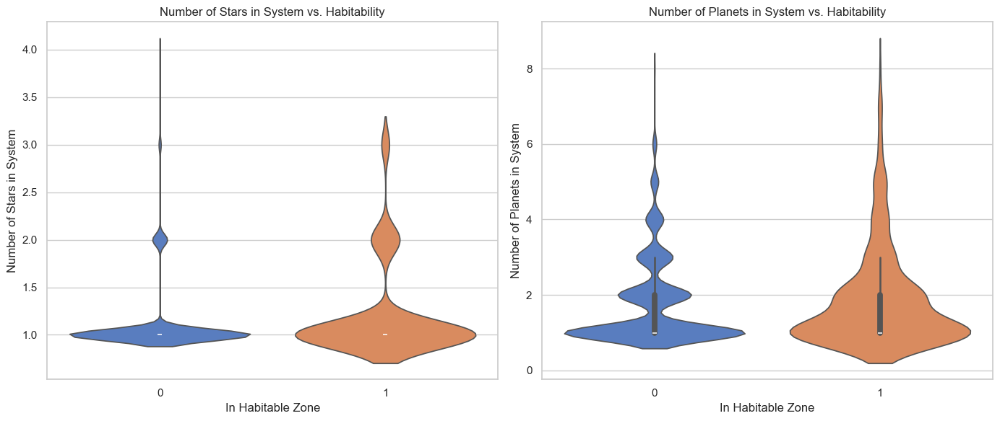

In [81]:
# Creating violin plots for system size (stars and planets) vs. habitability
fig, axes = plt.subplots(nrows = 1, ncols = 2, figsize = (14, 6))

# Plotting sy_snum vs. is_in_hbtble_zone
sns.violinplot(
    data = df,
    x = "is_in_hbtble_zone",
    y = "sy_snum",
    ax = axes[0],
    inner = "box",
    palette = "muted"
)
axes[0].set_title("Number of Stars in System vs. Habitability")
axes[0].set_xlabel("In Habitable Zone")
axes[0].set_ylabel("Number of Stars in System")

# Plotting sy_pnum vs. is_in_hbtble_zone
sns.violinplot(
    data = df,
    x = "is_in_hbtble_zone",
    y = "sy_pnum",
    ax = axes[1],
    inner = "box",
    palette = "muted"
)
axes[1].set_title("Number of Planets in System vs. Habitability")
axes[1].set_xlabel("In Habitable Zone")
axes[1].set_ylabel("Number of Planets in System")

plt.tight_layout()
plt.show()


Observations:
- Habitable-zone planets are present across both single and multi-star systems, though slightly more common in single-star systems (as expected)
- All the 4-star systems in our dataset have no planets in the habitable zone, but there are probably very few of them as well
- Multi-planet systems (especially with 3–6 planets) seem to support habitable-zone planets quite well — possibly due to better system stability or just higher chances statistically

Let's assess relationship to distance again...

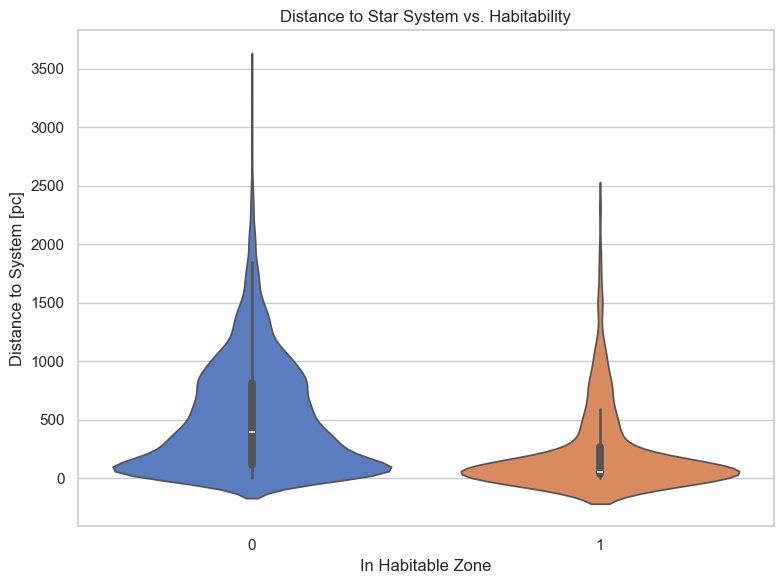

In [83]:
# Creating violin plot of distance to system vs. habitability
plt.figure(figsize = (8, 6))

# Plotting log-transformed distance (in parsecs)
sns.violinplot(
    data = df,
    x = "is_in_hbtble_zone",
    y = "sy_dist",
    inner = "box",
    palette = "muted"
)

# Updating labels and scales
#plt.yscale("log")
plt.title("Distance to Star System vs. Habitability")
plt.xlabel("In Habitable Zone")
plt.ylabel("Distance to System [pc]")

plt.tight_layout()
plt.show()

Observations:
- Most exoplanets are found closer to our system, including potentially habitable, which is logical
- There are some exoplanets, including potentially habitable, that are found very far away as well -> our detection capabilities are impressive!

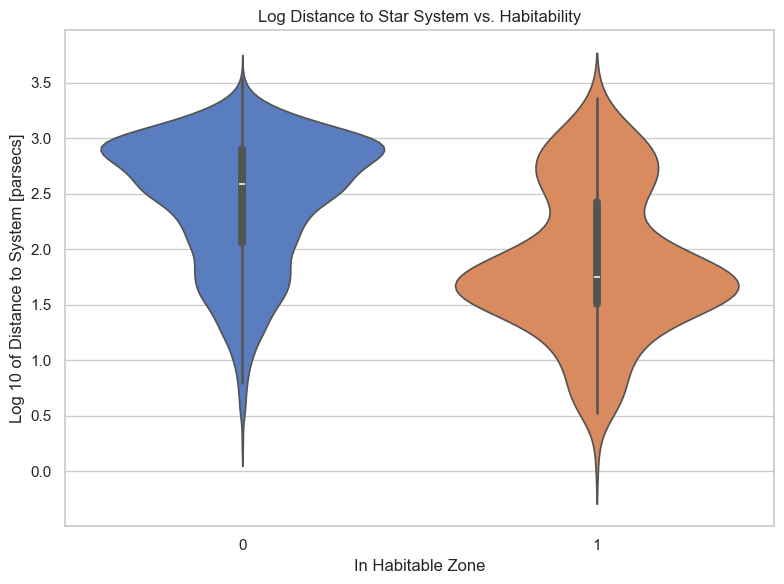

In [85]:
# Creating violin plot of log distance vs. habitability
plt.figure(figsize = (8, 6))

sns.violinplot(
    data = df,
    x = "is_in_hbtble_zone",
    y = "sy_dist_log",
    inner = "box",
    palette = "muted"
)

plt.title("Log Distance to Star System vs. Habitability")
plt.xlabel("In Habitable Zone")
plt.ylabel("Log 10 of Distance to System [parsecs]")

plt.tight_layout()
plt.show()

Log transform of the distance is somewhat more informative, as it shows that more habitable planets are discovered within 30-100 of parsecs away from us, which is very likely a combination of us being able to detect them better at a closer distance + more stars in that range than, for example 2 parsecs away with barely any stars being that close to us.

Now, let's explore how stellar properties relate to having planets in HZ through violin plots...

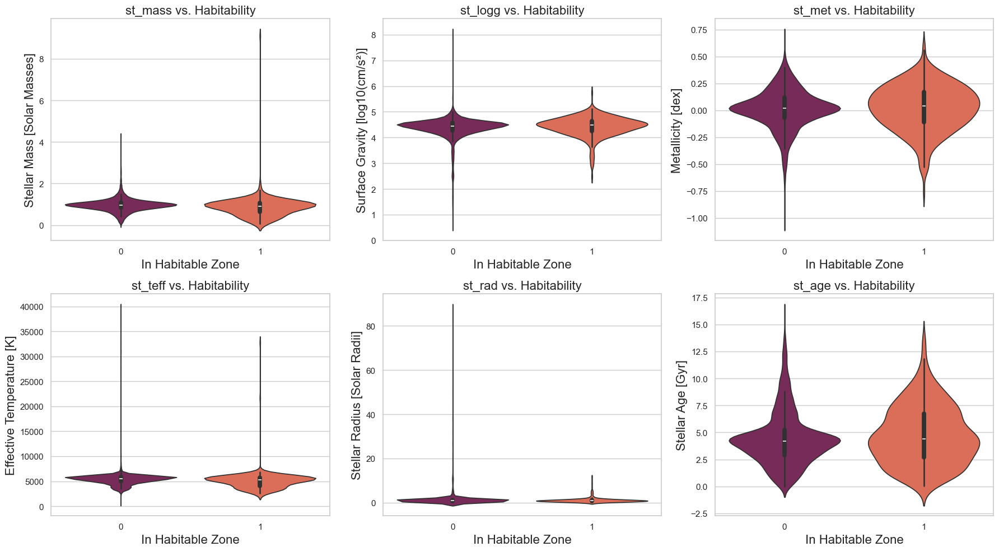

In [88]:
# Creating violin plots for six stellar features vs. habitability (2 rows × 3 columns)
fig, axes = plt.subplots(nrows = 2, ncols = 3, figsize = (18, 10))

# Feature list and axis labels
stellar_features = [
    ("st_mass", "Stellar Mass [Solar Masses]"),
    ("st_logg", "Surface Gravity [log10(cm/s²)]"),
    ("st_met", "Metallicity [dex]"),
    ("st_teff", "Effective Temperature [K]"),
    ("st_rad", "Stellar Radius [Solar Radii]"),
    ("st_age", "Stellar Age [Gyr]")
]

# Plotting each feature
for ax, (feature, label) in zip(axes.flat, stellar_features):
    sns.violinplot(
        data = df,
        x = "is_in_hbtble_zone",
        y = feature,
        inner = "box",
        palette = "rocket",
        ax = ax
    )
    ax.set_title(f"{feature} vs. Habitability", fontsize = 16)
    ax.set_xlabel("In Habitable Zone", fontsize = 16)
    ax.set_ylabel(label, fontsize = 16)

plt.tight_layout()
plt.show()

Observations:
- Most planets, including those in HZ, are discovered near stars that are close to the Sun in mass/size
- Most planets, including those in HZ, are discovered near stars that are close to the Sun in surface gravity. Sun's surface gravity is 27100 cm/s^2, log 10 of which is between 4 and 5
- Metallicity doesn't seem to help much
- Most habitable-zone planets cluster around 4,500–6,000 K, which no surprise, that’s where solar-type and K-dwarfs live
- Hotter stars (above ~7,000 K) almost never host HZ planets, possibly due to shorter lifespans or observational difficulty
- Very large stars are rarely home to habitable-zone planets, as they may have consumed them while becoming a red giant
- HZ planets tend to orbit stars with radii close to Solar radius
- Habitable-zone planets are evenly distributed across ages, from very young (0.5 Gyr) to very old (~10–12 Gyr)

Now, let's see the breakdown by discovery method...

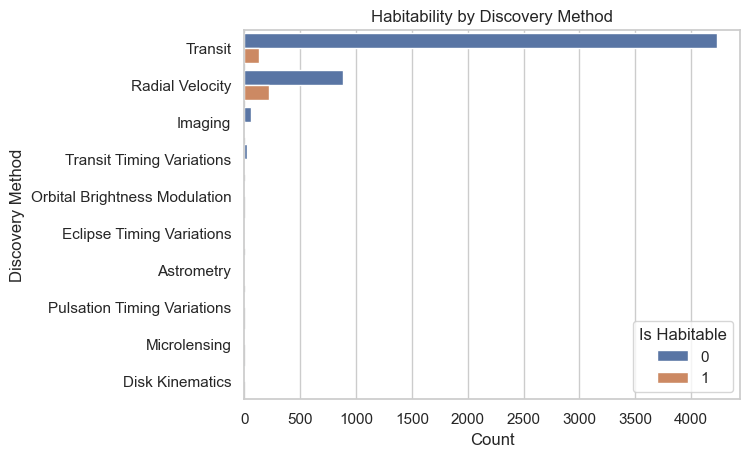

In [90]:
sns.countplot(data = df, y = "discoverymethod", hue = "is_in_hbtble_zone", order = df["discoverymethod"].value_counts().index)
plt.title("Habitability by Discovery Method")
plt.xlabel("Count")
plt.ylabel("Discovery Method")
plt.legend(title = "Is Habitable", loc = 'lower right')
plt.show()

Another piece of data that would be interesting to look at is how the number of planets, whether in HZ or not, is distributed across stellar hosts

4116


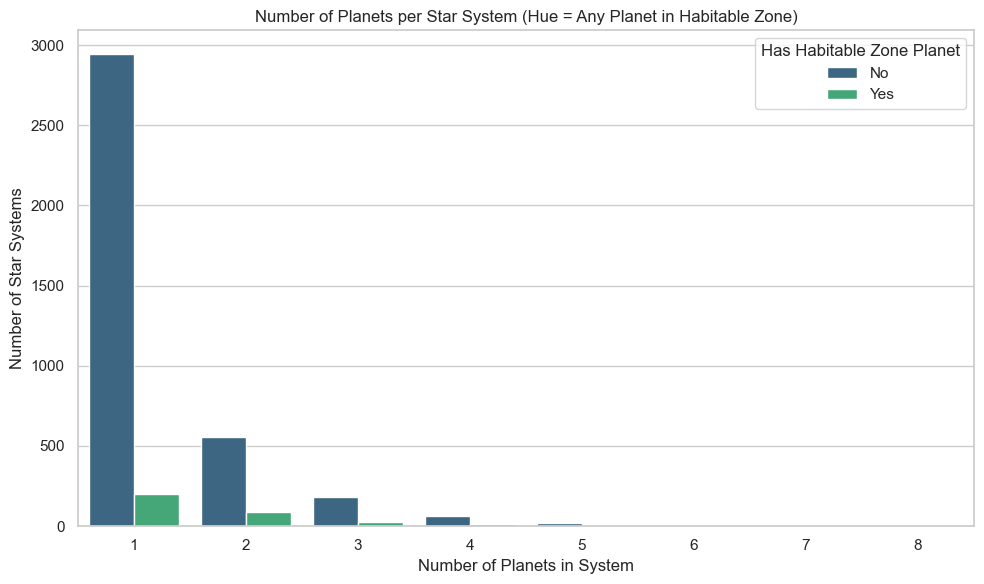

In [92]:
# Creating a count plot to show number of planets in the stellar systems with habitability overlay
# First, grouping by the host star (one row per star system), as our df has planets with sometimes same stellar hosts
system_summary = (
    df.groupby("hostname")
    .agg(
        sy_pnum = ("sy_pnum", "first"),
        has_hab = ("is_in_hbtble_zone", "max")  # max will be 1 if any planet in HZ
    )
    .reset_index()
)

print(len(system_summary))

# Creating the stacked bar chart
plt.figure(figsize = (10, 6))

sns.countplot(
    data = system_summary,
    x = "sy_pnum",
    hue = "has_hab",
    palette = "viridis"
)

# Updating labels
plt.title("Number of Planets per Star System (Hue = Any Planet in Habitable Zone)")
plt.xlabel("Number of Planets in System")
plt.ylabel("Number of Star Systems")
plt.legend(title = "Has Habitable Zone Planet", labels = ["No", "Yes"])

plt.tight_layout()
plt.show()


Okay, we've got quite a bit of information about the dataset and how different variables interact. We are ready to move to modelling phase.

## 5. Modeling

### 5.1. Redefining modeling goals
**Our main question:** What stellar and stellar system properties make a star more likely to host exoplanets in its habitable zone?

If we can answer this main research question, we'll be able to provide recommendations for researchers on what stars to look at in case they want to find potentially habitable exoplanets, saving resources on the search. Essentially, we want to discover low-hanging fruit — stars with obvious signs of hosting HZ planets.

If an organization is in the business of discovering exoplanets, they probably own telescopes/observatories that have limited capacity (in a sense that one telescope can only be pointed in one direction at a time). Thus, if my goal is to discover as many exoplanets in HZs as possible within a period of time, I want my machine learning model to recommend stars to look at only if the probability of discovering an exoplanet in HZ is very very high, because:
1. **False Positives are very expensive:** If I'm investigating duds, I'm wasting my telescope days and missing opportunities at the same time. Depeding on the detection method, these tests can take from a few days (transit) to years (radial velocity) of pointing the telescope in one direction.
2. **False Negatives are cheap:** If I'm missing or not investigating some of the stars with exoplanets (False Negatives), it's not that big of a problem. There are many other stars to look at + the models may improve in the future and point me in their direction.

**Metric Considerations:**
| Metric           | Use It?  | Rationale                                                              |
|------------------|----------|------------------------------------------------------------------------|
| **Accuracy**     | No       | Our dataset is imbalanced, so accuracy is not an informative metric    |
| **Precision**    | Yes      | We want almost every flagged candidate to be correct                   |
| **Recall**       | Yes      | We accept some missed discoveries, but want to keep them under control |
| **F1 Score**     | No       | Balances FP and FN equally — which doesn't reflect our priorities      |
| **F0.5 Score**   | Yes      | Puts more weight on Precision than Recall                              |
| **ROC AUC**      | Optional | Useful for comparing model quality                                     |
| **PR AUC**       | Optional | Tradeoff between Precision and Recall                                  |


Our optimization strategy will be to allow business to define a Precision threshold (e.g. 0.9 means that out of 10 attempts to follow model's recommendations, we expect to find HZ planets in 9) and optimize Recall within that threshold to keep False Negatives at bay. Essentially, we will optimize the cutoff point for our binary classification models to recommend a star as likely having HZ planets, given how much the observatory is willing to take risks. We will also look at ROC AUC to assess overall models' quality.

### 5.2.Shaping the dataset for modeling
To note:
1. Our dataset is exoplanet-centered, not star-centered -> we'll need to restructure the dataset to be star-centered, similar to how we did for count of planets.
2. We'll be looking at stellar and stellar systems properties only for determining potential of having planets in their HZs.

Let's proceed with converting the dataset to star-centered...

In [97]:
# Checking just in case whether all the planetary rows are unique in the current df
len(df['pl_name'].unique()) == len(df)

True

In [98]:
# Converting planet-centric dataframe to star-centric dataframe

# First, aggregating features that are unique per star
stellar_features = [
    "hostname",
    "st_teff", "st_lum", "st_mass", "st_rad",
    "st_logg", "st_met", "st_age",
    "sy_dist_log", "sy_pm", "sy_snum", "sy_gaiamag",
    "st_spectype_group"
]

# Starting from a drop-duplicates for stellar-level values
stars_df = df[stellar_features].drop_duplicates(subset = "hostname").set_index("hostname")

# Now aggregating planet counts and HZ counts per host star
planet_counts = df.groupby("hostname")["pl_name"].count().rename("sy_pnum")
hz_counts = df.groupby("hostname")["is_in_hbtble_zone"].sum().rename("hz_pnum")
hz_flag = (hz_counts > 0).astype(int).rename("has_hz_planet")

# Combining everything into one star-centric dataframe
stars_df = stars_df.join([planet_counts, hz_counts, hz_flag])

# Displaing the first few rows
stars_df.head()

,st_teff,st_lum,st_mass,st_rad,st_logg,st_met,st_age,sy_dist_log,sy_pm,sy_snum,sy_gaiamag,st_spectype_group,sy_pnum,hz_pnum,has_hz_planet
hostname,,,,,,,,,,,,,,,
51 Peg,5787.00,0.161000,1.050000,1.150,4.360000,0.2000,6.76,1.189249,216.460340,1,5.28647,G,1,0,0
55 Cnc,5235.00,-0.180000,0.960000,0.930,4.480000,0.3100,9.50,1.099870,539.132999,2,5.72973,G,5,1,1
HD 209458,6065.00,0.210000,1.119000,1.155,4.361000,0.0000,3.10,1.683962,34.568279,1,7.50866,NaN,1,0,0
HR 810,6097.00,0.250000,1.150000,1.180,4.380000,0.1100,2.72,1.238500,399.518185,1,5.25587,G,1,0,0
GJ 876,3293.74,-1.847021,0.369607,0.367,4.874911,0.2129,NaN,0.669797,1171.100949,1,8.87530,NaN,4,2,1


In [99]:
stars_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4116 entries, 51 Peg to nu Oct A
Data columns (total 15 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   st_teff            4113 non-null   float64
 1   st_lum             4116 non-null   float64
 2   st_mass            4109 non-null   float64
 3   st_rad             4101 non-null   float64
 4   st_logg            4050 non-null   float64
 5   st_met             3725 non-null   float64
 6   st_age             2580 non-null   float64
 7   sy_dist_log        4030 non-null   float64
 8   sy_pm              4096 non-null   float64
 9   sy_snum            4116 non-null   int32  
 10  sy_gaiamag         4075 non-null   float64
 11  st_spectype_group  786 non-null    object 
 12  sy_pnum            4116 non-null   int64  
 13  hz_pnum            4116 non-null   int64  
 14  has_hz_planet      4116 non-null   int64  
dtypes: float64(10), int32(1), int64(3), object(1)
memory usage: 627.5+ K

There are still null values across many stellar properties, especially spectral group (our only categorical variable). We will have to keep this in mind during modeling phase. However, there is an attribute - **st_logg** or stellar surface gravity measured in log10(cm/s²) - that we can fill through stellar physics equations. Specifically, to recover missing values, we will use the following astrophysical relationship:

$$
g = \frac{G M}{R^2}
\quad \Rightarrow \quad
M = \frac{g R^2}{G}
$$

Taking logarithms and expressing values in solar units:

$$
\log_{10} \left( \frac{g}{g_\odot} \right) = \log_{10} \left( \frac{M}{M_\odot} \right) - 2 \log_{10} \left( \frac{R}{R_\odot} \right)
$$

Rearranging to estimate surface gravity:

$$
\log g = \log M - 2 \log R + \log g_\odot
\quad \Rightarrow \quad \log g = \log M - 2 \log R + 4.44
$$

Assuming:
- $\log g_\odot \approx 4.44$
- $M$, $R$, and $g$ are in solar units

In [101]:
# Estimating st_logg where missing and mass & radius are available per the formulas above
mask_logg_missing = stars_df["st_logg"].isna()
mask_logg_fillable = mask_logg_missing & stars_df["st_mass"].notna() & stars_df["st_rad"].notna()
logg_estimates = np.log10(stars_df.loc[mask_logg_fillable, "st_mass"]) - 2 * np.log10(stars_df.loc[mask_logg_fillable, "st_rad"]) + 4.44

# Fill in st_logg and track which values were filled
stars_df.loc[mask_logg_fillable, "st_logg"] = logg_estimates
stars_df["st_logg_filled"] = False
stars_df.loc[mask_logg_fillable, "st_logg_filled"] = True

# Count how many values were filled
num_logg_filled = mask_logg_fillable.sum()
num_logg_filled

57

In [102]:
stars_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4116 entries, 51 Peg to nu Oct A
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   st_teff            4113 non-null   float64
 1   st_lum             4116 non-null   float64
 2   st_mass            4109 non-null   float64
 3   st_rad             4101 non-null   float64
 4   st_logg            4107 non-null   float64
 5   st_met             3725 non-null   float64
 6   st_age             2580 non-null   float64
 7   sy_dist_log        4030 non-null   float64
 8   sy_pm              4096 non-null   float64
 9   sy_snum            4116 non-null   int32  
 10  sy_gaiamag         4075 non-null   float64
 11  st_spectype_group  786 non-null    object 
 12  sy_pnum            4116 non-null   int64  
 13  hz_pnum            4116 non-null   int64  
 14  has_hz_planet      4116 non-null   int64  
 15  st_logg_filled     4116 non-null   bool   
dtypes: bool(1), float64(

Okay, now our dataset is as clean and full as we can make it with accessible tools. Let's proceed with defining our baseline accuracy and then switch to building models. Naive model that will yield the baseline accuracy will be to say that a star has no planets in its HZ regardless of stellar properties, which should be pretty accurate.

In [105]:
print(stars_df['has_hz_planet'].value_counts(normalize = True)) # Printing the value counts for vis

baseline_accuracy = (stars_df['has_hz_planet'] == 0).mean() # Assigning baseline_accuracy

# Printing our the results
print()
print(f'Our baseline accuracy is {100 * baseline_accuracy: .2f}%!')

has_hz_planet
0    0.916424
1    0.083576
Name: proportion, dtype: float64

Our baseline accuracy is  91.64%!


**Baseline accuracy:** 91.62%.

Now, let's proceed with defining features and a target variables as well as train and test splits...

In [107]:
# Preparing features and target
X = stars_df.drop(columns = "has_hz_planet")
y = stars_df["has_hz_planet"]

Now, let's proceed with modelling. Our plan is to:
1. Build a basic logistic regression and assess coefficient importance
2. Build more logistic regressions by playing with variables and tresholds, including the regularized one (Lasso)
3. Tree-based models (Decision Tree and Random Forest)
4. Support Vector Machine Classifier
5. Neural Network Classifier
6. Optimization of attributes through Grid Search



### 5.2. Basic Logistic Regression

In [109]:
# Separating numerical and categorical features for scaling/encoding in models
numerical_features = [
    "st_teff", "st_lum", "st_mass", "st_rad",
    "st_logg", "st_met", "st_age", "sy_dist_log",
    "sy_pm", "sy_snum", "sy_pnum", "sy_gaiamag"
]
categorical_features = ["st_spectype_group"]

In [110]:
# Building a pre-processing pipeline for numeric and categorical features
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.impute import SimpleImputer

# Adding Imputers as we still have some values missing in the dataset
num_imputer = SimpleImputer(strategy = "median") # Picking median to not be sensitive to outliers, of which are plenty
cat_imputer = SimpleImputer(strategy = "constant", fill_value = "missing")

preprocessor = ColumnTransformer(transformers = [
    ("num", Pipeline([("imputer", num_imputer), ("scaler", StandardScaler())]), numerical_features),
    ("cat", Pipeline([("imputer", cat_imputer), ("encoder", OneHotEncoder(handle_unknown = "ignore"))]), categorical_features)
])

In [111]:
# Logistic Regression model pipeline
from sklearn.linear_model import LogisticRegression

lr_pipe = Pipeline(steps = [
    ("preprocessor", preprocessor),
    ("lr", LogisticRegression(class_weight = "balanced", max_iter = 1000))
])

In [112]:
# Splitting to Train/Test with stratification to preserve the balance of outcomes
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y, random_state = 42)

In [113]:
# Checking preservation of the proportion of outcomes for a target variable
y_test.value_counts(normalize = True), y_train.value_counts(normalize = True)

(has_hz_planet
 0    0.916262
 1    0.083738
 Name: proportion, dtype: float64,
 has_hz_planet
 0    0.916464
 1    0.083536
 Name: proportion, dtype: float64)

In [114]:
# Fitting the pipeline and building predictions
lr_pipe.fit(X_train, y_train)
y_pred = lr_pipe.predict(X_test)
y_prob = lr_pipe.predict_proba(X_test)[:, 1]

[[580 175]
 [ 19  50]]


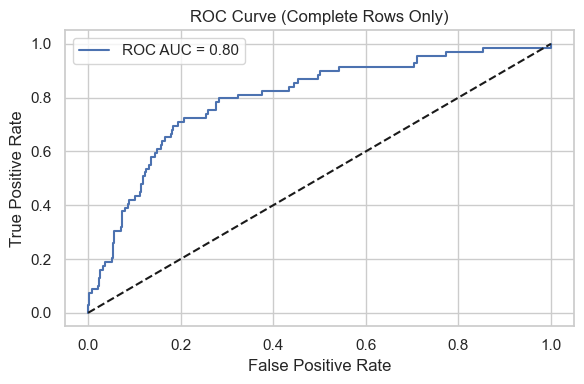

In [115]:
# Evaluating the metrics
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve

# Calculating confusion matrix and calculating ROC/AUC curve
conf_matrix = confusion_matrix(y_test, y_pred)
roc_auc = roc_auc_score(y_test, y_prob)

# Printing confusion matrix
print(conf_matrix)

# Plotting the ROC curve
fpr, tpr, _ = roc_curve(y_test, y_prob)
plt.figure(figsize = (6, 4))
plt.plot(fpr, tpr, label = f"ROC AUC = {roc_auc:.2f}")
plt.plot([0, 1], [0, 1], "k--")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve (Complete Rows Only)")
plt.legend()
plt.tight_layout()
plt.show()

Our model prioritizes minimization of False Negatives, which is correct as we don't want to miss any stars with exoplanets. At the same time, we're relatively less sensitive to False Positives as it's an attempt for us to check whether the star has exoplanets in HZ zone or not.

Also, we have 0.81 ROC AUC, which is a decent separation capability!

Now, let's assess the coefficients and their influence...

                      feature  coefficient  abs_coef
13        st_spectype_group_B     1.446148  1.446148
11                 sy_gaiamag    -1.142946  1.142946
12        st_spectype_group_A    -0.847722  0.847722
1                      st_lum    -0.737942  0.737942
3                      st_rad    -0.658867  0.658867
0                     st_teff    -0.469074  0.469074
16        st_spectype_group_K    -0.464065  0.464065
18        st_spectype_group_T    -0.421400  0.421400
15        st_spectype_group_G     0.415472  0.415472
10                    sy_pnum     0.309915  0.309915
14        st_spectype_group_F    -0.287392  0.287392
2                     st_mass     0.272238  0.272238
7                 sy_dist_log     0.230847  0.230847
17        st_spectype_group_M    -0.208757  0.208757
19  st_spectype_group_missing     0.206897  0.206897


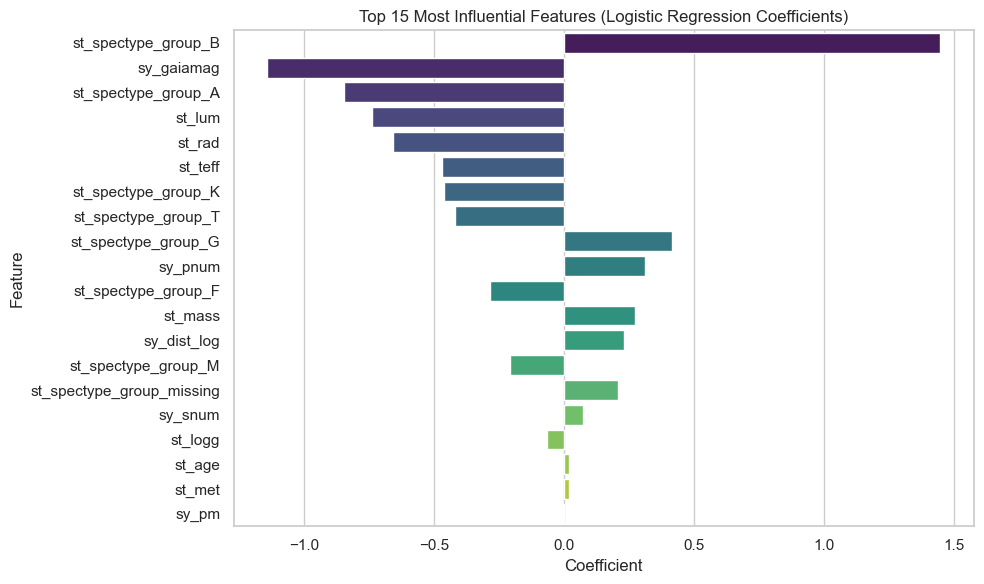

In [117]:
# Getting the trained logistic regression model
lr_model = lr_pipe.named_steps["lr"]

# Getting feature names from the preprocessor
#    (numerical names stay the same, categorical get expanded by OHE)
num_feats = numerical_features
cat_ohe_feats = list(
    lr_pipe.named_steps["preprocessor"]
           .named_transformers_["cat"]
           .named_steps["encoder"]
           .get_feature_names_out(categorical_features)
)

all_feature_names = num_feats + cat_ohe_feats

# Combining with model coefficients
coef_df = pd.DataFrame({
    "feature": all_feature_names,
    "coefficient": lr_model.coef_[0]
})
coef_df["abs_coef"] = coef_df["coefficient"].abs()

# Sorting by absolute importance
top_features = coef_df.sort_values(by = "abs_coef", ascending = False)

# Displaying top 15
print(top_features.head(15))

# Plotting top 15
# Plot
plt.figure(figsize = (10, 6))
sns.barplot(data = top_features, x = "coefficient", y = "feature", palette = "viridis")
plt.title("Top 15 Most Influential Features (Logistic Regression Coefficients)")
plt.xlabel("Coefficient")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

##### **Insights:**

We trained a logistic regression model to estimate the probability that a given stellar system hosts at least one planet in the habitable zone (HZ), based solely on stellar and system-level attributes — excluding any planetary orbital data.

Despite its simplicity, the model performed reasonably well in prioritizing likely HZ-hosting systems. While its *overall accuracy is lower than a naive baseline* that always predicts "no HZ planet," it achieved **strong ROC-AUC coverage** and maintained a useful *recall/precision trade-off*, making it valuable for candidate selection where false positives are acceptable and false negatives are way less desirable (even though not critical).

The most influential features included:
- **Negative predictors**: **st_lum** and **sy_gaiamag**, both indicating that brighter or closer stars (which are more thoroughly studied) may skew our detection bias. E.g. brighter stars may have a further-away habitable zone, which makes detection harder, while detecting exoplanets for far-away stars may be more complicated as well.
- **Positive predictors**: certain **st_spectype_group** categories, **sy_dist_log**, and **st_mass**, aligning with known correlations between multi-planet systems and higher detection probabilities.

However, we note that the *spectral type group data is sparse across the dataset* — with many stars missing this classification altogether. This likely inflates the apparent influence of certain spectral categories in the coefficient plot and introduces instability in the model's interpretation. Furthermore, *spectral type is itself a composite proxy for physical parameters like luminosity, temperature, and radius*, which are already included in our feature set.

As a result, one of our next steps will be to *evaluate model performance with spectral type dropped entirely*, relying instead on the underlying physical variables. This should help reduce redundancy, stabilize coefficients, and improve generalizability when scoring unclassified stars (e.g., from Gaia).

In summary, this logistic regression model serves as a strong and interpretable baseline — and it's already showing meaningful separation between likely HZ-hosting stars and the rest.

### 5.3. Further modeling
As we will have to vary the models, attributes, and various approaches to pre-processing, I'll define a generic function that will allow us to be flexible in what we want to do and essentially turn on/off components as requested. I'll also define helper functions (1) to optimize the probability threshold given the precision target and max recall requirement and (2) to store results of running the model.

In [223]:
# Importing additional libraries
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Helper function to find threshold maximizing Recall with minimum Precision constraint
def find_best_threshold_for_recall(y_true, y_proba, min_precision = 0.9):
    '''
    Function iterates through cutoff points for probabilities to recommend a star for research
    and is trying to find the cutoff (or threshold) that gives the highest recall given the min
    precision specified by a user. In case min precision is too high, it finds threshold with
    the highest possible precision and picks it, saving both precision and threshold
    '''
    thresholds = np.linspace(0.0, 1.0, 101)
    best_threshold = None
    best_recall = 0.0

    fallback_threshold = None
    max_precision = 0.0
    fallback_recall = 0.0

    for threshold in thresholds:
        y_pred = (y_proba >= threshold).astype(int)
        precision = precision_score(y_true, y_pred, zero_division = 0)
        recall = recall_score(y_true, y_pred)

        # Tracking highest recall that meets min precision
        if precision >= min_precision and recall > best_recall:
            best_threshold = threshold
            best_recall = recall
            best_precision = precision

        # Tracking fallback max precision (in case no threshold satisfies the constraint)
        if precision > max_precision:
            max_precision = precision
            fallback_threshold = threshold
            fallback_recall = recall

    # If no threshold met min_precision, falling back to best available precision
    if best_threshold is None:
        print(f"No threshold found with precision ≥ {min_precision}. Falling back to max precision = {max_precision:.2f}")
        return fallback_threshold, max_precision, fallback_recall
    else:
        return best_threshold, best_precision, best_recall


# Re-defining the main function after reset and cleanup
def run_flex_binary_class_model(
    df,                                               # Dataframe is explicitly passed
    model,                                            # Model type to use
    numeric_features,                                 # Numeric features to use for easier varying
    categorical_features = None,                      # Categorical features to use for easier varying
    use_scaler = True,                                # Flag to scale numerical features vs. not
    use_imputer = True,                               # Flag to use imputer or not (for both numeric and categorical features)
    use_polynomial = False,                           # Flag to use PolynomialFeatures
    poly_degree = 2,                                  # Degree of PolynomialFeatures; ignored if use_polynomial is False
    test_size = 0.2,                                  # Test set relative size
    random_state = 42,                                # Random state for fair comparisons
    use_grid_search = False,                          # Whether to use GridSearchCV or not
    cv_folds = 5,                                     # How many folds to use in GridSearch
    param_grid = None,                                # Parameter grid to use with GridSearch; ignored if use_grid_search is False
    scoring = "roc_auc",                              # Scoring for GridSearchCV
    target_column = "has_hz_planet",                  # Target column is explicitly passed
    optimize_recall_with_precision_threshold = True,  # Flag to optimize recall under precision constraint
    target_min_precision = 0.9,                       # Minimum precision required if optimizing recall
    manual_threshold = None                           # Manual override threshold if not optimizing
):
    # Dropping rows with missing target
    df = df.dropna(subset = [target_column])

    # Dropping rows if not imputing
    if not use_imputer:
        df = df.dropna(subset = numeric_features + (categorical_features if categorical_features else []))

    # Creating feature and label sets
    X = df[numeric_features + (categorical_features if categorical_features else [])]
    y = df[target_column]

    # Building numeric preprocessing pipeline
    num_steps = []
    if use_imputer:
        num_steps.append(("imputer", SimpleImputer(strategy = "median")))
    if use_polynomial:
        num_steps.append(("poly", PolynomialFeatures(degree = poly_degree, include_bias = False)))
    if use_scaler:
        num_steps.append(("scaler", StandardScaler()))
    num_pipeline = Pipeline(num_steps)

    # Building categorical preprocessing pipeline
    if categorical_features:
        cat_pipeline = Pipeline([
            ("imputer", SimpleImputer(strategy = "constant", fill_value = "missing")) if use_imputer else ("passthrough", "passthrough"),
            ("encoder", OneHotEncoder(handle_unknown = "ignore"))
        ])
    else:
        cat_pipeline = "drop"

    # Combining both pipelines into full preprocessor
    preprocessor = ColumnTransformer(transformers = [
        ("num", num_pipeline, numeric_features),
        ("cat", cat_pipeline, categorical_features if categorical_features else [])
    ])

    # Building full pipeline
    base_pipeline = Pipeline([
        ("preprocessor", preprocessor),
        ("model", model)
    ])

    # Wrapping with GridSearch if requested
    if use_grid_search and param_grid:
        pipeline = GridSearchCV(base_pipeline, param_grid = param_grid, cv = cv_folds, scoring = scoring, n_jobs = -1)
    else:
        pipeline = base_pipeline

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, stratify = y, random_state = random_state)

    # Fit model
    pipeline.fit(X_train, y_train)
    y_proba = pipeline.predict_proba(X_test)[:, 1]

    # Determine threshold
    threshold_note = ""
    if optimize_recall_with_precision_threshold:
        threshold_used, precision_at_thresh, recall_at_thresh = find_best_threshold_for_recall(
            y_test, y_proba, min_precision = target_min_precision
        )
        if precision_at_thresh < target_min_precision:
            threshold_note = "fallback"
    else:
        threshold_used = manual_threshold if manual_threshold is not None else 0.5
        precision_at_thresh = precision_score(y_test, (y_proba >= threshold_used).astype(int), zero_division = 0)
        recall_at_thresh = recall_score(y_test, (y_proba >= threshold_used).astype(int))

    # Final prediction
    y_pred = (y_proba >= threshold_used).astype(int)

    # Metrics
    conf = confusion_matrix(y_test, y_pred)
    acc = accuracy_score(y_test, y_pred)
    roc = roc_auc_score(y_test, y_proba)

    metrics_df = pd.DataFrame({
        "ROC AUC": [roc],
        "Accuracy": [acc],
        "Precision": [precision_at_thresh],
        "Recall": [recall_at_thresh],
        "True Neg": [conf[0, 0]],
        "False Pos": [conf[0, 1]],
        "False Neg": [conf[1, 0]],
        "True Pos": [conf[1, 1]],
        "Threshold": [threshold_used]
    })

    # Plotting
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    thresholds = np.linspace(0.0, 1.0, 101)
    recalls, precisions = [], []
    for t in thresholds:
        yt = (y_proba >= t).astype(int)
        recalls.append(recall_score(y_test, yt))
        precisions.append(precision_score(y_test, yt, zero_division = 0))

    fig, axs = plt.subplots(1, 2, figsize = (14, 5))

    # Plotting ROC curve
    axs[0].plot(fpr, tpr, label = f"ROC AUC = {roc:.2f}")
    axs[0].plot([0, 1], [0, 1], "k--")
    axs[0].set_title("ROC Curve")
    axs[0].set_xlabel("False Positive Rate")
    axs[0].set_ylabel("True Positive Rate")
    axs[0].legend()

    # Plotting threshold-based curves
    axs[1].plot(thresholds, recalls, label = "Recall")
    axs[1].plot(thresholds, precisions, label = "Precision")
    axs[1].axhline(y = target_min_precision, color = "red", linestyle = "--", label = f"Target Min Precision = {target_min_precision}")
    axs[1].axvline(x = threshold_used, color = "black", linestyle = "--", label = f"Threshold Used = {threshold_used:.2f}")
    if threshold_note == "fallback":
        axs[1].axhline(y = precision_at_thresh, color = "orange", linestyle = ":", label = f"Max Precision = {precision_at_thresh:.2f}")

    axs[1].set_title("Metrics vs. Classification Threshold")
    axs[1].set_xlabel("Threshold")
    axs[1].set_ylabel("Score")
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()
    plt.show()

    # Final return
    best_estimator = pipeline.best_estimator_ if use_grid_search else pipeline
    predictions_df = pd.DataFrame({
        "y_true": y_test.values,
        "y_pred": y_pred,
        "y_proba": y_proba
    }, index = y_test.index)

    return metrics_df, best_estimator, predictions_df

# Helper function to store evaluation results
def store_metrics(result_df, model_name, metrics_row):
    # Append metrics to results_df with model_name as index
    result_df.loc[model_name] = metrics_row.iloc[0]
    return result_df

Now, let's model!

#### 5.3.1. Rerunning our basic Logistic Regression

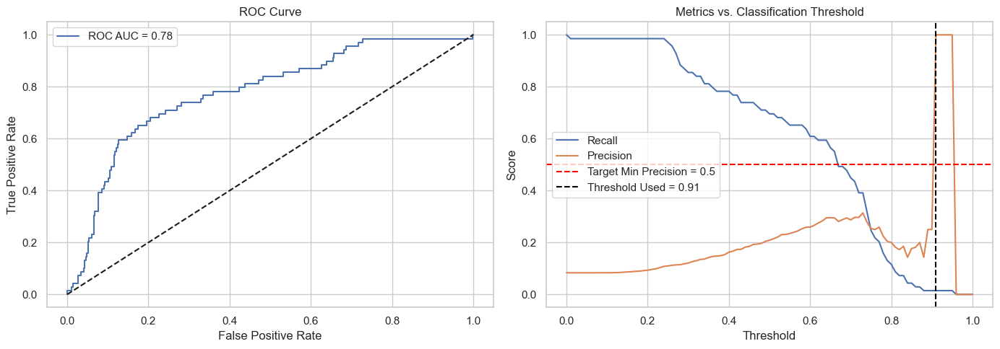

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
0,0.778251,0.917476,1.0,0.014493,755,0,68,1,0.91


In [225]:
# Redefining feature list for visibility
numeric_features = [
    "st_teff", "st_lum", "st_mass", "st_rad",
    "st_logg", "st_met", "st_age", "sy_dist_log",
    "sy_pm", "sy_snum", "sy_gaiamag"
]
categorical_features = ["st_spectype_group"]

# Running the base Logistic Regression model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = LogisticRegression(class_weight = "balanced", max_iter = 1000),
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    target_column = "has_hz_planet",
    use_scaler = True,
    use_imputer = True,
    use_polynomial = False,
    poly_degree = 2,
    test_size = 0.2,
    random_state = 42,
    use_grid_search = False,
    param_grid = None,
    scoring = "roc_auc",
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.5,
    manual_threshold = None
)

# Displaying the metrics
metrics_df

In [226]:
# Recording the results with our function
results_df = pd.DataFrame(columns = metrics_df.columns)
results_df = store_metrics(results_df, model_name = "logreg_base", metrics_row = metrics_df)
results_df

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.0,0.014493,755.0,0.0,68.0,1.0,0.91


In [227]:
# Checking predicted probabilities df to see how the distribution looks like
predictions_df["y_proba"].describe()

count    824.000000
mean       0.401234
std        0.202430
min        0.000021
25%        0.247314
50%        0.339527
75%        0.527333
max        0.950337
Name: y_proba, dtype: float64

#### 5.3.2. Logistic Regression without spectral type

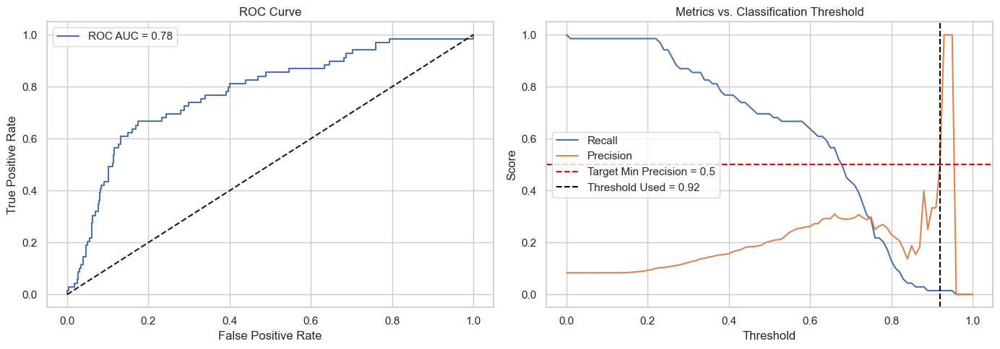

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
0,0.776908,0.916262,0.5,0.014493,754,1,68,1,0.92


In [229]:
# Defining a better attirbutes
numeric_features = [
    "st_teff", "st_lum", "st_mass", "st_rad",
    "st_logg", "st_met", "st_age", "sy_dist_log",
    "sy_pm", "sy_snum", "sy_gaiamag"
]

# Leaving spectral type out, which leaves us only with numeric features
categorical_features = []

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = LogisticRegression(class_weight = "balanced", max_iter = 1000),
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    target_column = "has_hz_planet",
    use_scaler = True,
    use_imputer = True,
    use_polynomial = False,
    poly_degree = 2,
    test_size = 0.2,
    random_state = 42,
    use_grid_search = False,
    param_grid = None,
    scoring = "roc_auc",
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.5,
    manual_threshold = None
)

# Review
metrics_df

In [230]:
# Recording the results
results_df = store_metrics(results_df, model_name = "logreg_no_spectral_type", metrics_row = metrics_df)
results_df

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.0,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.5,0.014493,754.0,1.0,68.0,1.0,0.92


Our suspicions were correct - spectral type, even though it was giving very strong influence on the result coefficients-wise, didn't affect the quality of the model that much. It's a function of the numeric attributes, plus is very sparce. Thus, removing it makes more sence.

The optimization of picking the higher precision is not the best option here, since we're significantly losing on recall by picking slightly higher precision on its second higher peak. Rerunning the model with manual_threshold of ~0.73-0.74 makes more sense. Unlikely business will be very happy with trying only three stars (True Positives + False Positives) for one successful outcome (True Positives).

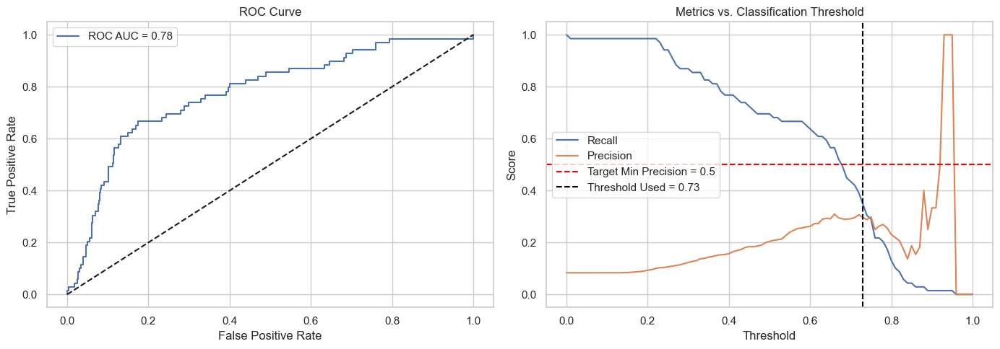

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
0,0.776908,0.876214,0.296296,0.347826,698,57,45,24,0.73


In [232]:
# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = LogisticRegression(class_weight = "balanced", max_iter = 1000),
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    target_column = "has_hz_planet",
    use_scaler = True,
    use_imputer = True,
    use_polynomial = False,
    poly_degree = 2,
    test_size = 0.2,
    random_state = 42,
    use_grid_search = False,
    param_grid = None,
    scoring = "roc_auc",
    optimize_recall_with_precision_threshold = False,
    target_min_precision = 0.5,
    manual_threshold = 0.73
)

# Review
metrics_df

In [233]:
# Recording the results
results_df = store_metrics(results_df, model_name = "logreg_no_spectral_type_0.73", metrics_row = metrics_df)
results_df

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73


Here we see that removing spectral type somewhat weakened the model in terms of Precision-Recall balance, so maybe having them still in there will be a good idea.

Let's plot coefficients and see how much influence each of them has now...

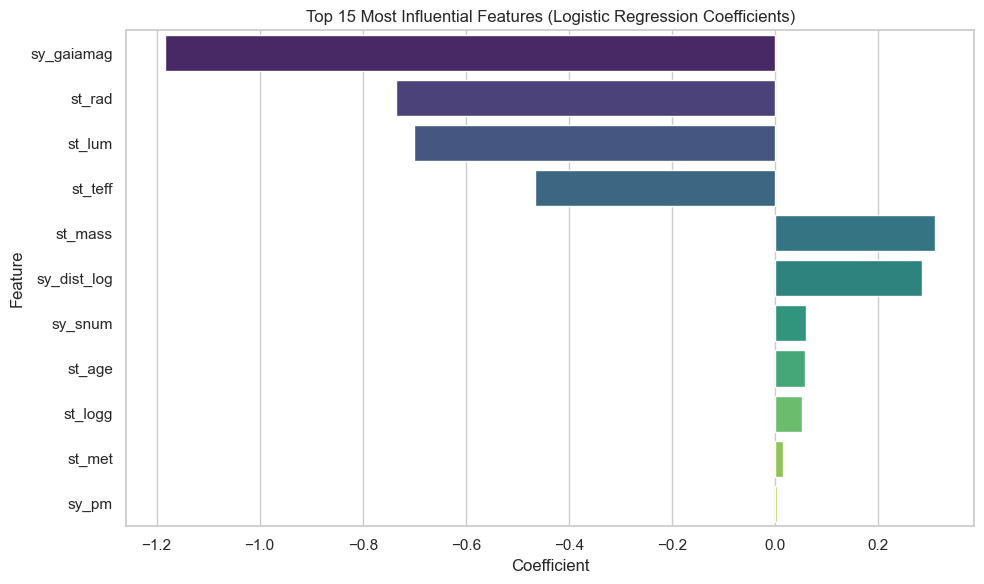

In [235]:
# Extracting the trained logistic regression model from within our best_model (part of function output)
lr_model = best_model.named_steps["model"]  # same as pipeline["model"] in our case, since we're not doing GridSearchCV

# Getting numeric feature names
feature_names = best_model.named_steps["preprocessor"] \
                          .transformers_[0][1] \
                          .named_steps["scaler"] \
                          .get_feature_names_out(numeric_features)

# Matching features to coefficients
coef_df = pd.DataFrame({
    "feature": feature_names,
    "coefficient": lr_model.coef_[0]
})
coef_df["abs_coef"] = coef_df["coefficient"].abs()
coef_df = coef_df.sort_values(by = "abs_coef", ascending = False)

# Step 4: Plotting top 15
plt.figure(figsize = (10, 6))
sns.barplot(data = coef_df.head(15), x = "coefficient", y = "feature", palette = "viridis")
plt.title("Top 15 Most Influential Features (Logistic Regression Coefficients)")
plt.xlabel("Coefficient")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

Everything looks pretty straightforward and as expected. I'll try minimizing numeric features used given the following:
1. **sy_gaiamag** is strongly correlated with **sy_dist_log** (~0.77)
2. **st_age** and **st_met** didn't show strong influence during exploratory DA
3. **st_rad**, **st_mass**, and **st_logg** are dependent - we can leave only two or one - **st_logg** - that combines both radius and mass
4. **sy_pm** shows very low influence

Then I will run Lasso on a full set of numeric features and compare the results with this regression with minimized feature set...

#### 5.3.3. Logistic Regression with minimal features

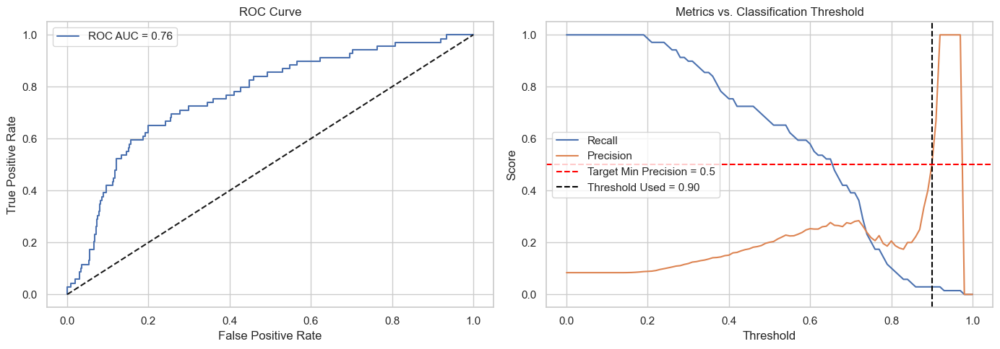

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
0,0.764833,0.916262,0.5,0.028986,753,2,67,2,0.9


In [238]:
# Defining a better attirbutes
numeric_features = [
    "st_teff", "st_lum", "st_logg",
    "sy_dist_log", "sy_snum"
]

# Leaving spectral type out, which leaves us only with numeric features
categorical_features = []

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = LogisticRegression(class_weight = "balanced", max_iter = 1000),
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    target_column = "has_hz_planet",
    use_scaler = True,
    use_imputer = True,
    use_polynomial = False,
    poly_degree = 2,
    test_size = 0.2,
    random_state = 42,
    use_grid_search = False,
    param_grid = None,
    scoring = "roc_auc",
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.5,
    manual_threshold = None
)

# Review
metrics_df

In [239]:
# Recording the results
results_df = store_metrics(results_df, model_name = "logreg_minimal_features", metrics_row = metrics_df)
results_df

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90


Interestingly, we've improved over **logreg_no_spectral_type** model in terms of trying only two stars with one win, but overall, if Recall needs to be at least somewhat high, we will have to go with approximately ~0.71 threshold, which will yield similar results to **logreg_no_spectral_type_0.73**.

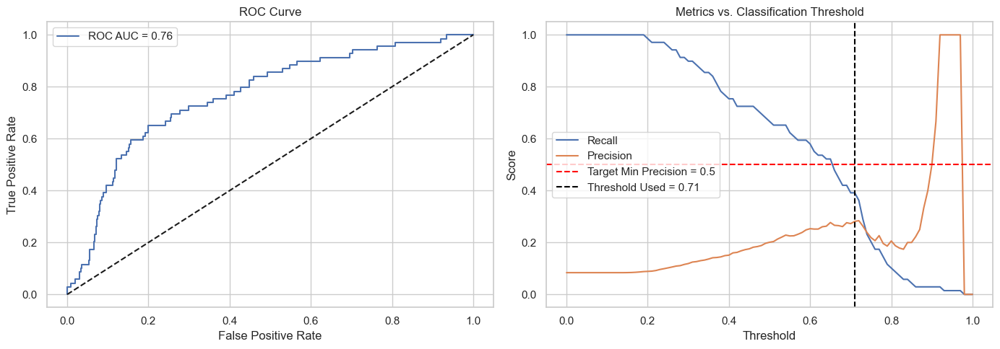

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
0,0.764833,0.865291,0.28125,0.391304,686,69,42,27,0.71


In [241]:
# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = LogisticRegression(class_weight = "balanced", max_iter = 1000),
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    target_column = "has_hz_planet",
    use_scaler = True,
    use_imputer = True,
    use_polynomial = False,
    poly_degree = 2,
    test_size = 0.2,
    random_state = 42,
    use_grid_search = False,
    param_grid = None,
    scoring = "roc_auc",
    optimize_recall_with_precision_threshold = False,
    target_min_precision = 0.5,
    manual_threshold = 0.71
)

# Review
metrics_df

In [242]:
# Recording the results
results_df = store_metrics(results_df, model_name = "logreg_minimal_features_0.71", metrics_row = metrics_df)
results_df

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71


Now, I'm going to try Lasso Logistic Regression to see how it will prioritize coefficients...

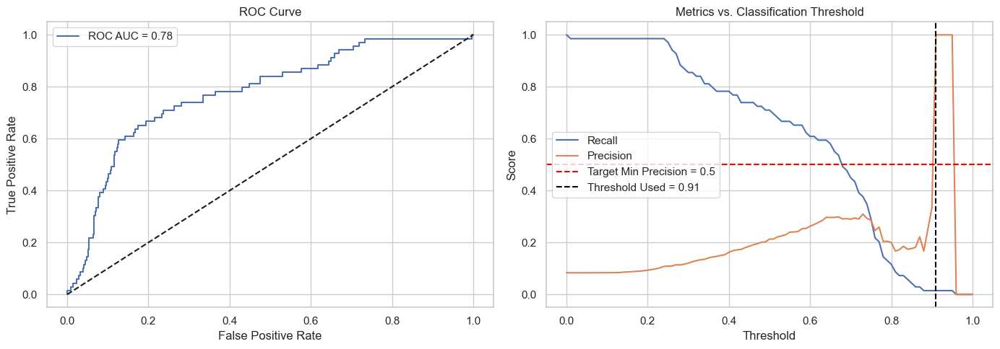

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
0,0.777618,0.917476,1.0,0.014493,755,0,68,1,0.91


In [244]:
# Defining the model
lasso_lr = LogisticRegression(penalty = "l1", solver = "liblinear", class_weight = "balanced", C = 1.0, max_iter = 1000)

# Redefining features to capture all of them for Lasso
numeric_features = [
    "st_teff", "st_lum", "st_mass", "st_rad",
    "st_logg", "st_met", "st_age", "sy_dist_log",
    "sy_pm", "sy_snum", "sy_gaiamag"
]
categorical_features = ["st_spectype_group"]

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = lasso_lr,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    target_column = "has_hz_planet",
    use_scaler = True,
    use_imputer = True,
    use_polynomial = False,
    poly_degree = 2,
    test_size = 0.2,
    random_state = 42,
    use_grid_search = False,
    param_grid = None,
    scoring = "roc_auc",
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.5,
    manual_threshold = None
)

# Review
metrics_df


In [245]:
# Recording the results
results_df = store_metrics(results_df, model_name = "lasso_reg_1.0_all_features", metrics_row = metrics_df)
results_df

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91


Our Lasso Regression essentially repeated the initial **logreg_base**. Let's check if the coefficients stayed the same...

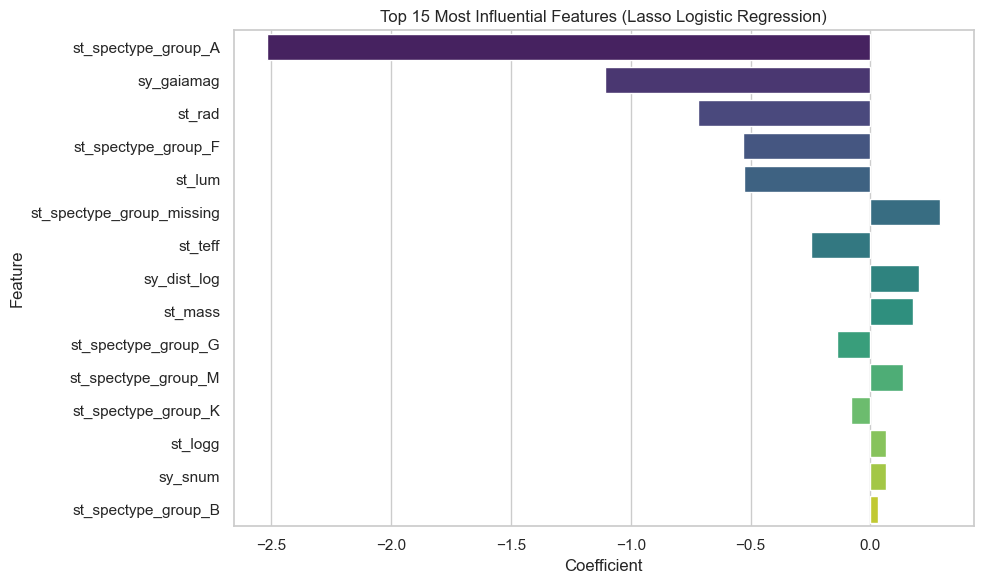

In [247]:
# Extracting the trained logistic regression model from within our best_model (part of function output)
model = best_model.named_steps["model"]  # same as pipeline["model"] in our case, since we're not doing GridSearchCV

# Getting transformed feature names from preprocessor
preprocessor = best_model.named_steps["preprocessor"]

# Getting numeric feature names
num_transformer = preprocessor.named_transformers_["num"]
if "poly" in num_transformer.named_steps:
    numeric_feat_names = num_transformer.named_steps["poly"].get_feature_names_out(numeric_features)
else:
    numeric_feat_names = np.array(numeric_features)

# Get OHE categorical feature names (if any)
if "cat" in preprocessor.transformers_[1][0]:
    cat_transformer = preprocessor.named_transformers_["cat"]
    if hasattr(cat_transformer.named_steps["encoder"], "get_feature_names_out"):
        cat_feat_names = cat_transformer.named_steps["encoder"].get_feature_names_out(categorical_features)
    else:
        cat_feat_names = []
else:
    cat_feat_names = []

# Combine all final feature names
all_feature_names = np.concatenate([numeric_feat_names, cat_feat_names])

# Step 3: Match coefficients to features
coef_df = pd.DataFrame({
    "feature": all_feature_names,
    "coefficient": model.coef_[0]
})
coef_df["abs_coef"] = coef_df["coefficient"].abs()
coef_df = coef_df.sort_values(by = "abs_coef", ascending = False)

# Step 4: Plot top coefficients
plt.figure(figsize = (10, 6))
sns.barplot(data = coef_df.head(15), x = "coefficient", y = "feature", palette = "viridis")
plt.title("Top 15 Most Influential Features (Lasso Logistic Regression)")
plt.xlabel("Coefficient")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

Essentially, the same picture as we had with our base logistic regression. Now, let's try Polynomial transformations, other models, and then GridSearch as well...

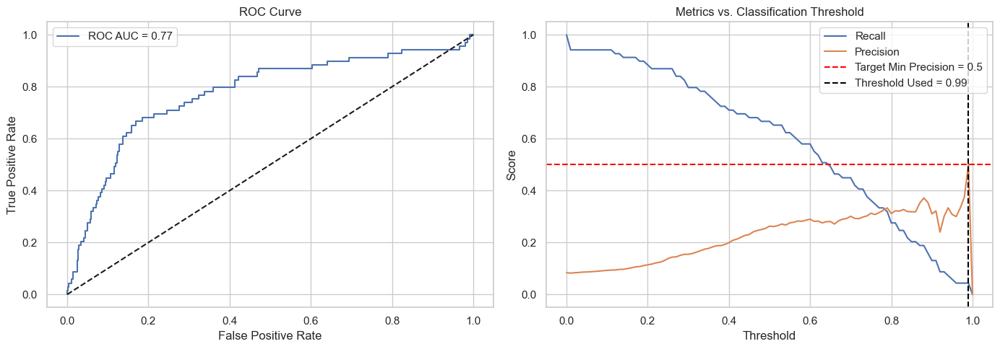

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99


In [249]:
# Re-stating the model again
lasso_lr = LogisticRegression(penalty = "l1", solver = "liblinear", class_weight = "balanced", C = 1.0, max_iter = 1000)

# Redefining features to capture all of them for Lasso
numeric_features = [
    "st_teff", "st_lum", "st_mass", "st_rad",
    "st_logg", "st_met", "st_age", "sy_dist_log",
    "sy_pm", "sy_snum", "sy_gaiamag"
]
categorical_features = ["st_spectype_group"]

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = lasso_lr,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    target_column = "has_hz_planet",
    use_scaler = True,
    use_imputer = True,
    use_polynomial = True,                                # Specifying polynomial transformations of features
    poly_degree = 4,                                      # Setting the degree to 4, since some 
    test_size = 0.2,
    random_state = 42,
    use_grid_search = False,
    param_grid = None,
    scoring = "roc_auc",
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.5,
    manual_threshold = None
)

# Reviewing the results and recording into Results DF
results_df = store_metrics(results_df, model_name = "lasso_reg_1.0_poly_4", metrics_row = metrics_df)
results_df

The model seems to have improved, as getting approximately 2 out of 5 tries is potentially somewhat acceptable to the imaginary customer. Let's assess the coefficients...

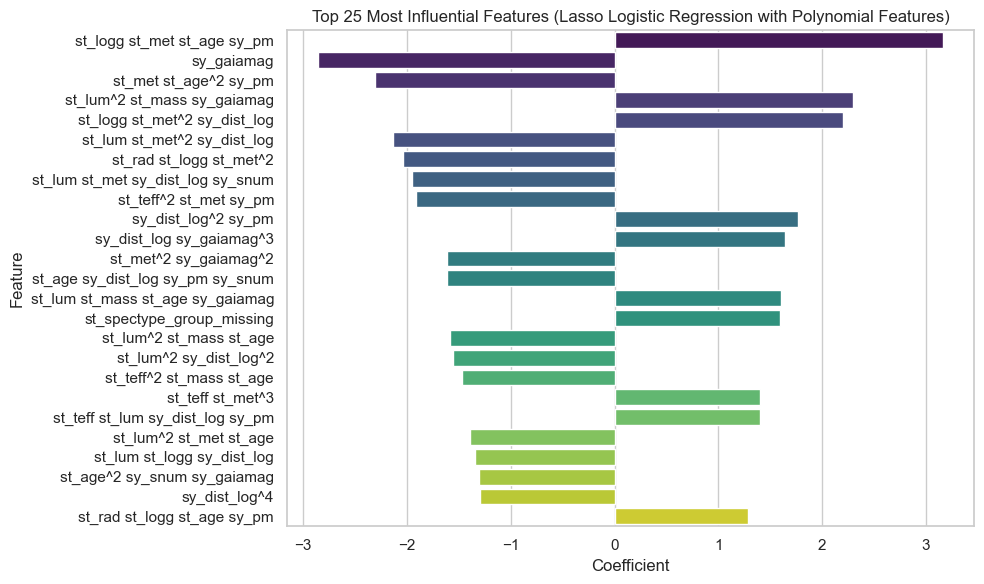

In [251]:
# Extracting the trained logistic regression model from within our best_model (part of function output)
model = best_model.named_steps["model"]  # same as pipeline["model"] in our case, since we're not doing GridSearchCV

# Getting transformed feature names from preprocessor
preprocessor = best_model.named_steps["preprocessor"]

# Getting numeric feature names
num_transformer = preprocessor.named_transformers_["num"]
if "poly" in num_transformer.named_steps:
    numeric_feat_names = num_transformer.named_steps["poly"].get_feature_names_out(numeric_features)
else:
    numeric_feat_names = np.array(numeric_features)

# Get OHE categorical feature names (if any)
if "cat" in preprocessor.transformers_[1][0]:
    cat_transformer = preprocessor.named_transformers_["cat"]
    if hasattr(cat_transformer.named_steps["encoder"], "get_feature_names_out"):
        cat_feat_names = cat_transformer.named_steps["encoder"].get_feature_names_out(categorical_features)
    else:
        cat_feat_names = []
else:
    cat_feat_names = []

# Combine all final feature names
all_feature_names = np.concatenate([numeric_feat_names, cat_feat_names])

# Step 3: Match coefficients to features
coef_df = pd.DataFrame({
    "feature": all_feature_names,
    "coefficient": model.coef_[0]
})
coef_df["abs_coef"] = coef_df["coefficient"].abs()
coef_df = coef_df.sort_values(by = "abs_coef", ascending = False)

# Step 4: Plot top coefficients
plt.figure(figsize = (10, 6))
sns.barplot(data = coef_df.head(25), x = "coefficient", y = "feature", palette = "viridis")
plt.title("Top 25 Most Influential Features (Lasso Logistic Regression with Polynomial Features)")
plt.xlabel("Coefficient")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

Even though the model has improved in terms of the metrics we're assessing, its coefficients do not make much sense. Such multiplicaions as **st_mass** by **st_age**^2 by **sy_gaiamag** lack any physical foundation. Let's limit the degree to 2 and see whether it gets better...

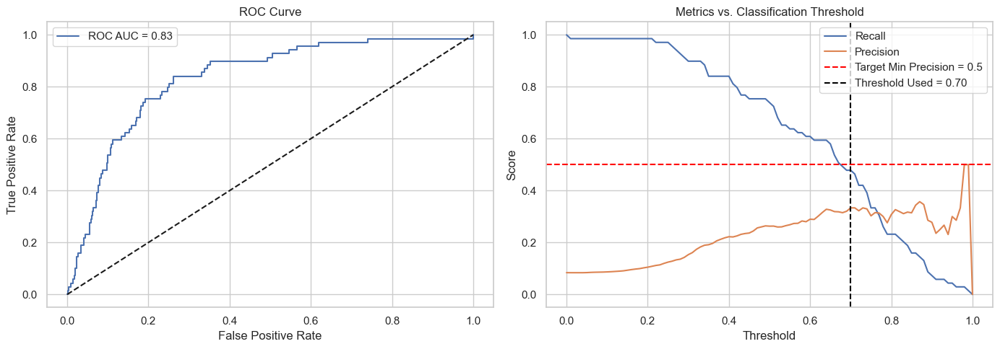

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70


In [253]:
# Re-stating the model again
lasso_lr = LogisticRegression(penalty = "l1", solver = "liblinear", class_weight = "balanced", C = 1.0, max_iter = 1000)

# Redefining features to capture all of them for Lasso
numeric_features = [
    "st_teff", "st_lum", "st_mass", "st_rad",
    "st_logg", "st_met", "st_age", "sy_dist_log",
    "sy_pm", "sy_snum", "sy_gaiamag"
]
categorical_features = ["st_spectype_group"]

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = lasso_lr,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    target_column = "has_hz_planet",
    use_scaler = True,
    use_imputer = True,
    use_polynomial = True,                                # Specifying polynomial transformations of features
    poly_degree = 2,                                      # Setting the degree to 2
    test_size = 0.2,
    random_state = 42,
    use_grid_search = False,
    param_grid = None,
    scoring = "roc_auc",
    optimize_recall_with_precision_threshold = False,     # Specified manual threshold, since it's otherwise overoptimizing for precision
    target_min_precision = 0.5,
    manual_threshold = 0.7                                # Specified manual threshold, since it's otherwise overoptimizing for precision
)

# Reviewing the results and recording into Results DF
results_df = store_metrics(results_df, model_name = "lasso_reg_1.0_poly_2", metrics_row = metrics_df)
results_df

With polynomial features up to degree 2, the model yields better results on our test set than the previous best Lasso logistic regression without poly features. Let's assess its coefficients...

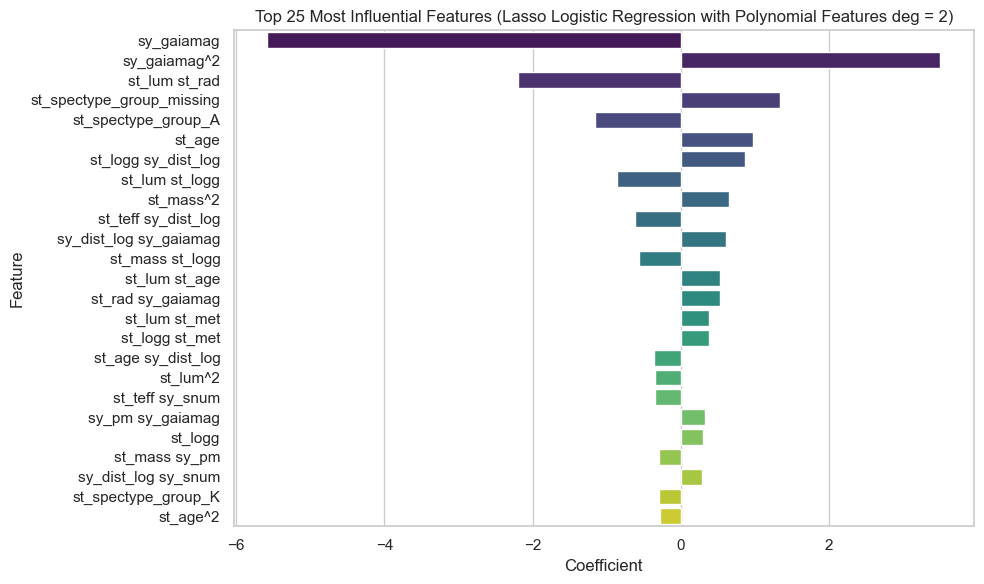

In [255]:
# Extracting the trained logistic regression model from within our best_model (part of function output)
model = best_model.named_steps["model"]  # same as pipeline["model"] in our case, since we're not doing GridSearchCV

# Getting transformed feature names from preprocessor
preprocessor = best_model.named_steps["preprocessor"]

# Getting numeric feature names
num_transformer = preprocessor.named_transformers_["num"]
if "poly" in num_transformer.named_steps:
    numeric_feat_names = num_transformer.named_steps["poly"].get_feature_names_out(numeric_features)
else:
    numeric_feat_names = np.array(numeric_features)

# Get OHE categorical feature names (if any)
if "cat" in preprocessor.transformers_[1][0]:
    cat_transformer = preprocessor.named_transformers_["cat"]
    if hasattr(cat_transformer.named_steps["encoder"], "get_feature_names_out"):
        cat_feat_names = cat_transformer.named_steps["encoder"].get_feature_names_out(categorical_features)
    else:
        cat_feat_names = []
else:
    cat_feat_names = []

# Combine all final feature names
all_feature_names = np.concatenate([numeric_feat_names, cat_feat_names])

# Step 3: Match coefficients to features
coef_df = pd.DataFrame({
    "feature": all_feature_names,
    "coefficient": model.coef_[0]
})
coef_df["abs_coef"] = coef_df["coefficient"].abs()
coef_df = coef_df.sort_values(by = "abs_coef", ascending = False)

# Step 4: Plot top coefficients
plt.figure(figsize = (10, 6))
sns.barplot(data = coef_df.head(25), x = "coefficient", y = "feature", palette = "viridis")
plt.title("Top 25 Most Influential Features (Lasso Logistic Regression with Polynomial Features deg = 2)")
plt.xlabel("Coefficient")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

**Observations:**
- Some of these coefficients already make a bit more intuitive sense. For example, **st_lum** * **st_rad** intuitively decreases the probability of having a detectable planet in HZ.
- However, **sy_gaiamag** with it's bi-directional influence and many combinations still do not make sense

Interpretability of the model is decreasing. Thus we are not going to use PolynomialFeatures going forward. The willing may want to try reducing the number of numeric features and still introducing the degree of poly transformations, but it's unclear whether it'll yield any result.

Let's proceed with tree-based models...

No threshold found with precision ≥ 0.9. Falling back to max precision = 0.26


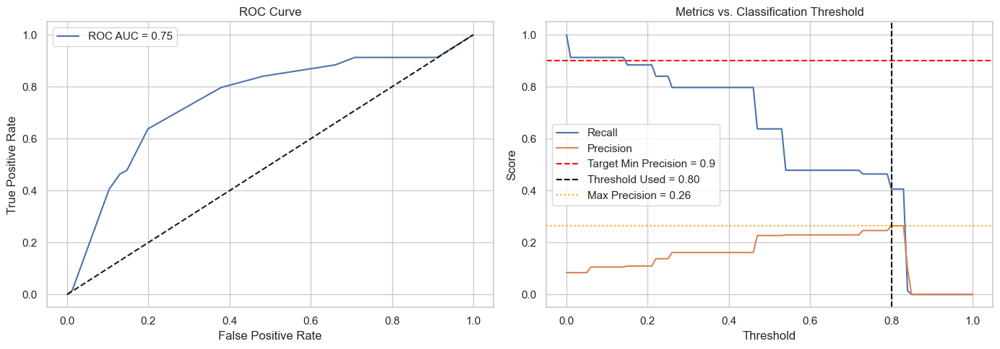

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80


In [257]:
from sklearn.tree import DecisionTreeClassifier

# Defining the model
tree_model = DecisionTreeClassifier(max_depth = 5, class_weight = "balanced", random_state = 42)

# Running the model with the same set of numeric and categorical features
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = tree_model,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = False,                       # Trees don't need feature scaling
    use_imputer = True,                       # Still need to fill in missing values
    use_polynomial = False,                   # No need for polynomial expansion here
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.9
)

# Reviewing the results and saving them to the results DF
results_df = store_metrics(results_df, model_name = "dtree_depth_5", metrics_row = metrics_df)
results_df

So far Logistic Regression is doing better, as both Recall and Precision, as well as ROC AUC went down.

Let's try deeper trees...

No threshold found with precision ≥ 0.9. Falling back to max precision = 0.27


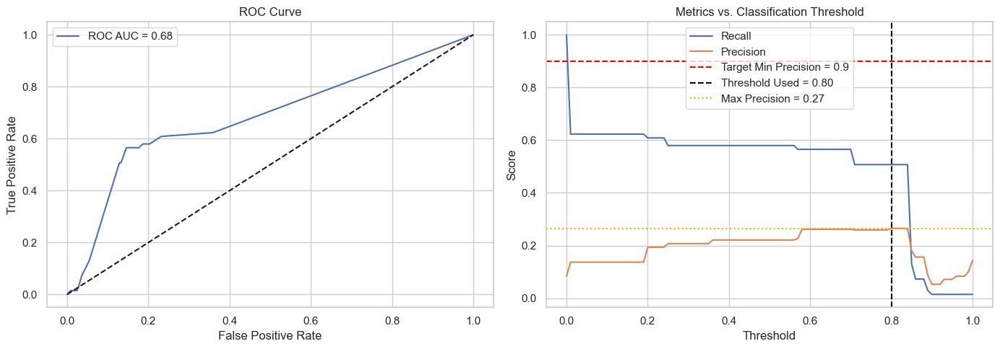

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80
dtree_depth_10,0.683837,0.841019,0.265152,0.507246,658.0,97.0,34.0,35.0,0.80


In [259]:
# Defining the model
tree_model = DecisionTreeClassifier(max_depth = 10, class_weight = "balanced", random_state = 42)

# Running the model with the same set of numeric and categorical features
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = tree_model,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = False,                       # Trees don't need feature scaling
    use_imputer = True,                       # Still need to fill in missing values
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.9
)

# Reviewing the results and saving them to the results DF
results_df = store_metrics(results_df, model_name = "dtree_depth_10", metrics_row = metrics_df)
results_df

Deeper tree seems to perform not as well as degree 5, but it's probably a good idea to GridSearch for the best parameters... Let's try degree 3 and plot the tree!

No threshold found with precision ≥ 0.9. Falling back to max precision = 0.25


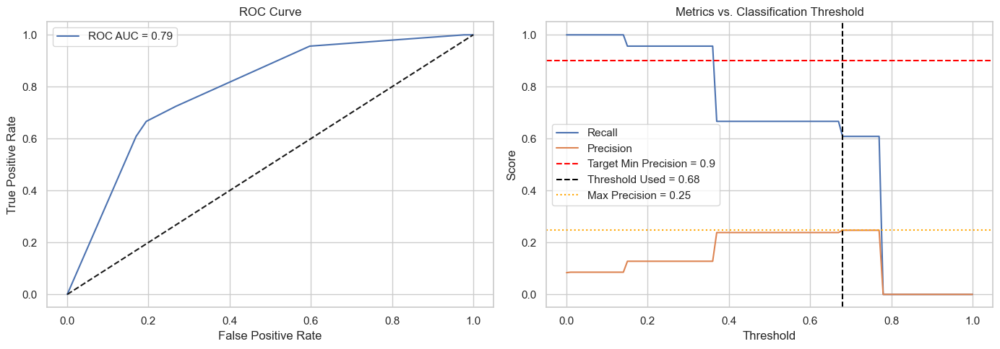

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80
dtree_depth_10,0.683837,0.841019,0.265152,0.507246,658.0,97.0,34.0,35.0,0.80


In [261]:
# Defining the model
tree_model = DecisionTreeClassifier(max_depth = 3, class_weight = "balanced", random_state = 42)

# Running the model with the same set of numeric and categorical features
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = tree_model,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = False,                       # Trees don't need feature scaling
    use_imputer = True,                       # Still need to fill in missing values
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.9
)

# Reviewing the results and saving them to the results DF
results_df = store_metrics(results_df, model_name = "dtree_depth_3", metrics_row = metrics_df)
results_df

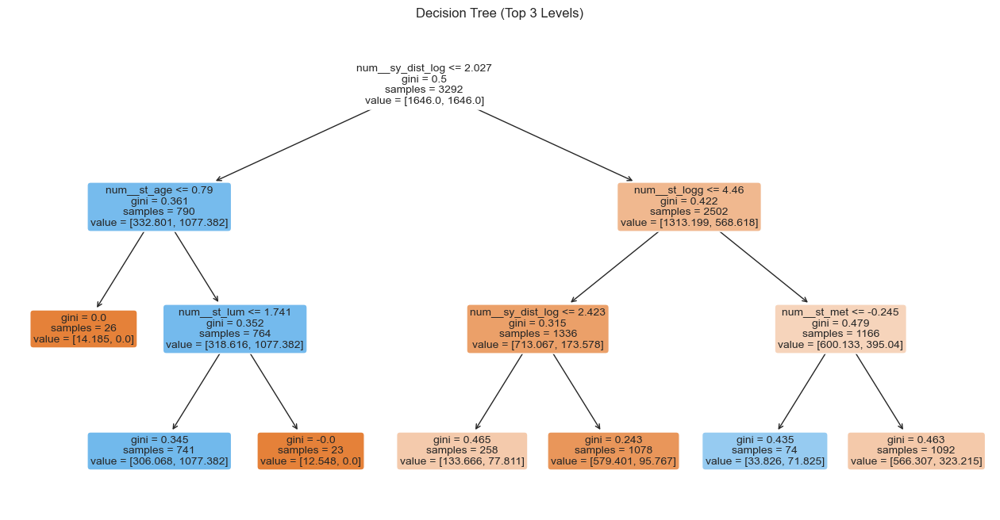

In [262]:
from sklearn.tree import plot_tree

plt.figure(figsize = (16, 8))
plot_tree(best_model.named_steps["model"], 
          feature_names = best_model.named_steps["preprocessor"].get_feature_names_out(),
          filled = True, rounded = True, max_depth = 3, fontsize = 10)
plt.title("Decision Tree (Top 3 Levels)")
plt.show()

It's a decent and a pretty interpretable model that will be relatively easy to explain to an imaginary customer with all splits more or less making some intuitive sense...

Let's try Random Forest!

No threshold found with precision ≥ 0.9. Falling back to max precision = 0.37


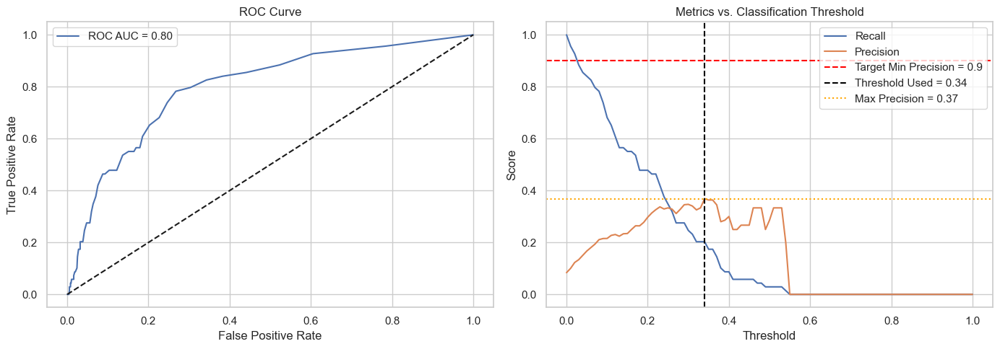

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80
dtree_depth_10,0.683837,0.841019,0.265152,0.507246,658.0,97.0,34.0,35.0,0.80


In [264]:
from sklearn.ensemble import RandomForestClassifier

# Defining Random Forest model
rf_model = RandomForestClassifier(
    n_estimators = 100,             # Standard number of trees
    max_depth = None,               # Not going to limit for now
    class_weight = "balanced",      # To handle class imbalance
    random_state = 42,              
)

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = rf_model,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = False,                                  # No scaling needed for tree-based models
    use_imputer = True,                                  # Still need to fill NaNs
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.9
)

# Viewing and recording the results
results_df = store_metrics(results_df, model_name = "forest_100_trees_depth_unlim", metrics_row = metrics_df)
results_df

This is a way less interpretable model, but results look like this could be offered to the imaginary customer as the one that recommends very few options, but errs out only ~33% of the time. One problem I see here is that the chart looks very "teethy", so I wouldn't be surprised if this peak is a result of a dataset's structure. Let's try tweaking random_state and test_size...

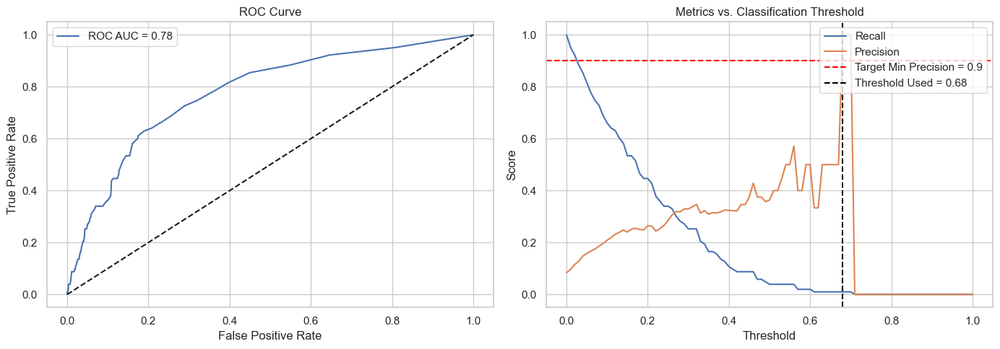

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80
dtree_depth_10,0.683837,0.841019,0.265152,0.507246,658.0,97.0,34.0,35.0,0.80


In [266]:
# Defining Random Forest model
rf_model = RandomForestClassifier(
    n_estimators = 100,             # Standard number of trees
    max_depth = None,               # Not going to limit for now
    class_weight = "balanced",      # To handle class imbalance
    random_state = 4200000,         ##### Changing random state
)

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = rf_model,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = False,                                  # No scaling needed for tree-based models
    use_imputer = True,                                  # Still need to fill NaNs
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.9,
    test_size = 0.3
)

# Viewing and recording the results
results_df = store_metrics(results_df, model_name = "forest_100_trees_depth_unlim_retry", metrics_row = metrics_df)
results_df

Okay, the result more or less reappeared. Then it doesn't look like we got the previous result accidentally. Thus, the model is a viable option for an imaginary customer that values the cost of False Positives as very very high and prefers to make very few tries for less errors.

Now, let's assess the importance of the coefficients...

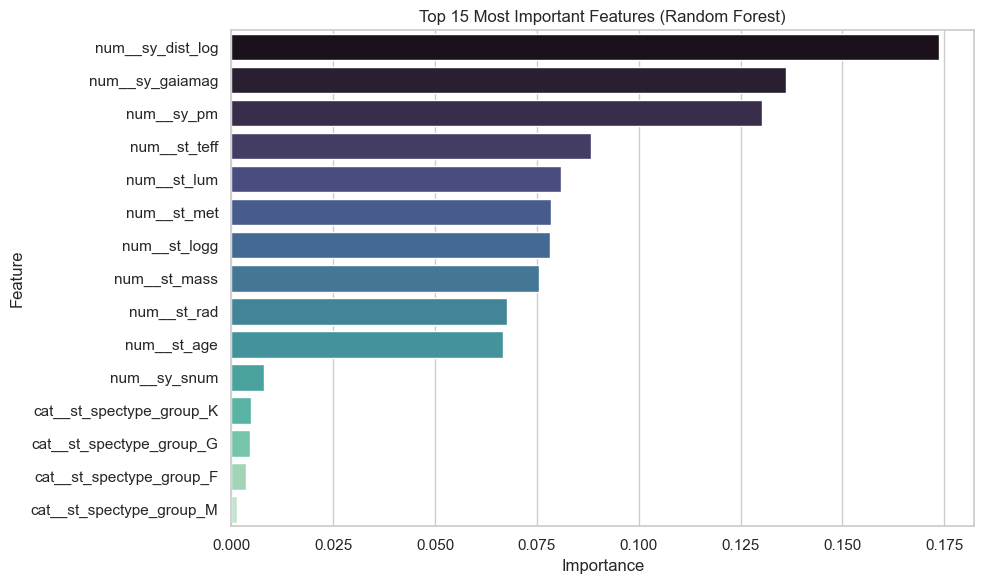

In [268]:
# Getting the fitted random forest model from the pipeline
rf = best_model.named_steps["model"]

# Getting final feature names (including OHE or polynomial if used)
feature_names = best_model.named_steps["preprocessor"].get_feature_names_out()

# Building the importances dataframe
importances_df = pd.DataFrame({
    "feature": feature_names,
    "importance": rf.feature_importances_
}).sort_values(by = "importance", ascending = False)

# Plotting top 15 features
plt.figure(figsize = (10, 6))
sns.barplot(data = importances_df.head(15), x = "importance", y = "feature", palette = "mako")
plt.title("Top 15 Most Important Features (Random Forest)")
plt.xlabel("Importance")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

Surprisingly, stellar system features seem to be more important than stellar properties, which random forest considers amost equal!

Now, let's try limiting the trees to depth 5...

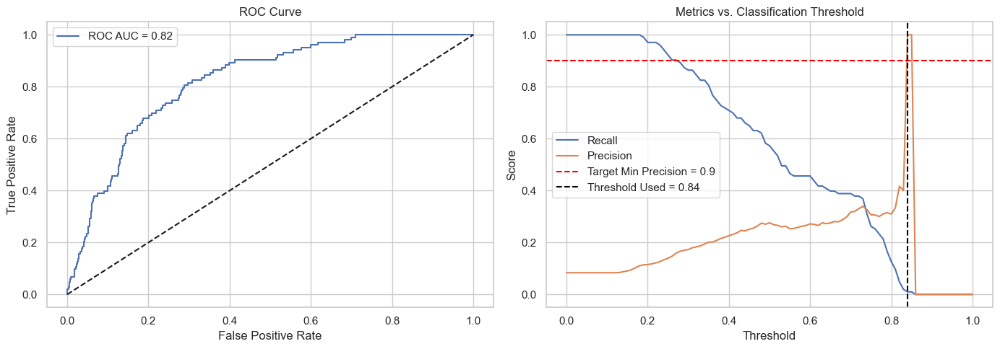

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80
dtree_depth_10,0.683837,0.841019,0.265152,0.507246,658.0,97.0,34.0,35.0,0.80


In [270]:
# Defining Random Forest model
rf_model = RandomForestClassifier(
    n_estimators = 100,             # Standard number of trees
    max_depth = 5,                  ##### Changing to 5
    class_weight = "balanced",      # To handle class imbalance
    random_state = 45,              ##### Changing random state
)

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = rf_model,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = False,                                  # No scaling needed for tree-based models
    use_imputer = True,                                  # Still need to fill NaNs
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.9,
    test_size = 0.3
)

# Viewing and recording the results
results_df = store_metrics(results_df, model_name = "forest_100_trees_depth_5", metrics_row = metrics_df)
results_df

This model showed similar results to other forests. Let's switch to Support Vector Machines... 

No threshold found with precision ≥ 0.9. Falling back to max precision = 0.67


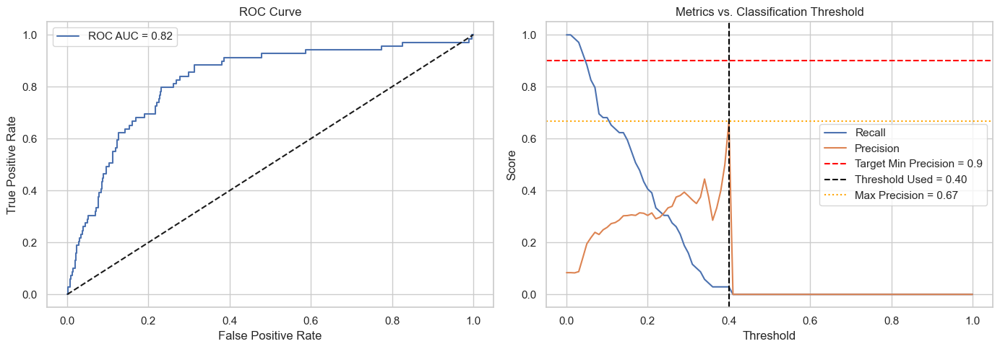

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80
dtree_depth_10,0.683837,0.841019,0.265152,0.507246,658.0,97.0,34.0,35.0,0.80


In [272]:
from sklearn.svm import SVC

# Defining the model
svc_model = SVC(
    kernel = "rbf",                 
    probability = True,             # Required for predict_proba() and ROC analysis
    class_weight = "balanced",      # Adjusts weights inversely to class frequencies
    C = 1.0,                        # Regularization strength
    gamma = "scale",                
    random_state = 42
)

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = svc_model,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = True,                                                 # SVM is sensitive to feature scales
    use_imputer = True,                                                # Required if any NaNs present
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.9
)

# Viewing and recording the results
results_df = store_metrics(results_df, model_name = "SVC_1.0", metrics_row = metrics_df)
results_df

Interestingly, this model gives a pretty high Precision with lower threshold. Recall falls very quickly though. I'll try different random_state and test size to see if anything changes...

No threshold found with precision ≥ 0.9. Falling back to max precision = 0.43


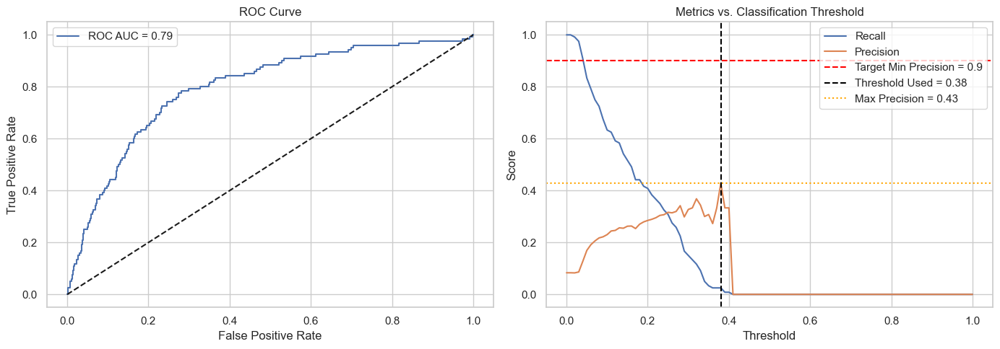

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80
dtree_depth_10,0.683837,0.841019,0.265152,0.507246,658.0,97.0,34.0,35.0,0.80


In [274]:
# Defining the model
svc_model = SVC(
    kernel = "rbf",                 
    probability = True,             # Required for predict_proba() and ROC analysis
    class_weight = "balanced",      # Adjusts weights inversely to class frequencies
    C = 1.0,                        # Regularization strength
    gamma = "scale",                
    random_state = 42000            ##### Changed
)

# Running the model
metrics_df, best_model, predictions_df = run_flex_binary_class_model(
    df = stars_df,
    model = svc_model,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = True,                                                 # SVM is sensitive to feature scales
    use_imputer = True,                                                # Required if any NaNs present
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.9,
    test_size = 0.35
)

# Viewing and recording the results
results_df = store_metrics(results_df, model_name = "SVC_1.0_retry", metrics_row = metrics_df)
results_df

Retry of SVC yielded similar results. Let's now switch to grid search optimizations...

🔍 Running lasso_lr_grid_search...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.50


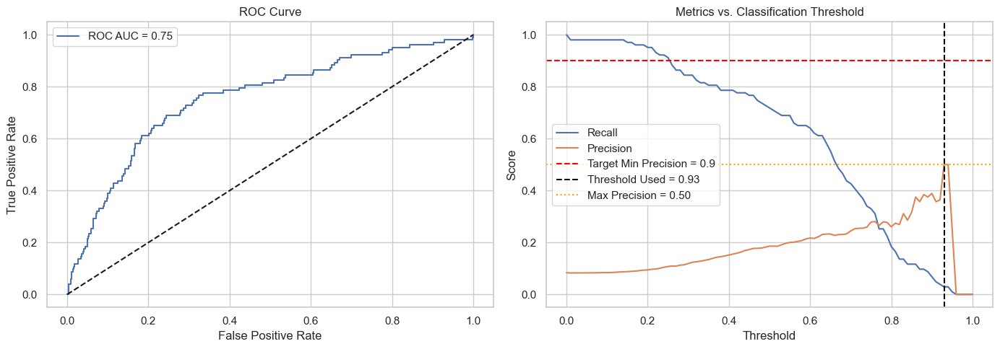

🔍 Running dt_grid_search...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.25


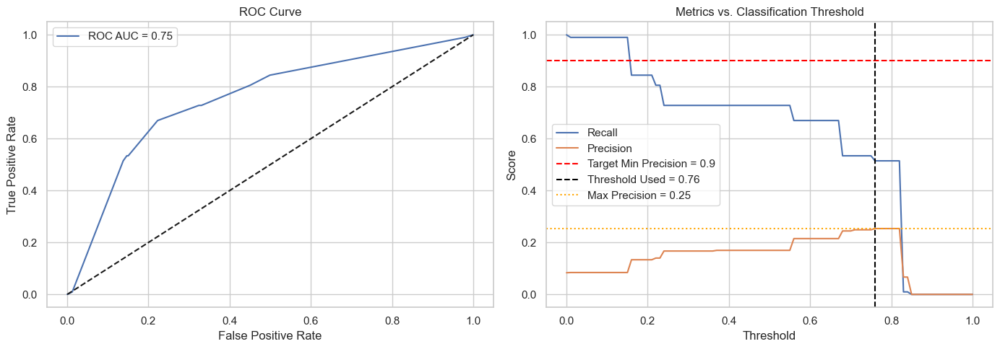

🔍 Running rf_grid_search...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.60


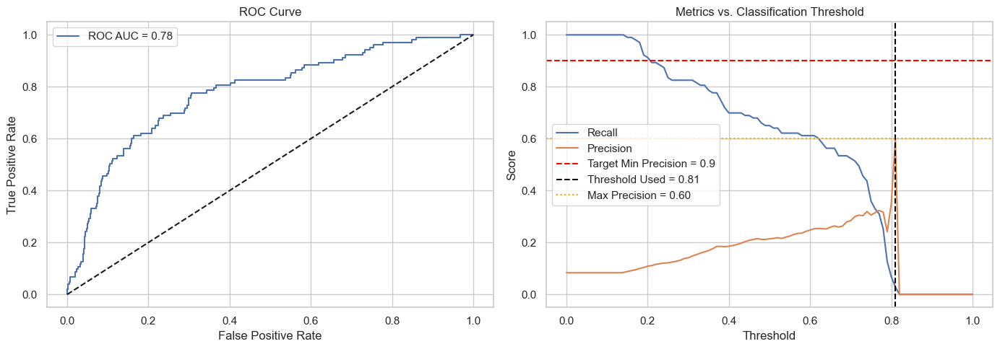

🔍 Running svc_grid_search...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.50


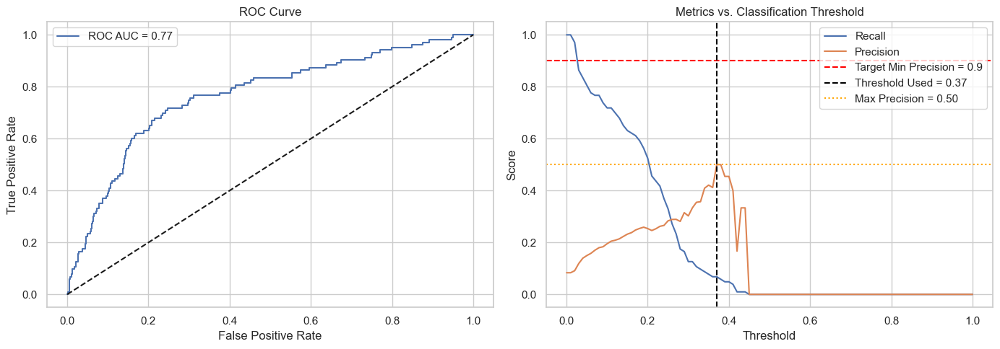

In [276]:
# Defining base models to optimize with Grid Search
models = {
    "lasso_lr": LogisticRegression(penalty = "l1", solver = "liblinear", class_weight = "balanced", max_iter = 1000),
    "dt": DecisionTreeClassifier(class_weight = "balanced", random_state = 42),
    "rf": RandomForestClassifier(class_weight = "balanced", random_state = 42, n_jobs = -1),
    "svc": SVC(probability = True, class_weight = "balanced", random_state = 42)
}

# Defining parameter grids for grid searching
param_grids = {
    "lasso_lr": {
        "model__C": [0.01, 0.1, 1, 10]  # L1 regularization strength
    },
    "dt": {
        "model__max_depth": [3, 4, 5, 6, 7, 8, 10, None],
        "model__min_samples_split": [2, 5, 10]
    },
    "rf": {
        "model__n_estimators": [100, 200],
        "model__max_depth": [4, 5, 7, 10, None],
        "model__min_samples_split": [2, 5]
    },
    "svc": {
        "model__C": [0.1, 1, 10],
        "model__kernel": ["linear", "rbf"],
        "model__gamma": ["scale", "auto"]
    }
}

# Iterating through models and saving best models in the dictionaryfor future assessments
best_models_dict = {}  # Dictionary to store each best_model by name

for name, model in models.items():
    model_name = f"{name}_grid_search"
    print(f"🔍 Running {model_name}...")

    metrics_df, best_model, predictions_df = run_flex_binary_class_model(
        df = stars_df,
        model = model,
        numeric_features = numeric_features,
        categorical_features = categorical_features,
        use_scaler = (name in ["lasso_lr", "svc"]),   # Only scale for LR & SVC
        use_imputer = True,
        use_polynomial = False,
        use_grid_search = True,
        param_grid = param_grids[name],
        optimize_recall_with_precision_threshold = True,
        target_min_precision = 0.9,
        random_state = 1,
        test_size = 0.3
    )

    # Store results
    results_df = store_metrics(results_df, model_name, metrics_df)

    best_models_dict[model_name] = best_model

In [277]:
results_df

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80
dtree_depth_10,0.683837,0.841019,0.265152,0.507246,658.0,97.0,34.0,35.0,0.80


Grid Search doesn't seem to provide some breakthrough results for any of the models:
- Lasso has the same results -> it probably hasn't changed
- Decision Tree looks exactly the same as depth 4 one -> also no change
- Random Forest seems to have a perfect Precision with just calling one observation as "has_hz_planets", which will very likely change as we change random_state and test_size
- SVC gives more or less the same results

Let's try optimizing running the model with different seed and test_size to see how muc results will change...

🔍 Running lasso_lr_grid_search_retry...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.40


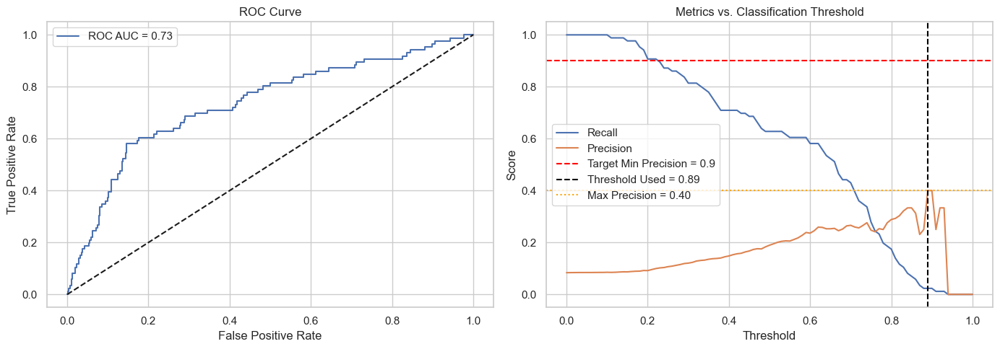

🔍 Running dt_grid_search_retry...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.23


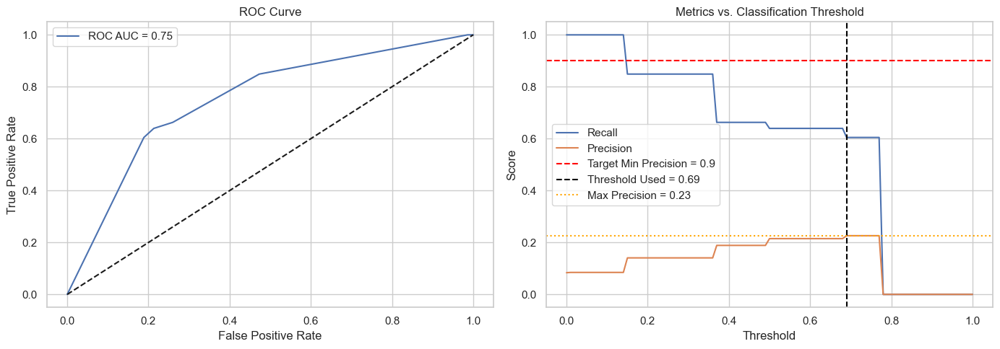

🔍 Running rf_grid_search_retry...


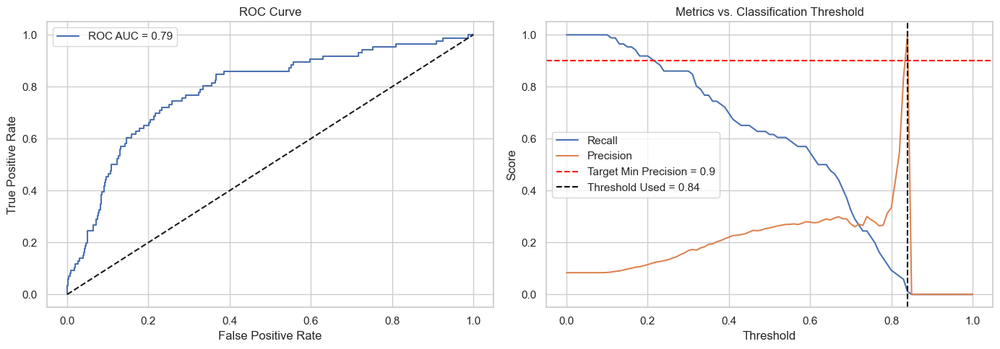

🔍 Running svc_grid_search_retry...


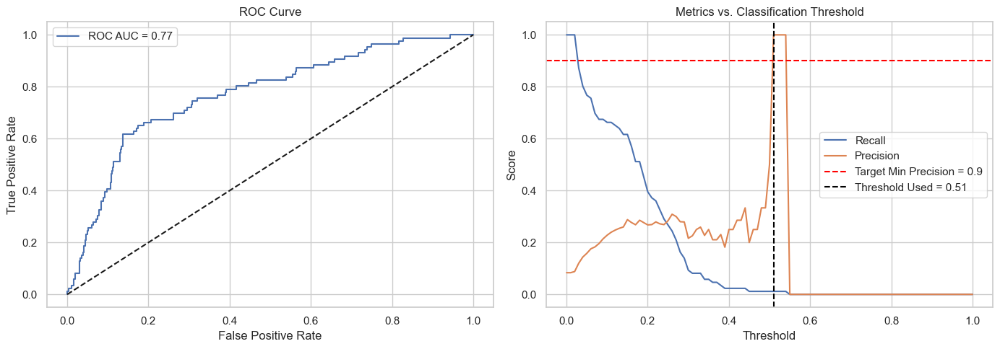

In [279]:
# Iterating through models and saving best models in the dictionaryfor future assessments
best_models_dict = {}  # Dictionary to store each best_model by name

for name, model in models.items():
    model_name = f"{name}_grid_search_retry"    ##### Added "retry"
    print(f"🔍 Running {model_name}...")

    metrics_df, best_model, predictions_df = run_flex_binary_class_model(
        df = stars_df,
        model = model,
        numeric_features = numeric_features,
        categorical_features = categorical_features,
        use_scaler = (name in ["lasso_lr", "svc"]),   
        use_imputer = True,
        use_polynomial = False,
        use_grid_search = True,
        param_grid = param_grids[name],
        optimize_recall_with_precision_threshold = True,
        target_min_precision = 0.9,
        random_state = 100,                            ##### Changed from 1 to 100
        test_size = 0.25                               ##### Changed from 0.3 to 0.25
    )

    # Store results
    results_df = store_metrics(results_df, model_name, metrics_df)

    best_models_dict[model_name] = best_model

Hmmmmm... so different random seed values and different test_size significantly affected model's results. The likely reason is that the dataset is not that large and when we are running 5-fold cv, the breakdowns of training set may have imbalanced target variable subsets. This essentially makes 5-fold cross-validation useless. Let's try doing a 3-fold validation and see if GridSearchCV yields more stable results.

🔍 Running lasso_lr_grid_search_cv3...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.40


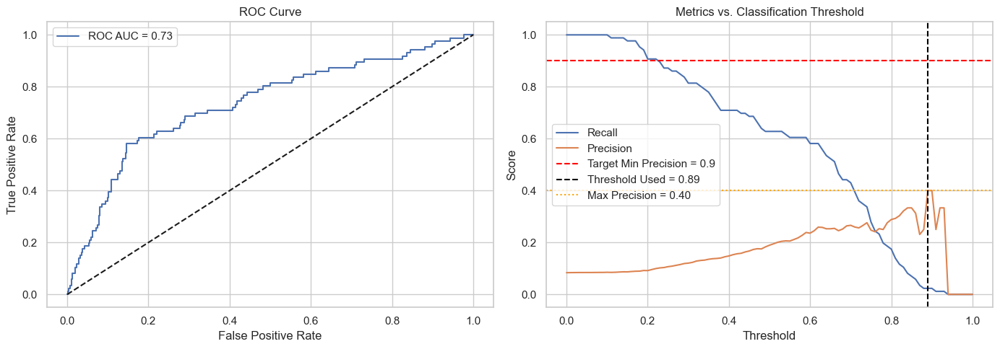

🔍 Running dt_grid_search_cv3...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.23


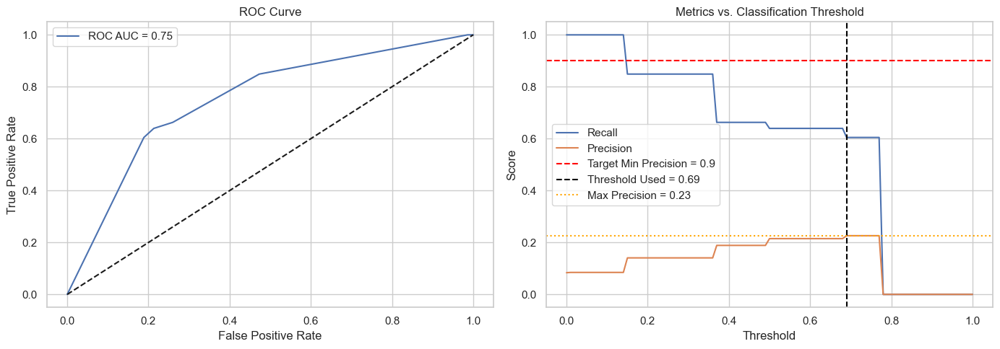

🔍 Running rf_grid_search_cv3...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.55


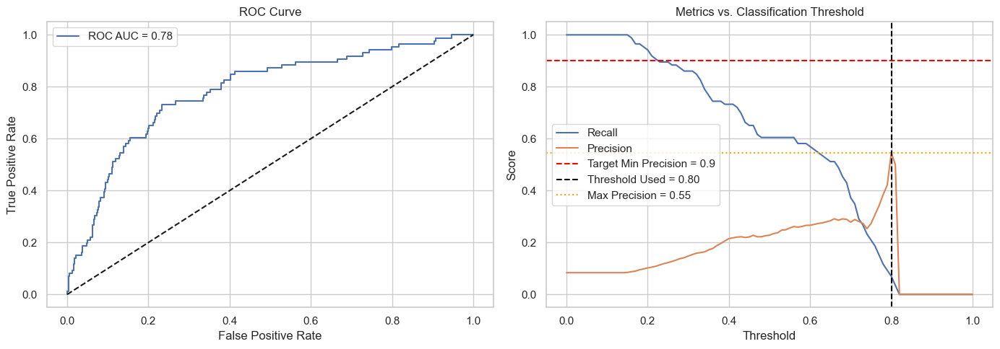

🔍 Running svc_grid_search_cv3...


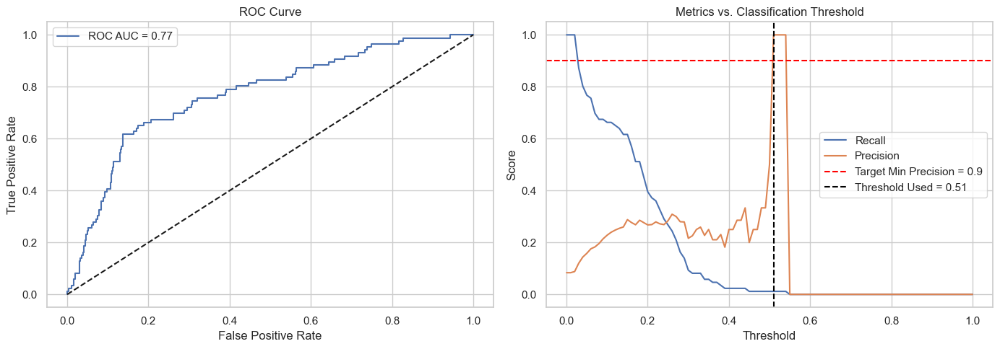

In [281]:
# Iterating through models and saving best models in the dictionaryfor future assessments
best_models_dict = {}  # Dictionary to store each best_model by name

for name, model in models.items():
    model_name = f"{name}_grid_search_cv3"    ##### Added "cv3"
    print(f"🔍 Running {model_name}...")

    metrics_df, best_model, predictions_df = run_flex_binary_class_model(
        df = stars_df,
        model = model,
        numeric_features = numeric_features,
        categorical_features = categorical_features,
        use_scaler = (name in ["lasso_lr", "svc"]),   
        use_imputer = True,
        use_polynomial = False,
        use_grid_search = True,
        cv_folds = 3,                                  ##### Changed from default 5 to 3
        param_grid = param_grids[name],
        optimize_recall_with_precision_threshold = True,
        target_min_precision = 0.9,
        random_state = 100,                            ##### Changed from 1 to 100
        test_size = 0.25                               ##### Changed from 0.3 to 0.25
    )

    # Store results
    results_df = store_metrics(results_df, model_name, metrics_df)

    best_models_dict[model_name] = best_model

🔍 Running lasso_lr_grid_search_cv3_retry...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.50


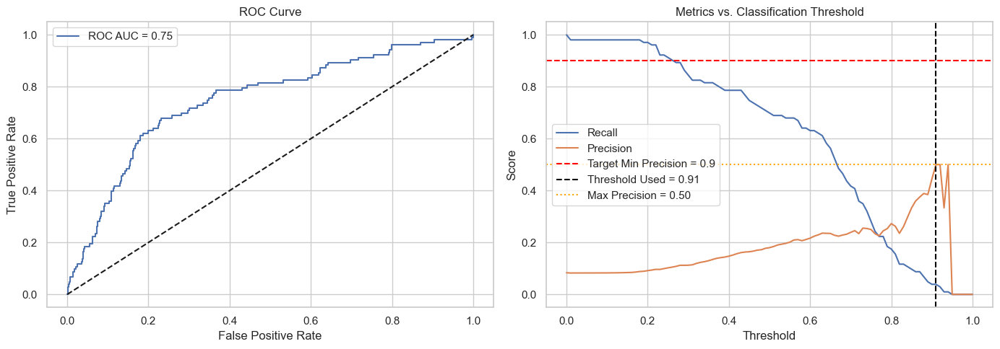

🔍 Running dt_grid_search_cv3_retry...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.23


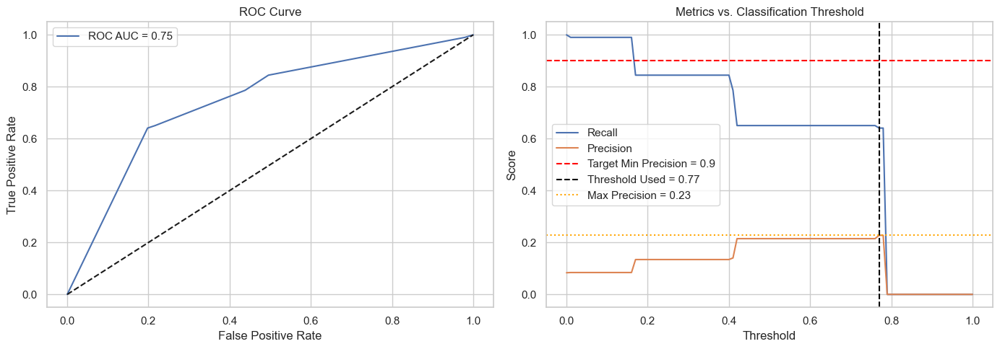

🔍 Running rf_grid_search_cv3_retry...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.67


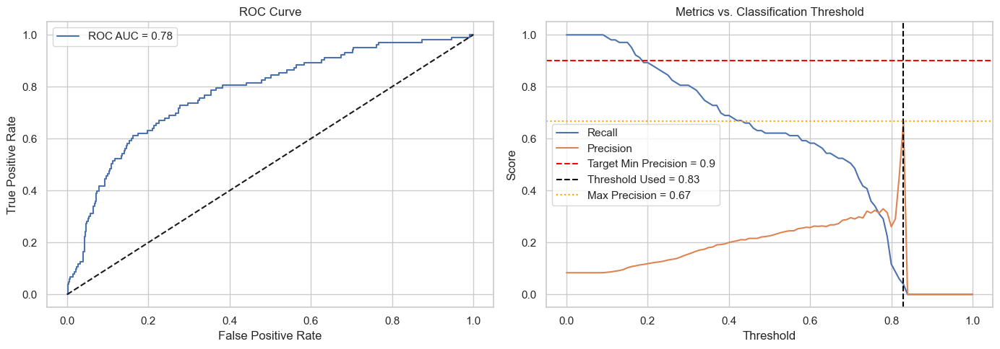

🔍 Running svc_grid_search_cv3_retry...
No threshold found with precision ≥ 0.9. Falling back to max precision = 0.50


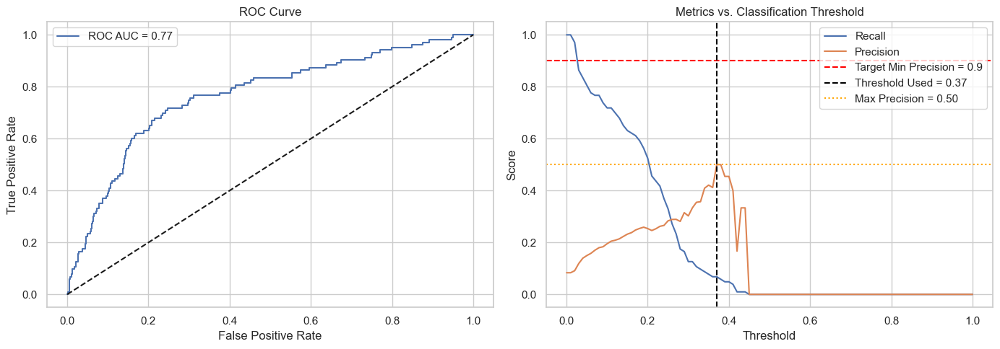

In [282]:
# Iterating through models and saving best models in the dictionaryfor future assessments
best_models_dict = {}  # Dictionary to store each best_model by name

for name, model in models.items():
    model_name = f"{name}_grid_search_cv3_retry"    ##### Added "retry"
    print(f"🔍 Running {model_name}...")

    metrics_df, best_model, predictions_df = run_flex_binary_class_model(
        df = stars_df,
        model = model,
        numeric_features = numeric_features,
        categorical_features = categorical_features,
        use_scaler = (name in ["lasso_lr", "svc"]),   
        use_imputer = True,
        use_polynomial = False,
        use_grid_search = True,
        cv_folds = 3,                                  ##### Keeping at 3
        param_grid = param_grids[name],
        optimize_recall_with_precision_threshold = True,
        target_min_precision = 0.9,
        random_state = 1,                              ##### Changed from 100 back to 1
        test_size = 0.3                                ##### Changed from 0.25 back to 0.3
    )

    # Store results
    results_df = store_metrics(results_df, model_name, metrics_df)

    best_models_dict[model_name] = best_model

In [283]:
# Viewing the results
results_df

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_base,0.778251,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
logreg_no_spectral_type,0.776908,0.916262,0.500000,0.014493,754.0,1.0,68.0,1.0,0.92
logreg_no_spectral_type_0.73,0.776908,0.876214,0.296296,0.347826,698.0,57.0,45.0,24.0,0.73
logreg_minimal_features,0.764833,0.916262,0.500000,0.028986,753.0,2.0,67.0,2.0,0.90
logreg_minimal_features_0.71,0.764833,0.865291,0.281250,0.391304,686.0,69.0,42.0,27.0,0.71
lasso_reg_1.0_all_features,0.777618,0.917476,1.000000,0.014493,755.0,0.0,68.0,1.0,0.91
lasso_reg_1.0_poly_4,0.774201,0.916262,0.500000,0.043478,752.0,3.0,66.0,3.0,0.99
lasso_reg_1.0_poly_2,0.832652,0.876214,0.333333,0.478261,689.0,66.0,36.0,33.0,0.70
dtree_depth_5,0.748556,0.855583,0.264151,0.405797,677.0,78.0,41.0,28.0,0.80
dtree_depth_10,0.683837,0.841019,0.265152,0.507246,658.0,97.0,34.0,35.0,0.80


The metrics with cv = 5 and cv = 3 is almost exactly the same with the same "instability" present... To summarize:

**Problem:** After experimenting with multiple classifiers (Logistic Regression, Random Forest, Decision Tree, SVC) and tuning their hyperparameters using **GridSearchCV**, we observed that:

- Changing the **random_state** (i.e., data split) results in *significant variability* in model performance.
- This instability persists *even after switching from **cv = 5** to **cv = 3***, which we expected to help by improving class balance within folds.
- Despite exhaustive hyperparameter tuning, the *best model parameters fluctuate depending on the data split*, and overall performance metrics (e.g., Recall, Precision, ROC AUC) remain inconsistent.

**Inference:** While **GridSearchCV** is a powerful tool for model optimization, in our specific case the dataset appears to be *relatively small and imbalanced*, particularly for the positive class (stars with habitable-zone planets). Looks like the *performance variance introduced by different train/test splits* dominates any gain achieved through hyperparameter tuning. Therefore, *GridSearchCV is not yielding meaningful or stable improvements* across seeds, and its use on this dataset appears to not make sense.

**Next Step:** Pick the model to recommend to an imaginary customer and use this model to run on Gaia dataset of stars to identify the best candidates to go check first for exoplanets in HZ.

## 6. Running our analysis against Gaia catalog
We will run a consortium of models that we built earlier (with some modifications) against Gaia catalog to identify the best candidates to search for exoplanets in the HZ:
- We need consortium of models, since all of our models showed sensitivity against random_state and test_size, as mentioned above
- We need to adjust the models to include only variables that Gaia catalog carries

### 6.1. Aligning **stars_df** and Gaia datasets
Let's resurface **stars_df** with variable descriptions to assess what is and what is not in Gaia's dataset...

In [286]:
stars_df.columns

Index(['st_teff', 'st_lum', 'st_mass', 'st_rad', 'st_logg', 'st_met', 'st_age',
       'sy_dist_log', 'sy_pm', 'sy_snum', 'sy_gaiamag', 'st_spectype_group',
       'sy_pnum', 'hz_pnum', 'has_hz_planet', 'st_logg_filled'],
      dtype='object')

In [287]:
# Reassessing column descriptions for easier mapping to Gaia's catalog
column_stars_descriptions = {
    "st_teff": "Stellar effective temperature [K]",
    "st_lum": "Stellar luminosity [log 10 of Solar luminosities]",
    "st_mass": "Stellar mass [Solar masses]",
    "st_rad": "Stellar radius [Solar radii]",
    "st_logg": "Stellar surface gravity [log10(cm/s²)]",
    "st_met": "Stellar metallicity [dex]",
    "st_age": "Stellar age [Gyr]",
    "sy_dist_log": "Log10 distance to the system [pc]",
    "sy_pm": "Proper motion [mas/yr]",
    "sy_snum": "Number of stars in the system",
    "sy_gaiamag": "Gaia magnitude (brightness)",
    "st_spectype_group": "Spectral type group",
    "sy_pnum": "Number of planets in the system",
    "hz_pnum": "Number of HZ planets in the system",
    "has_hz_planet": "Whether the system hosts at least one HZ planet"
}

# Creating a describe dataframe for easier view
describe_df = stars_df.describe(include = "all").T

# Adding a description column for easier reading
describe_df.insert(0, "description", describe_df.index.map(column_stars_descriptions.get))

# Viewing the result
describe_df

,description,count,unique,top,freq,mean,std,min,25%,50%,75%,max
st_teff,Stellar effective temperature [K],4113.0,NaN,NaN,NaN,5394.766168,1321.504518,575.0,4931.0,5558.0,5906.0,40000.0
st_lum,Stellar luminosity [log 10 of Solar luminosities],4116.0,NaN,NaN,NaN,-0.102532,0.771294,-6.090356,-0.424824,-0.05443,0.294703,3.795105
st_mass,Stellar mass [Solar masses],4109.0,NaN,NaN,NaN,0.974431,0.337858,0.0147,0.822,0.97,1.11,9.1
st_rad,Stellar radius [Solar radii],4101.0,NaN,NaN,NaN,1.612799,4.088881,0.0115,0.788,0.972,1.29,88.475
st_logg,Stellar surface gravity [log10(cm/s²)],4107.0,NaN,NaN,NaN,4.351123,0.472076,0.541,4.26,4.447,4.56885,8.07
st_met,Stellar metallicity [dex],3725.0,NaN,NaN,NaN,0.018547,0.187243,-1.05,-0.07,0.02,0.13,0.69
st_age,Stellar age [Gyr],2580.0,NaN,NaN,NaN,4.376663,2.500158,0.001,2.82,4.17,5.13,15.9
sy_dist_log,Log10 distance to the system [pc],4030.0,NaN,NaN,NaN,2.437794,0.581265,0.114341,2.041162,2.576297,2.902065,3.53914
sy_pm,Proper motion [mas/yr],4096.0,NaN,NaN,NaN,93.326745,348.001265,0.158639,8.264557,18.334837,60.78363,10393.550832
sy_snum,Number of stars in the system,4116.0,NaN,NaN,NaN,1.103984,0.344897,1.0,1.0,1.0,1.0,4.0


To run analysis on top of Gaia's catalog, let's see which variables from **stars_df** are in Gaia directly, which are derivable from other variables that are in Gaia, and which are not needed...


| Feature               | Description                                         | Gaia DR3 Field / Method              | Availability     |
|-----------------------|-----------------------------------------------------|--------------------------------------|------------------|
| **st_teff**           | Stellar effective temperature (K)                   | `teff_gspphot`                       | Direct           |
| **st_lum**            | log10 Stellar luminosity (log10(Solar L))           | `luminosity` → `np.log10(lum)`       | Derivable        |
| **st_mass**           | Stellar mass (Solar masses)                         | `mass`                               | Direct           |
| **st_rad**            | Stellar radius (Solar radii)                        | `radius_gspphot`                     | Direct           |
| **st_logg**           | Surface gravity (log10(cm/s²))                      | `logg_gspphot`                       | Direct           |
| **st_met**            | Stellar metallicity (dex)                           | `metallicity`                        | Direct           |
| **st_age**            | Stellar age (Gyr)                                   | `age`                                | Direct           |
| **sy_dist_log**       | Log10 distance to the system (pc)                   | `log10(1000 / parallax)`             | Derivable        |
| **sy_pm**             | Proper motion (mas/yr)                              | `sqrt(pmra² + pmdec²)`               | Derivable        |
| **sy_snum**           | Number of stars in the system                       | Not available                        | Not available    |
| **sy_gaiamag**        | Gaia G-band magnitude                               | `phot_g_mean_mag`                    | Direct           |
| **st_spectype_group** | Spectral type group                                 | From `teff_gspphot` classification   | Derivable        |
| **sy_pnum**           | Number of planets in the system                     | Not available                        | Not needed       |
| **hz_pnum**           | Number of HZ planets in the system                  | Not available                        | Not needed       |
| **has_hz_planet**     | Whether system hosts a HZ planet (target label)     | Not applicable                       | Not needed       |
| **st_logg_filled**    | Internal flag from preprocessing                    | Not applicable                       | Not needed       |

**Deriving **st_spectype_group** from **st_teff**:**

We infer spectral type groups based on stellar effective temperature **st_teff** using typical astrophysical thresholds:

- **O-type**: **st_teff** > 30,000 K  
- **B-type**: 10,000 K < **st_teff** ≤ 30,000 K  
- **A-type**: 7,500 K < **st_teff** ≤ 10,000 K  
- **F-type**: 6,000 K < **st_teff** ≤ 7,500 K  
- **G-type**: 5,200 K < **st_teff** ≤ 6,000 K  
- **K-type**: 3,700 K < **st_teff** ≤ 5,200 K  
- **M-type**: **st_teff** ≤ 3,700 K

The latter means that we can derive the spectral_type even within our stars_df to rerun our models, but we will have to cut several variables that are not derivable... Let's start with derivation of spectral_type within stars_df...

In [289]:
stars_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4116 entries, 51 Peg to nu Oct A
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   st_teff            4113 non-null   float64
 1   st_lum             4116 non-null   float64
 2   st_mass            4109 non-null   float64
 3   st_rad             4101 non-null   float64
 4   st_logg            4107 non-null   float64
 5   st_met             3725 non-null   float64
 6   st_age             2580 non-null   float64
 7   sy_dist_log        4030 non-null   float64
 8   sy_pm              4096 non-null   float64
 9   sy_snum            4116 non-null   int32  
 10  sy_gaiamag         4075 non-null   float64
 11  st_spectype_group  4113 non-null   object 
 12  sy_pnum            4116 non-null   int64  
 13  hz_pnum            4116 non-null   int64  
 14  has_hz_planet      4116 non-null   int64  
 15  st_logg_filled     4116 non-null   bool   
dtypes: bool(1), float64(

In [290]:
stars_df["st_spectype_group"] = stars_df["st_teff"].apply(
    lambda t: (
        "O" if t > 30000 else
        "B" if t > 10000 else
        "A" if t > 7500 else
        "F" if t > 6000 else
        "G" if t > 5200 else
        "K" if t > 3700 else
        "M"
    ) if pd.notnull(t) else np.nan
)

stars_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4116 entries, 51 Peg to nu Oct A
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   st_teff            4113 non-null   float64
 1   st_lum             4116 non-null   float64
 2   st_mass            4109 non-null   float64
 3   st_rad             4101 non-null   float64
 4   st_logg            4107 non-null   float64
 5   st_met             3725 non-null   float64
 6   st_age             2580 non-null   float64
 7   sy_dist_log        4030 non-null   float64
 8   sy_pm              4096 non-null   float64
 9   sy_snum            4116 non-null   int32  
 10  sy_gaiamag         4075 non-null   float64
 11  st_spectype_group  4113 non-null   object 
 12  sy_pnum            4116 non-null   int64  
 13  hz_pnum            4116 non-null   int64  
 14  has_hz_planet      4116 non-null   int64  
 15  st_logg_filled     4116 non-null   bool   
dtypes: bool(1), float64(

Now, we have all the spectral types in our stars dataframe. Let's limit the number of variables to only those that are present or derivable in the Gaia catalog and rerun our modeling...

### 6.2. Rebuilding models on the trimmed variables from **stars_df**
Now, we will run several hand-picked models, using results from **results_df** as a proxy on how these models will behave. We will then use a consortium of those models to calculate recommendations of the best candidates from Gaia (those that have the highest probabilities of having planets in their HZ based on the consortium of models)...

In [292]:
# Redefining features to match what's present in Gaia
numeric_features = [
    "st_teff",        # direct from Gaia
    "st_lum",         # will be derived: log10(lum_gspphot)
    "st_mass",        # direct from Gaia
    "st_rad",         # direct from Gaia
    "st_logg",        # direct from Gaia
    "st_met",         # direct from Gaia
    "st_age",         # direct from Gaia
    "sy_dist_log",    # will be derived: log10(1000 / parallax)
    "sy_pm",          # will be derived: sqrt(pmra² + pmdec²)
    "sy_gaiamag"      # will be direct: phot_g_mean_mag
]

categorical_features = ["st_spectype_group"]  # will be derived from surface temperature

No threshold found with precision ≥ 0.7. Falling back to max precision = 0.67


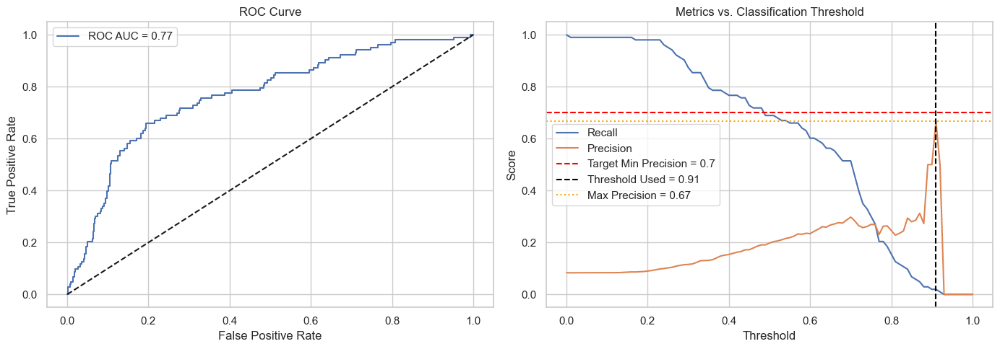

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_l1,0.766381,0.917409,0.666667,0.019417,1131.0,1.0,101.0,2.0,0.91


In [293]:
# Defining and running the LR
model_name = "logreg_l1"
lr = LogisticRegression(penalty = "l1", solver = "liblinear", class_weight = "balanced", max_iter = 1000)

metrics, best_model_logreg_l1, _ = run_flex_binary_class_model(
    df = stars_df,
    model = lr,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = True,
    use_imputer = True,
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.7,
    random_state = 42,
    test_size = 0.3
)

# Storing the results
new_results_df = pd.DataFrame(columns = metrics.columns)
new_results_df = store_metrics(new_results_df, model_name, metrics)
new_results_df

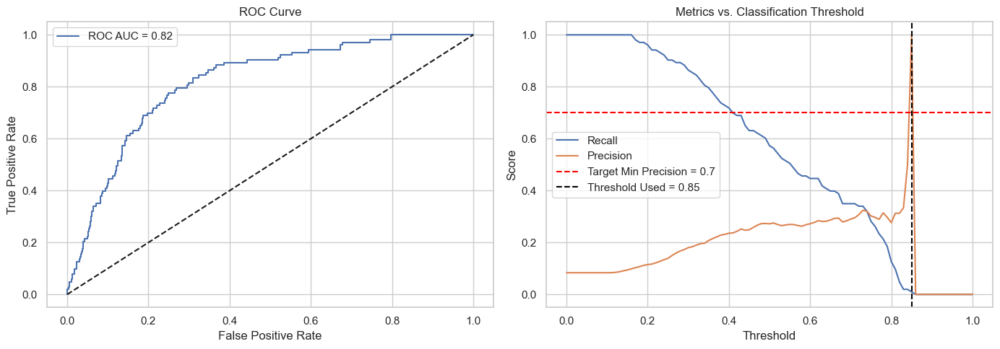

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_l1,0.766381,0.917409,0.666667,0.019417,1131.0,1.0,101.0,2.0,0.91
forest_100_trees_depth_5,0.817953,0.917409,1.000000,0.009709,1132.0,0.0,102.0,1.0,0.85


In [294]:
# Defining and running the first Random Forest
model_name = "forest_100_trees_depth_5"
rf_depth_5 = RandomForestClassifier(n_estimators = 100, max_depth = 5, class_weight = "balanced", random_state = 42)

metrics, best_model_logreg_l1, _ = run_flex_binary_class_model(
    df = stars_df,
    model = rf_depth_5,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = False,
    use_imputer = True,
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.7,
    random_state = 42,
    test_size = 0.3
)

# Storing the results
new_results_df = store_metrics(new_results_df, model_name, metrics)
new_results_df

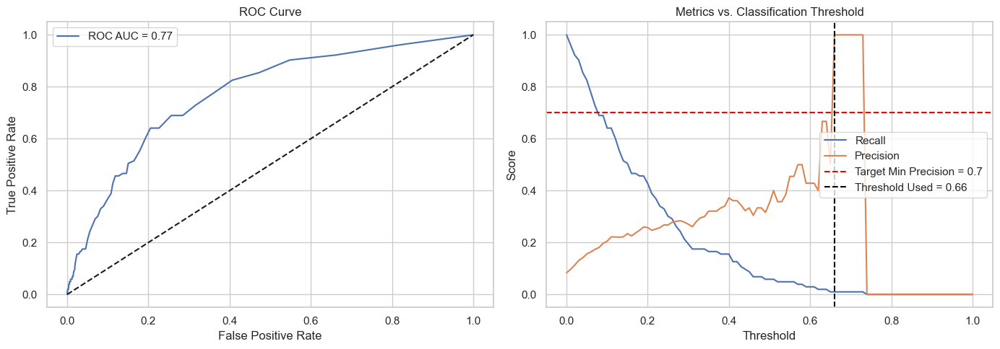

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_l1,0.766381,0.917409,0.666667,0.019417,1131.0,1.0,101.0,2.0,0.91
forest_100_trees_depth_5,0.817953,0.917409,1.000000,0.009709,1132.0,0.0,102.0,1.0,0.85
forest_100_trees_unlim,0.771068,0.917409,1.000000,0.009709,1132.0,0.0,102.0,1.0,0.66


In [295]:
# Defining and running the second Random Forest
model_name = "forest_100_trees_unlim"
rf_depth_unlim = RandomForestClassifier(n_estimators = 100, class_weight = "balanced", random_state = 42)

metrics, best_model_logreg_l1, _ = run_flex_binary_class_model(
    df = stars_df,
    model = rf_depth_unlim,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = False,
    use_imputer = True,
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.7,
    random_state = 42,
    test_size = 0.3
)

# Storing the results
new_results_df = store_metrics(new_results_df, model_name, metrics)
new_results_df

No threshold found with precision ≥ 0.7. Falling back to max precision = 0.48


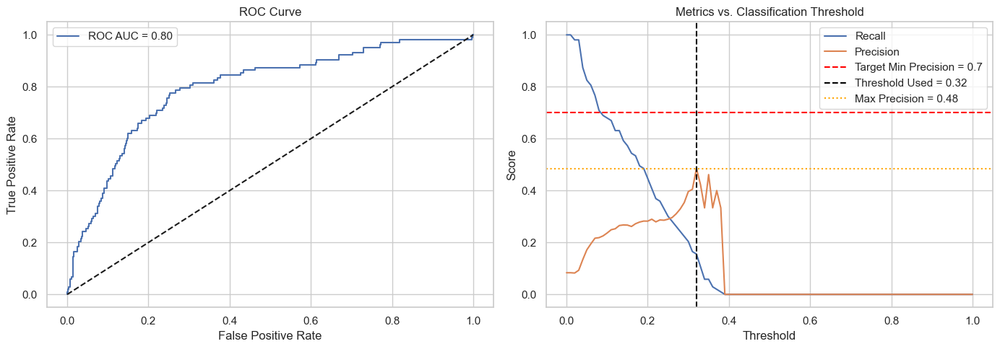

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_l1,0.766381,0.917409,0.666667,0.019417,1131.0,1.0,101.0,2.0,0.91
forest_100_trees_depth_5,0.817953,0.917409,1.000000,0.009709,1132.0,0.0,102.0,1.0,0.85
forest_100_trees_unlim,0.771068,0.917409,1.000000,0.009709,1132.0,0.0,102.0,1.0,0.66
svc,0.795671,0.915789,0.484848,0.155340,1115.0,17.0,87.0,16.0,0.32


In [296]:
# Defining and running the SVC
model_name = "svc"
svc = SVC(kernel = "rbf", probability = True, class_weight = "balanced", random_state = 42)

metrics, best_model_logreg_l1, _ = run_flex_binary_class_model(
    df = stars_df,
    model = svc,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = True,
    use_imputer = True,
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.7,
    random_state = 42,
    test_size = 0.3
)

# Storing the results
new_results_df = store_metrics(new_results_df, model_name, metrics)
new_results_df

No threshold found with precision ≥ 0.7. Falling back to max precision = 0.25


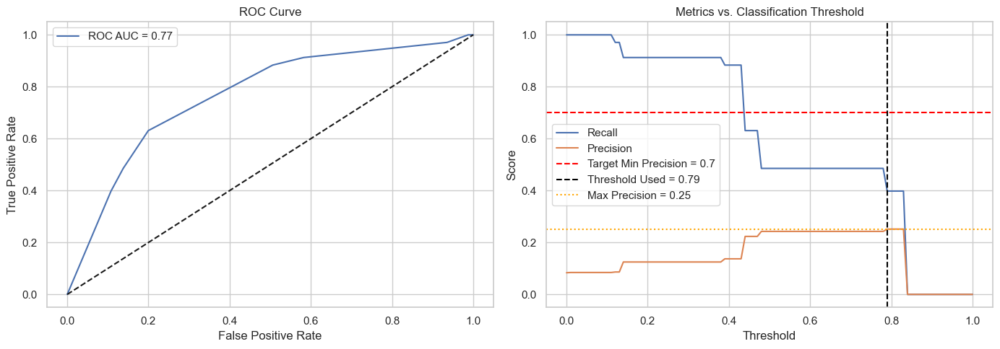

,ROC AUC,Accuracy,Precision,Recall,True Neg,False Pos,False Neg,True Pos,Threshold
logreg_l1,0.766381,0.917409,0.666667,0.019417,1131.0,1.0,101.0,2.0,0.91
forest_100_trees_depth_5,0.817953,0.917409,1.000000,0.009709,1132.0,0.0,102.0,1.0,0.85
forest_100_trees_unlim,0.771068,0.917409,1.000000,0.009709,1132.0,0.0,102.0,1.0,0.66
svc,0.795671,0.915789,0.484848,0.155340,1115.0,17.0,87.0,16.0,0.32
tree_depth_3,0.766103,0.851012,0.251534,0.398058,1010.0,122.0,62.0,41.0,0.79


In [297]:
# Defining and running the shallow tree
model_name = "tree_depth_3"
shallow_tree = DecisionTreeClassifier(max_depth = 3, class_weight = "balanced", random_state = 42)

metrics, best_model_logreg_l1, _ = run_flex_binary_class_model(
    df = stars_df,
    model = shallow_tree,
    numeric_features = numeric_features,
    categorical_features = categorical_features,
    use_scaler = False,
    use_imputer = True,
    use_polynomial = False,
    optimize_recall_with_precision_threshold = True,
    target_min_precision = 0.7,
    random_state = 42,
    test_size = 0.3
)

# Storing the results
new_results_df = store_metrics(new_results_df, model_name, metrics)
new_results_df

Note that the picked threshold and individual metrics are not as important for our goals, as we're not looking to run these classification models on Gaia catalog and use derived labels for **has_hz_planet**. We are planning to use **y_proba** vector to understand what are the most lucrative low-hanging fruits researchers should pursue next. Now, our models are ready, so let's query Gaia catalog to retrieve the dataset!

### 6.3. Pulling the Gaia catalog data and transforming it to fit our models

**Gaia DR3 Stellar Data (Preloaded)**

To build a predictive model of habitability likelihood, we are using stellar data from the Gaia DR3 catalog. Originally, this dataset was queried directly via the ESA Gaia Archive TAP service using the `astroquery` package, with a query that retrieved ~500,000 stars along with key physical attributes such as temperature, metallicity, luminosity, mass, radius, motion, and photometry.

However, since that query is time-consuming and requires login credentials, we provide a pre-downloaded version of the dataset in `data/gaia_df.csv` for convenience. This allows readers to reproduce all subsequent analysis steps without needing to query Gaia servers themselves.

In [299]:
import pandas as pd

gaia_df = pd.read_csv("data/gaia_df.csv")
gaia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   DESIGNATION      500000 non-null  object 
 1   ra               500000 non-null  float64
 2   dec              500000 non-null  float64
 3   parallax         500000 non-null  float64
 4   pmra             500000 non-null  float64
 5   pmdec            500000 non-null  float64
 6   phot_g_mean_mag  500000 non-null  float64
 7   teff_gspphot     500000 non-null  float64
 8   mh_gspphot       500000 non-null  float64
 9   logg_gspphot     500000 non-null  float64
 10  radius_gspphot   500000 non-null  float64
 11  lum_flame        500000 non-null  float64
 12  mass_flame       500000 non-null  float64
 13  age_flame        500000 non-null  float64
dtypes: float64(13), object(1)
memory usage: 53.4+ MB


In [300]:
gaia_df.head(10)

,DESIGNATION,ra,dec,parallax,pmra,pmdec,phot_g_mean_mag,teff_gspphot,mh_gspphot,logg_gspphot,radius_gspphot,lum_flame,mass_flame,age_flame
0,Gaia DR3 6030020838301513600,256.461216,-28.454211,0.073901,-4.773396,-6.738861,16.541430,5308.6743,-0.4522,3.6862,2.3108,3.360722,1.159332,6.519261
1,Gaia DR3 6030020838301513856,256.467118,-28.449424,0.390357,-3.178060,-0.711247,15.948310,5664.6070,-0.1391,4.4614,0.9354,2.764359,1.045743,9.244729
2,Gaia DR3 6030020838301517952,256.459995,-28.450299,0.129218,-2.742661,-3.101740,15.708343,4842.3130,0.0153,3.3608,3.4635,5.631652,1.061463,9.485735
3,Gaia DR3 6030020868250061312,256.480366,-28.436090,0.910130,-3.652339,-4.553047,14.910186,5935.0044,-0.4818,4.2442,1.1355,1.368368,0.962142,10.665052
4,Gaia DR3 6030020868250070144,256.472956,-28.433287,0.079913,-5.806520,-4.941893,15.546175,4825.3110,0.0199,3.3426,3.5045,6.961635,1.070794,9.239059
5,Gaia DR3 6030020868250776192,256.476935,-28.449595,0.838424,-5.945705,-7.559461,17.664896,4354.1550,-1.2820,4.8524,0.4280,0.170833,0.673641,3.558057
6,Gaia DR3 6030020868255984768,256.485088,-28.441658,0.726988,-2.323795,0.295159,17.138163,4609.7330,-0.7674,4.7305,0.5458,0.324763,0.733168,8.213739
7,Gaia DR3 6030020868272910976,256.477225,-28.445795,0.127485,-0.113710,-7.618974,15.776240,5353.0195,-0.4923,3.7137,2.1922,35.203396,2.051579,1.086907
8,Gaia DR3 6030020872661253504,256.478324,-28.439715,0.136494,-6.882795,-3.108793,15.531355,4862.1636,-0.0878,2.7151,9.2057,31.580217,2.602307,0.556860
9,Gaia DR3 6030020872661253632,256.472467,-28.443500,0.076017,-2.714920,-4.687132,15.366931,5098.4370,-0.7941,2.6468,9.7652,99.071014,2.785498,0.456089


In [301]:
len(gaia_df['DESIGNATION'].value_counts())

500000

We have queried 500,000 stars with unique designations. Next step is to filter gaia_df to only have those source_ids that aren't present in stars:

In [303]:
# Pulling used Gaia source IDs from the older working dataframe df

# Dropping NaNs and ensuring both sides are strings for reliable matching
used_gaia_ids = df['gaia_id'].dropna().astype(str)

# Filterring out stars from gaia_df that were already used
gaia_df_filtered = gaia_df[~gaia_df['DESIGNATION'].astype(str).isin(used_gaia_ids)]

# Confirm how many rows are left
print(f"Filtered down to {len(gaia_df_filtered):,} stars after removing overlap.")

Filtered down to 500,000 stars after removing overlap.


The number of stars didn't change! Let's now convert all variables to the same format and derive those that need to be derived:

In [305]:
# Deriving log-luminosity, log-distance, and proper motion
gaia_df['st_lum'] = np.log10(gaia_df['lum_flame'])
gaia_df['sy_dist_log'] = np.log10(1000.0 / gaia_df['parallax'])  # in parsecs
gaia_df['sy_pm'] = np.sqrt(gaia_df['pmra']**2 + gaia_df['pmdec']**2)

# Renaming columns to match stars_df
gaia_df = gaia_df.rename(columns = {
    'teff_gspphot': 'st_teff',
    'mass_flame': 'st_mass',
    'age_flame': 'st_age',
    'mh_gspphot': 'st_met',
    'logg_gspphot': 'st_logg',
    'phot_g_mean_mag': 'sy_gaiamag',
    'radius_gspphot': 'st_rad'
})

# Assigning spectral type group based on effective temperature
gaia_df['st_spectype_group'] = gaia_df['st_teff'].apply(
    lambda t: (
        "O" if t > 30000 else
        "B" if t > 10000 else
        "A" if t > 7500 else
        "F" if t > 6000 else
        "G" if t > 5200 else
        "K" if t > 3700 else
        "M"
    )
)

# Keeping only the aligned columns
gaia_df_clean = gaia_df[[
    'DESIGNATION',          # for matching
    'st_teff',
    'st_lum',
    'st_mass',
    'st_rad',
    'st_logg',
    'st_met',
    'st_age',
    'sy_dist_log',
    'sy_pm',
    'sy_gaiamag',
    'st_spectype_group'
]]

gaia_df_clean.head(10)

,DESIGNATION,st_teff,st_lum,st_mass,st_rad,st_logg,st_met,st_age,sy_dist_log,sy_pm,sy_gaiamag,st_spectype_group
0,Gaia DR3 6030020838301513600,5308.6743,0.526433,1.159332,2.3108,3.6862,-0.4522,6.519261,4.131350,8.258181,16.541430,G
1,Gaia DR3 6030020838301513856,5664.6070,0.441595,1.045743,0.9354,4.4614,-0.1391,9.244729,3.408538,3.256676,15.948310,G
2,Gaia DR3 6030020838301517952,4842.3130,0.750636,1.061463,3.4635,3.3608,0.0153,9.485735,3.888676,4.140408,15.708343,K
3,Gaia DR3 6030020868250061312,5935.0044,0.136203,0.962142,1.1355,4.2442,-0.4818,10.665052,3.040897,5.836936,14.910186,G
4,Gaia DR3 6030020868250070144,4825.3110,0.842711,1.070794,3.5045,3.3426,0.0199,9.239059,4.097385,7.624826,15.546175,K
5,Gaia DR3 6030020868250776192,4354.1550,-0.767428,0.673641,0.4280,4.8524,-1.2820,3.558057,3.076536,9.617528,17.664896,K
6,Gaia DR3 6030020868255984768,4609.7330,-0.488434,0.733168,0.5458,4.7305,-0.7674,8.213739,3.138473,2.342465,17.138163,K
7,Gaia DR3 6030020868272910976,5353.0195,1.546585,2.051579,2.1922,3.7137,-0.4923,1.086907,3.894542,7.619823,15.776240,G
8,Gaia DR3 6030020872661253504,4862.1636,1.499415,2.602307,9.2057,2.7151,-0.0878,0.556860,3.864888,7.552315,15.531355,K
9,Gaia DR3 6030020872661253632,5098.4370,1.995947,2.785498,9.7652,2.6468,-0.7941,0.456089,4.119092,5.416641,15.366931,K


In [306]:
gaia_df = gaia_df_clean
gaia_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 12 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   DESIGNATION        500000 non-null  object 
 1   st_teff            500000 non-null  float64
 2   st_lum             500000 non-null  float64
 3   st_mass            500000 non-null  float64
 4   st_rad             500000 non-null  float64
 5   st_logg            500000 non-null  float64
 6   st_met             500000 non-null  float64
 7   st_age             500000 non-null  float64
 8   sy_dist_log        499206 non-null  float64
 9   sy_pm              500000 non-null  float64
 10  sy_gaiamag         500000 non-null  float64
 11  st_spectype_group  500000 non-null  object 
dtypes: float64(10), object(2)
memory usage: 45.8+ MB


Now our **gaia_df** is the same as **stars_df** and we can use it for predicting probabilities of stars having planets in habitable zone. Let's reloop through training the same models as we did above with additional clause of applying those models to **gaia_df**:

Training: logreg_l1
No threshold found with precision ≥ 0.7. Falling back to max precision = 0.67


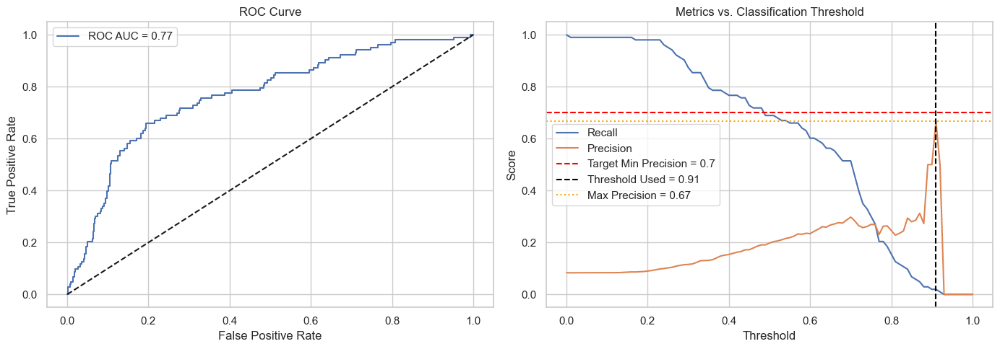

Done: logreg_l1
Training: forest_depth_5


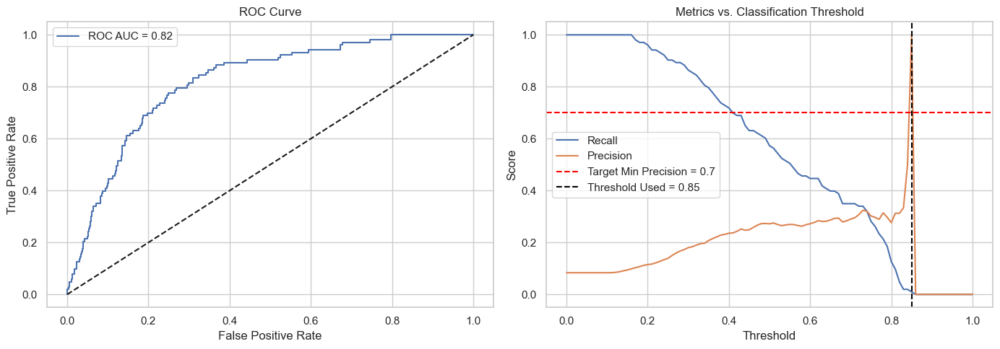

Done: forest_depth_5
Training: forest_unlim


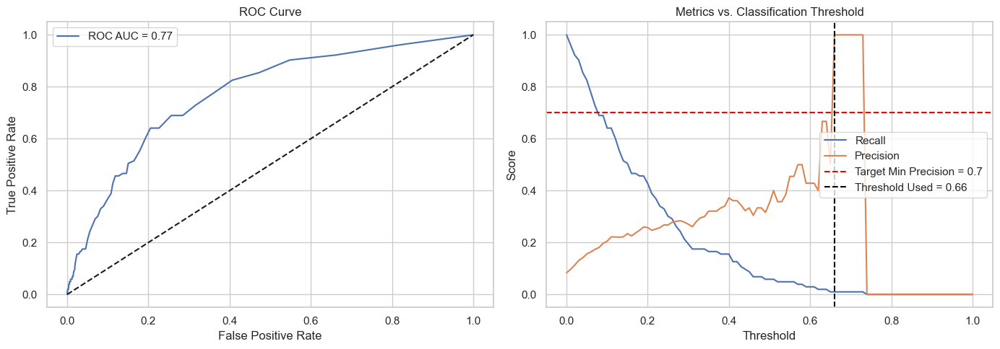

Done: forest_unlim
Training: svc_rbf
No threshold found with precision ≥ 0.7. Falling back to max precision = 0.48


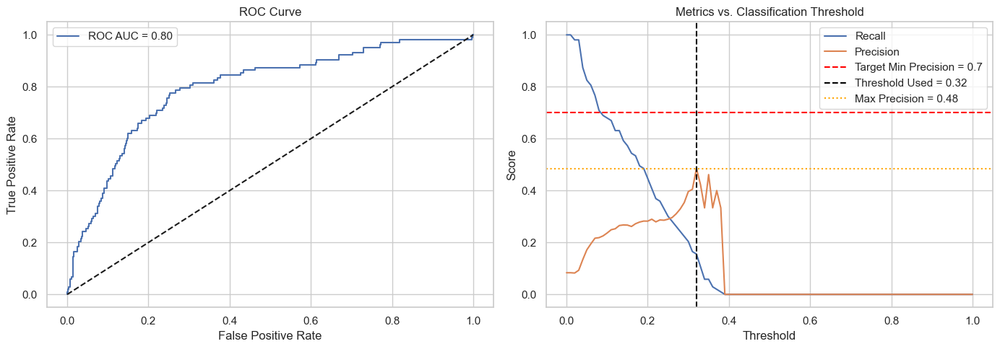

Done: svc_rbf
Training: tree_depth_3
No threshold found with precision ≥ 0.7. Falling back to max precision = 0.25


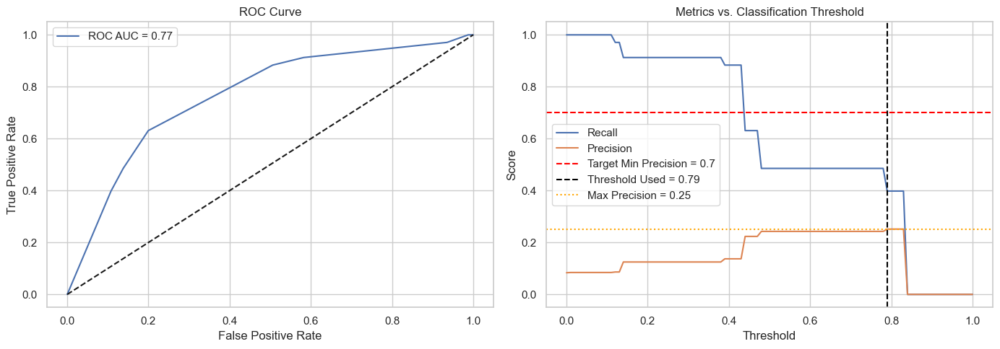

Done: tree_depth_3


,score_logreg_l1,score_forest_depth_5,score_forest_unlim,score_svc_rbf,score_tree_depth_3
count,5.000000e+05,500000.000000,500000.000000,500000.000000,500000.000000
mean,1.771768e-01,0.306812,0.075566,0.050237,0.326296
std,7.791093e-02,0.093923,0.046024,0.040772,0.127093
min,1.486551e-49,0.104869,0.000000,0.012879,0.000000
25%,1.282464e-01,0.227952,0.040000,0.028867,0.139120
50%,1.880308e-01,0.297402,0.070000,0.039682,0.381929
75%,2.197544e-01,0.385440,0.100000,0.052225,0.430666
max,8.447000e-01,0.798083,0.520000,0.336703,0.831890


In [308]:
# Redefining features
numeric_features = [
    "st_teff",
    "st_lum",
    "st_mass",
    "st_rad",
    "st_logg",
    "st_met",
    "st_age",
    "sy_dist_log",
    "sy_pm",
    "sy_gaiamag"
]

categorical_features = ["st_spectype_group"]

# Redefining all models
models = {
    "logreg_l1": LogisticRegression(penalty = "l1", solver = "liblinear", class_weight = "balanced", max_iter = 1000),
    "forest_depth_5": RandomForestClassifier(n_estimators = 100, max_depth = 5, class_weight = "balanced", random_state = 42),
    "forest_unlim": RandomForestClassifier(n_estimators = 100, class_weight = "balanced", random_state = 42),
    "svc_rbf": SVC(kernel = "rbf", probability = True, class_weight = "balanced", random_state = 42),
    "tree_depth_3": DecisionTreeClassifier(max_depth = 3, class_weight = "balanced", random_state = 42)
}

# Defining preprocessing requirements per model to smoothly apply scaler in the function calls
scaling_req = {
    "logreg_l1": True,
    "forest_depth_5": False,
    "forest_unlim": False,
    "svc_rbf": True,
    "tree_depth_3": False
}

# Train and apply each model
for model_name, model_instance in models.items():
    print(f"Training: {model_name}")
    use_scaler = scaling_req[model_name]

    # Train model
    metrics, best_pipeline, _ = run_flex_binary_class_model(
        df = stars_df,
        model = model_instance,
        numeric_features = numeric_features,
        categorical_features = categorical_features,
        use_scaler = use_scaler,
        use_imputer = True,
        use_polynomial = False,
        optimize_recall_with_precision_threshold = True,
        target_min_precision = 0.7,
        random_state = 42,
        test_size = 0.3
    )

    # Predict on Gaia stars
    X_gaia = gaia_df[numeric_features + categorical_features].copy()
    gaia_df[f"score_{model_name}"] = best_pipeline.predict_proba(X_gaia)[:, 1]
    print(f"Done: {model_name}")

# Preview scores
gaia_df[[col for col in gaia_df.columns if col.startswith("score_")]].describe()

Okay, we finally have probabilities assigned by models to each of the stars in **gaia_df**. Let's calculate the top performers (on average and max scores):

In [310]:
# Add a composite max/mean score if desired
gaia_df["score_max"] = gaia_df[[col for col in gaia_df.columns if col.startswith("score_")]].max(axis = 1)
gaia_df["score_avg"] = gaia_df[[col for col in gaia_df.columns if col.startswith("score_")]].mean(axis = 1)

# Sorting top 0.1% candidates for both max and avg
top_candidates_max = gaia_df.sort_values("score_max", ascending = False).head(int(len(gaia_df) * 0.0001))
top_candidates_avg = gaia_df.sort_values("score_avg", ascending = False).head(int(len(gaia_df) * 0.0001))

# Extracting unique DESIGNATIONs for both top lists
top_max_ids = set(top_candidates_max["DESIGNATION"])
top_avg_ids = set(top_candidates_avg["DESIGNATION"])

# Finding the overlap
overlap_ids = top_max_ids.intersection(top_avg_ids)
n_overlap = len(overlap_ids)

# Printing the results
print(f"Number of stars in both 0.1% lists: {n_overlap}")
print(f"Overlap percentage: {n_overlap / 5000:.1%}")

# Identifying top-of-the-top candidates
both_top_df = gaia_df[gaia_df["DESIGNATION"].isin(overlap_ids)]
both_top_df = both_top_df.sort_values("score_avg", ascending = False)
both_top_df

Number of stars in both 0.1% lists: 42
Overlap percentage: 0.8%


,DESIGNATION,st_teff,st_lum,st_mass,st_rad,st_logg,st_met,st_age,sy_dist_log,sy_pm,sy_gaiamag,st_spectype_group,score_logreg_l1,score_forest_depth_5,score_forest_unlim,score_svc_rbf,score_tree_depth_3,score_max,score_avg
493052,Gaia DR3 5542267270964254848,5193.7560,0.455724,1.090332,2.1125,4.0371,0.1964,8.280061,1.746421,108.215664,7.485166,K,0.753697,0.792028,0.52,0.323571,0.831890,0.831890,0.675513
454308,Gaia DR3 5098973942472679296,5543.7300,0.239010,0.946767,1.4323,4.2375,0.1313,13.256468,1.835585,187.834022,8.244769,G,0.729133,0.798083,0.47,0.154053,0.831890,0.831890,0.635842
481422,Gaia DR3 5086419581269459712,5309.5547,-0.270336,0.865687,0.8688,4.4972,-0.0798,8.679639,1.655132,117.374561,8.654196,G,0.741796,0.791891,0.35,0.226398,0.831890,0.831890,0.628978
133800,Gaia DR3 4498918632716948352,5678.8394,0.030557,0.945579,1.0711,4.3142,-0.1353,9.621063,1.781258,198.527491,8.510692,G,0.718487,0.790273,0.39,0.200137,0.831890,0.831890,0.627113
345706,Gaia DR3 2270771375724754816,5331.5020,-0.300903,0.900599,0.8302,4.5032,-0.0778,3.151319,1.509183,127.051043,7.998650,G,0.758485,0.765791,0.31,0.264484,0.831890,0.831890,0.627090
206123,Gaia DR3 5917231492323978880,5573.9907,0.250862,0.956467,1.4331,4.2298,-0.0315,12.713192,1.800827,127.758576,8.048586,G,0.737020,0.743323,0.37,0.183385,0.831890,0.831890,0.616251
443003,Gaia DR3 5085428886933218304,5539.1180,-0.150760,0.937664,0.9143,4.4322,-0.1202,5.188281,1.747782,103.720108,8.795145,G,0.701939,0.773116,0.33,0.190641,0.831890,0.831890,0.609913
175265,Gaia DR3 4499403105023922944,5911.1406,0.694612,1.261200,2.1428,3.9242,0.2355,4.504908,1.874842,22.907060,7.458589,G,0.670956,0.634446,0.37,0.279748,0.831890,0.831890,0.603155
261798,Gaia DR3 5902380972893138304,5695.6494,0.140018,0.953474,1.2104,4.3098,-0.1665,11.308901,1.843156,81.534231,8.533019,G,0.714147,0.746542,0.27,0.170902,0.831890,0.831890,0.594228
312151,Gaia DR3 5817572475614527232,5825.4900,0.072730,1.003705,1.0683,4.3710,-0.3478,6.087097,1.674519,37.609226,7.865412,G,0.740755,0.708896,0.23,0.217189,0.831890,0.831890,0.593437


We have identified top 42 candidates to take a look at. Now, let's plot the chart:

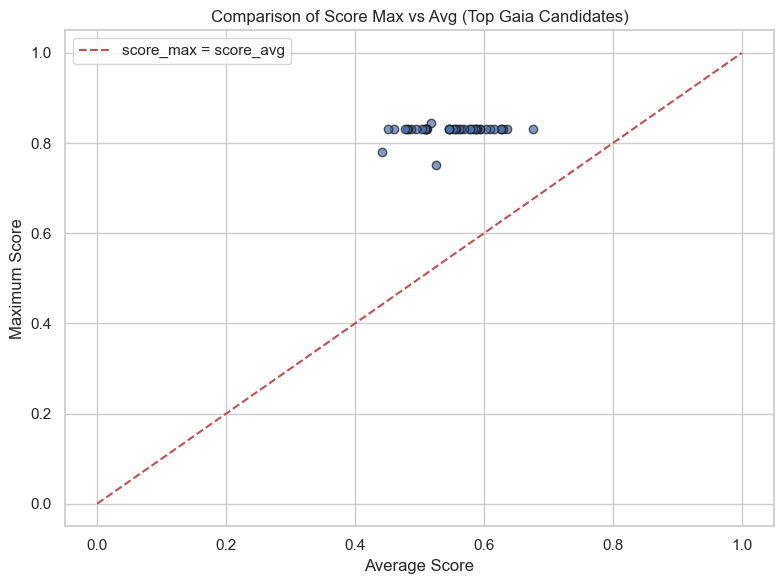

In [312]:
plt.figure(figsize = (8, 6))
plt.scatter(both_top_df["score_avg"], both_top_df["score_max"], alpha = 0.7, edgecolor = "k")
plt.plot([0, 1], [0, 1], "r--", label = "score_max = score_avg")
plt.xlabel("Average Score")
plt.ylabel("Maximum Score")
plt.title("Comparison of Score Max vs Avg (Top Gaia Candidates)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [313]:
list(both_top_df['DESIGNATION'].values)

['Gaia DR3 5542267270964254848',
 'Gaia DR3 5098973942472679296',
 'Gaia DR3 5086419581269459712',
 'Gaia DR3 4498918632716948352',
 'Gaia DR3 2270771375724754816',
 'Gaia DR3 5917231492323978880',
 'Gaia DR3 5085428886933218304',
 'Gaia DR3 4499403105023922944',
 'Gaia DR3 5902380972893138304',
 'Gaia DR3 5817572475614527232',
 'Gaia DR3 2265144899846776064',
 'Gaia DR3 5917074949359384320',
 'Gaia DR3 2269196668913927808',
 'Gaia DR3 4498902517999299456',
 'Gaia DR3 5253820673315693440',
 'Gaia DR3 5085349584656832896',
 'Gaia DR3 4499356783798651392',
 'Gaia DR3 4471087175915086080',
 'Gaia DR3 4499162449416966272',
 'Gaia DR3 2268964328362753280',
 'Gaia DR3 2267045818011982976',
 'Gaia DR3 5091129579844220032',
 'Gaia DR3 5095607993784297600',
 'Gaia DR3 2266234825107556224',
 'Gaia DR3 5099924843936375296',
 'Gaia DR3 5947520666842892544',
 'Gaia DR3 5080543413172761088',
 'Gaia DR3 2266513894902202368',
 'Gaia DR3 5098702775417593984',
 'Gaia DR3 5081933161508910208',
 'Gaia DR3

There is one clear outlier with the rest being clustered in one spot. Regardless, we recommend researchers to take a look at the main outlier **Gaia DR3 5542267270964254848** the first and then the rest of the stars in the list above. Unfortunately, Gaia doesn't store any other designations besides this ID for these stars, so there is no way to provide more user-friendly names!